In this iPython notebook, we will featurize MOR ligand binding simulation by pairwise distances between the ligand and different receptor residues. We will then perform tICA and prospectively build an MSM. 

In [1]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

# changing matplotlib the default style
matplotlib.style.use('ggplot')
#matplotlib.rcParams["figure.facecolor"] = "white"
#matplotlib.rcParams["savefig.transparent"] = "True"


In [2]:
import pandas as pd


from PDB_Order_Fixer import PDB_Order_Fixer
import mdtraj as md
import os
import numpy as np
import h5py

import datetime
import glob
import copy
from functools import partial 
import operator
import time

import random 
import subprocess
from subprocess import Popen
import sys
from custom_clusterer import *
from custom_tica import *
from custom_featurizer import *
from pdb_editing import *
from analysis import *
from io_functions import *
#from topology_fixing import *
from subsampling import *
from conversions import *
from custom_msm import *
from grids import *
from docking_analysis import *

from scipy import stats
import os
from efficacy_scripts import *




/home/enf/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


we are operating on biox3


In [3]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
from sklearn.preprocessing import scale

In [5]:
from detect_intermediates import *
from interpret_tICs import *

In [6]:
from msmbuilder.utils import verbosedump, verboseload


In [7]:
from b2ar_feature_types import *
#from b2ar_feature_types import *
from get_variable_names import *
from b2ar_tica_config import *
from residue import Residue, Atom

In [8]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.preprocessing import scale
from random import shuffle
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc

In [9]:

ori_feature_name = copy.deepcopy(feature_name)

In [10]:
#schemes = ["closest-heavy", "CA"]
#feature_name = "%s-CA" %ori_feature_name

In [11]:
rho = 0.01
rho_string = "_rho0pt01"
n_clusters = 25
n_samples = 1
lag_time=5
precision = "XP"

In [12]:
(active_ref_dir, inactive_ref_dir, simulation_ref_dir, scripts_dir,
          ligand_dir, agonist_dir, inverse_agonist_dir, biased_agonist_dir, ref_receptors_dir, whole_trajectory_pnas,
          sasa_file) = get_base_files(base)

tica_dir = get_tica_dir(base, is_sparse, lag_time, n_components, feature_name, 
                                 wolf_string, shrinkage_string, rho_string)
ori_tica_dir = copy.deepcopy(tica_dir)
features_dir = get_features_dir(base, feature_name)

landmarks_dir = get_landmarks_dir(tica_dir)
analysis_dir = get_analysis_dir(tica_dir, n_clusters, sampling_method)
gmm_dir = get_gmm_dir(tica_dir)
rf_dirdir = get_rf_dir(tica_dir)


ref_tica_dir, ref_tica_coords = get_ref_tica_dirs(tica_dir)

graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)

pnas_titles =  ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]
pnas_features_dir = analysis_dir


(clusterer_dir, msm_model_dir, macrostate_dir, features_known, model_dir, projected_features_dir,
         projection_operator_dir, ktica_fit_model_filename, ktica_projected_data_filename, nystroem_data_filename,
         mutual_information_csv, pearson_csv) = get_tica_files(base, tica_dir, n_clusters, msm_lag_time, n_macrostates)

(standardized_features_dir, feature_residues_csv, feature_residues_pkl,
          contact_csv, ref_features_dir) = get_feature_files(features_dir)

(kmeans_csv, tica_coords_csv, features_csv, active_rmsd_dir, inactive_rmsd_dir, active_pnas_dir, inactive_pnas_joined, active_pnas_joined,
        clusters_map_file, ktica_clusters_map_file, analysis_file, combined_file, docking_summary, docking_joined, docking_z_scores_csv,
        aggregate_docking, aggregate_docking_joined, docking_pnas_joined, aggregate_docking_pnas, aggregate_docking_pnas_joined, docking_multiple_ligands,
        docking_distances_file, docking_pdf, mmgbsa_docking_distances, pnas_coords, mmgbsa_dir, mmgbsa_csv, mmgbsa_pdf, aggregate_mmgbsa,
        aggregate_mmgbsa_joined, aggregate_mmgbsa_pnas_joined, mmgbsa_z_scores_csv, active_clusters_csv, intermediate_clusters_csv,
        inactive_clusters_csv, pnas_clusters_averages, tica_clusters_averages, tica_classes_csv, tica_samples_csv, subgraph_save_base,
        degree_save_base, degree_map_csv, degree_z_map_csv, aggregate_docking_pnas_degree_z_joined, tic_residue_csv, feature_coefs_csv,
        duplicated_feature_coefs_csv) = get_analysis_files(analysis_dir, n_clusters, tica_dir, tica_dir, sampling_method, n_samples, precision,
                                                           msm_lag_time)

(inactive_pnas_distances_dir, active_pnas_distances_dir, active_pnas_all_distances_dir,
          inactive_pnas_distances_new_csv, active_pnas_distances_new_csv, active_pnas_joined, active_pnas_means, pnas_coords_dir,
          pnas_coords_csv, pnas_all_coords_csv, pnas_coords_hexbin_dir, pnas_coords_co_crystallized_docking_dir,
          pnas_coords_active_colors_dir, user_defined_features_file, reaction_coordinates_trajs_file) = get_pnas_files(whole_trajectory_pnas, pnas_features_dir)

features_dir = get_features_dir(base, feature_name)



graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)
(scripts_dir, pymol_fixpdb_dir) = get_script_dir(scripts_dir)
(save_dir, reimaged_dir, mae_dir, combined_reimaged_dir, grid_dir, docking_dir) = get_docking_dirs(tica_dir, n_clusters, n_components, n_samples, sampling_method, precision)


/home/enf/b2ar_analysis/featuresall_residues_2rh1_3sn6_under_cutoff6A
/home/enf/b2ar_analysis/featuresall_residues_2rh1_3sn6_under_cutoff6A


In [13]:
print(inactive_ref_dir)
print(inactive_dir)

/home/enf/b2ar_analysis/2RH1_prepped.pdb
/home/enf/b2ar_analysis/2RH1_prepped.pdb


In [14]:
ref_receptors_dir

'/home/enf/b2ar_analysis/reference_receptors'

In [ ]:
#contact_residues = find_common_residues(get_trajectory_files(ref_receptors_dir, ".pdb"), "test.pkl")
contact_residues = convert_list_to_resobject_list([("A", r) for r in all_residues if r < 228] + [("C", r) for r in all_residues if r >= 265])

featurize_contacts_custom(ref_receptors_dir, features_dir = ref_features_dir, traj_ext = ".pdb", contact_residue_pairs_file = feature_residues_pkl, structures=[inactive_dir, active_dir], contact_residues=contact_residues,
                          residues_map = None, contact_cutoff = cutoff, parallel = False, exacycle = exacycle, traj_top_structure = None, iterative=False,
                          user_specified_atom_residue_pairs = [], load_from_file=False, worker_pool=None, schemes=["closest"], within_turn=True, binarize=None, redo=True)

In [160]:
from ipyparallel import Client
rc = Client()
print(len(rc.ids))
dview = rc[:]
dview.map(os.chdir, ['/home/enf/b2ar_analysis/conformation']*len(rc.ids))

234


<AsyncMapResult: chdir>

In [161]:
tica_object = compat_verboseload(projection_operator_dir)
print(tica_object.timescales_)
print(tica_object.n_features)

[ 729.62933227  289.65120394]
2278


In [ ]:
import custom_tica
reload(custom_tica)
from custom_tica import *
if not os.path.exists(ref_features_dir):
    os.makedirs(ref_features_dir)
#fit_normalizer(features_dir, features=None)
transform(existing_model = projection_operator_dir, features_directory = ref_features_dir, tica_dir = ref_tica_dir, normalizer=verboseload("%s/normalizer.h5" %features_dir))

In [17]:
ref_tica = pd.read_csv("%s/refcoords.csv" %ref_tica_dir, index_col=None, header=None)
ref_tica

,0,1
0,-0.040561,-2.335288
1,-0.056710,-2.397060


In [18]:
ref_tica_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/reference_receptors'

In [19]:
tic_components_dir = tica_dir
important_contact_features = interpret_tIC_components(projection_operator_dir, tic_components_dir, feature_residues_pkl, n_tica_components=5, percentile=95)

Interpreting tIC 1
feature_importances_df.shape
(6, 5)
residue_importances_df.shape
(11, 2)
       feature_name   res_i   res_j  importance           feature
3  Cys190 To Phe194  Cys190  Phe194    0.278917  CYS190 to PHE194
5   Val114 To Val86  Val114   Val86   -0.216950   VAL114 to VAL86
0    Ala57 To Glu62   Ala57   Glu62    0.209493    ALA57 to GLU62
4  Ser207 To Tyr209  Ser207  Tyr209    0.195303  SER207 to TYR209
2  Asn183 To His178  Asn183  His178   -0.172376  ASN183 to HIS178
1    Ala57 To Ile55   Ala57   Ile55   -0.163539    ALA57 to ILE55
Using dark_background
       residue  importance
Phe194  Phe194    0.278917
Cys190  Cys190    0.278917
Val86    Val86   -0.216950
Val114  Val114   -0.216950
Glu62    Glu62    0.209493
Tyr209  Tyr209    0.195303
Ser207  Ser207    0.195303
Ala57    Ala57    0.190841
His178  His178   -0.172376
Asn183  Asn183   -0.172376
Ile55    Ile55   -0.163539
Using dark_background
Interpreting tIC 2
feature_importances_df.shape
(7, 5)
residue_importances_df.

In [20]:
feature_names = compat_verboseload(feature_residues_pkl)

In [21]:
tic_subsampled_features_file = "%s/features_subsampled.pkl" % tica_dir
subsampled_features_dir = os.path.join(tica_dir, "subsampled_features")
if not os.path.exists(subsampled_features_dir): os.makedirs(subsampled_features_dir)
important_contact_features_pruned, important_contact_features_indices = find_non_zero_features(important_contact_features[0], feature_names)
#subsample_features(features_dir, important_contact_features_indices, important_contact_features_pruned, tic_subsampled_features_file)

In [22]:
tica_coords = compat_verboseload(projected_features_dir)
pnas_coords = compat_verboseload(pnas_coords_dir)
for pnas_coord in pnas_coords: pnas_coord[:,0]*=7.14
tica_names = ["tIC.%d" %i for i in range(1,n_components+1)]
pnas_names = ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]

In [23]:
from imp import reload
import b2ar_feature_types
reload(b2ar_feature_types)
from b2ar_feature_types import *

top_features = load_file(tic_subsampled_features_file)
top_features = [t*10. for t in top_features]

user_defined_coords = compat_verboseload(user_defined_features_file)
user_defined_names = sorted(feature_name_residues_dict.keys())
user_defined_dfs = [pd.DataFrame(t, columns=user_defined_names) for t in user_defined_coords]

tica_dfs = [pd.DataFrame(t, columns=["tIC.%d" %i for i in range(1,n_components+1)]) for t in tica_coords]

all_feature_dfs = [pd.concat([top_features[i], user_defined_dfs[i], tica_dfs[i]], axis=1) for i in range(0, len(top_features))]


loading /home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/features_subsampled.pkl


In [24]:
import plots
reload(plots)
from plots import *
#plot_histograms(projected_features_dir, analysis_dir, "tICA histogram", titles=["tIC.%d" %i for i in range(1,n_components+1)])

In [25]:
lag_time = 25
msm_model_dir = "%s/msm_lag_time%d.h5" % (tica_dir, lag_time)
#build_msm(clusterer_tICs_1_2_3_filename, lag_time=lag_time, msm_model_dir=msm_model_dir)
msm_object = compat_verboseload(msm_model_dir)
prior_counts = 0.

In [26]:

#compute_aggregate_scores(docking_multiple_ligands, inverse_agonists = inverse_ligands, summary = aggregate_docking, z_scores_csv = docking_z_scores_csv)
#aggregate_docking_joined_map = convert_csv_to_joined_map(aggregate_docking, aggregate_docking_joined)[0]
#aggregate_docking_means = calc_mean(aggregate_docking_joined_map)
#write_map_to_csv(aggregate_docking_joined, aggregate_docking_means, ["cluster", "mean_aggregate_docking_z_score"])
#r['do.analysis'](tica_dir, analysis_dir, pnas_coords_csv, tica_coords_csv, features_dir, docking_multiple_ligands)
#tics_vs_docking_file = "%s/tICA_vs_docking_carazolol.pdf" % analysis_dir
#plot_tICs_vs_docking(docking_multiple_ligands, tica_coords_csv, tics_vs_docking_file, chosen_ligand="s-carazolol")


In [27]:
projection_operator_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/phi_psi_chi2_allprot_tica_coords.h5'

In [28]:
alt_pp_tica_dir = "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components25all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01"
alt_projection_operator_dir = "%s/phi_psi_chi2_allprot_tica_coords.h5" %alt_pp_tica_dir
tic_subsampled_features_file = "%s/features_subsampled.pkl" % alt_pp_tica_dir

alt_important_contact_features = interpret_tIC_components(alt_projection_operator_dir, alt_pp_tica_dir, feature_residues_pkl, n_tica_components=10, percentile=95)

subsampled_features_dir = os.path.join(alt_pp_tica_dir, "subsampled_features")
if not os.path.exists(subsampled_features_dir): os.makedirs(subsampled_features_dir)
alt_important_contact_features_pruned, alt_important_contact_features_indices = find_non_zero_features(alt_important_contact_features[0], feature_names)
if not os.path.exists(tic_subsampled_features_file):
    subsample_features(features_dir, alt_important_contact_features_indices, alt_important_contact_features_pruned, tic_subsampled_features_file)

Interpreting tIC 1
feature_importances_df.shape
(5, 5)
residue_importances_df.shape
(10, 2)
       feature_name   res_i   res_j  importance           feature
0  Arg333 To Ser329  Arg333  Ser329   -1.180972  ARG333 to SER329
1  Asn183 To His178  Asn183  His178    1.069516  ASN183 to HIS178
3  Pro330 To Tyr326  Pro330  Tyr326    0.763328  PRO330 to TYR326
4  Thr281 To Thr283  Thr281  Thr283   -0.662528  THR281 to THR283
2  Cys116 To Trp158  Cys116  Trp158    0.654189  CYS116 to TRP158
Using dark_background
       residue  importance
Ser329  Ser329   -1.180972
Arg333  Arg333   -1.180972
His178  His178    1.069516
Asn183  Asn183    1.069516
Tyr326  Tyr326    0.763328
Pro330  Pro330    0.763328
Thr283  Thr283   -0.662528
Thr281  Thr281   -0.662528
Trp158  Trp158    0.654189
Cys116  Cys116    0.654189
Using dark_background
Interpreting tIC 2
feature_importances_df.shape
(10, 5)
residue_importances_df.shape
(16, 2)
       feature_name   res_i   res_j  importance           feature
7  Thr123 To

In [ ]:
all_traj_features_np = [f.values for f in all_feature_dfs]
cluster_features_averages = calculate_cluster_averages_per_feature(clusterer, all_traj_features_np)
cluster_features_averages = pd.DataFrame(cluster_features_averages, columns=all_feature_dfs[0].columns, index=["cluster%d" %i for i in range(0,n_clusters)])

In [ ]:
import custom_clusterer
reload(custom_clusterer)
from custom_clusterer import *
feature_name = "Asn148-Leu266_ca_dist"
find_snapshots_within_feature_range(all_feature_dfs, feature_name, [31., 32.], 
                                    get_trajectory_files(traj_dir, traj_ext), analysis_dir,
                                    "%s_31_32" %feature_name, 5, lig_name="BIA", 
                                    structure=None)

In [ ]:
cluster_features_averages.loc[(cluster_features_averages["Asn148-Leu266_ca_dist"] > 35.) & (cluster_features_averages["Asn148-Leu266_ca_dist"] < 40.)]["Asn148-Leu266_ca_dist"]

In [32]:
all_features_onehot, names_onehot, all_features_onehot_dfs = multi_onehot_trajectories([t.values for t in all_feature_dfs], all_feature_dfs[0].columns.values.tolist(), subsample=100)
all_features_onehot = [pd.DataFrame(t, columns=names_onehot) for t in all_features_onehot]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32


In [ ]:
[n for n in top_features[0].columns.values.tolist() if "TYR326" in n]

In [29]:
from imp import reload
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

clusterer, cluster_averages, active_clusters, inactive_clusters, biased_ligands, agonist_ligands, inverse_ligands, all_ligands, c, feature_residues, tica_coords, user_defined_coords, pp_n_components, apriori_dfs, tica_dfs, cluster_pnas_averages, cluster_tica_averages, cluster_tica_pnas, top_features, clusters_map, tica_resampled_file, projected_features, num_trajs, features_eq, all_traj_features, samples_indices_file, samples_dir, samples_tica_avg_df, samples_pnas_avg_df, samples_features_avg_df, samples_normalized_features_avg_df, feature_names, feature_strings, samples_pnas_tica, reference_docking = initialize_analysis(clusterer_dir, user_defined_coords, user_defined_names, biased_agonist_dir, agonist_dir, inverse_agonist_dir, docking_dir, precision, docking_multiple_ligands, aggregate_docking, feature_residues_pkl, n_components, all_feature_dfs,
                        lag_time, n_clusters, projected_features_dir, traj_dir, traj_ext, tica_dir,
                        prior_counts, msm_object, analysis_dir, n_samples)

60556
18142
29602
11692
9005
39876
6361
47042
42043
15117
42889
14554
7263
45472
23113
25186
24422
14847
41130
11930
8705
10899
21655
16763
11754
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/msm_lag-time25_prior-counts0.0_clusters25_resampled_10000.h5"... (<class 'dict'>)
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/tica_msm_lag-time25_clusters25_resampled.h5"... (<class 'numpy.ndarray'>)
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/pnas_resampled.h5"... (<class 'numpy.ndarray'>)
Looking at cluster 0
L

In [30]:
analysis_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/analysis_n_clusters25_random'

In [33]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

docking_cluster_averages = c
all_ligands_dir = "/home/enf/b2ar_analysis/all_ligands"
ligands = get_ligands(all_ligands_dir)
apo_populations, df_agg, aggregate_docking_msm, docking_normalized, ddg_scaled, deltas_tica, delta_delta_g, lig_features_eq, new_populations, bi_msm, num_trajs, features, null_features, classes, agonists, antagonists, labels, X, N, C, y = compute_docking_dg(docking_cluster_averages, msm_object, samples_tica_avg_df, samples_pnas_avg_df, samples_normalized_features_avg_df, important_contact_features, traj_dir, traj_ext, tica_dir, ligands, reference_docking, clusters_map, all_features_onehot, analysis_dir)

Index(['TERBSN', 'olodaterol', 'ethylnorepinephrine', 'dichloroisopreterenol',
       'xamoterol', 'skf42469', 'r_isopreterenol', 's-carazolol', 'skf56301',
       'formoterol', 'acebutolol', 'Ici89406', 's-atenolol', 'nebivolol',
       'ta-2005', 'r_epinephrine', 'cgp12177', 'sulfonterol', 'terbutaline',
       'dopamine', 'N-Cyclopentylbutanephrine', 'epinine', 'cicloprolol',
       'procaterol', 'du211117', 'metoprolol', 'zinterol', 'ah3474',
       'orciprenaline', 'Tulobuterol', 'pronethalol', 'alprenalol',
       'propranolol', 'pindolol', 'salmeterol', 'nadolol',
       'isopropylnorsynephrine', 'ritrodine', 'Ici118551', 'practolol',
       'bupranolol', 's-carvedilol', 'hexoprenaline', 'isoetharine_prep',
       'bisoprolol', 'fenoterol', 'sotalol', 'ZINC_results-single', 'ah3021',
       'Ici215001', 'adrenalone', 'du28663', 'Structure2D_CID_3343',
       'salbutamol', '3p0g_lig', 'norepinephrine', 'labetalol', 'cimaterol',
       'broxaterol', 'bevantolol', 'clenbuterol', 'd

In [34]:
docking_normalized

,TERBSN,olodaterol,ethylnorepinephrine,dichloroisopreterenol,xamoterol,skf42469,r_isopreterenol,s-carazolol,skf56301,formoterol,...,dobutamine,MAPE,timolol,nipradilol,t-0509,bucindolol,isoetharine,nor-metanephrine,clenproperol,s-carvedilol_prep
cluster0,10.03,13.13,9.10,11.14,11.64,10.77,9.68,12.05,9.71,12.94,...,12.61,7.99,9.80,10.06,13.19,14.10,11.33,8.54,10.75,13.19
cluster1,6.61,9.84,7.98,7.52,9.42,9.20,7.32,10.18,8.01,11.38,...,10.74,7.03,7.65,8.68,10.06,11.99,9.81,6.69,8.38,11.57
cluster2,9.41,12.36,9.92,7.26,10.99,10.01,10.68,9.00,9.56,9.70,...,12.50,7.66,8.81,6.32,12.97,11.03,10.45,8.49,9.29,9.10
cluster3,9.61,14.69,9.32,9.93,8.02,10.27,10.33,9.24,9.89,11.57,...,10.12,7.61,8.29,9.34,12.94,11.59,10.03,8.56,8.84,11.31
cluster4,9.32,15.19,9.50,9.73,12.05,9.83,10.29,10.30,9.93,11.85,...,11.97,7.86,9.38,8.36,11.56,13.87,10.32,9.46,9.94,12.09
cluster5,7.76,12.55,8.50,7.95,9.70,8.39,9.52,9.71,7.11,9.50,...,9.16,6.11,8.60,7.58,9.27,9.92,7.69,6.12,7.69,10.22
cluster6,9.63,15.23,10.14,10.10,11.17,12.28,11.49,11.81,12.61,14.67,...,12.23,7.08,9.15,9.34,14.00,14.81,10.87,8.62,10.12,14.89
cluster7,9.35,13.39,9.25,10.58,11.56,10.43,10.24,11.25,10.61,11.15,...,11.74,8.74,9.81,10.25,12.77,12.81,10.51,8.92,9.98,13.26
cluster8,9.77,15.70,9.03,9.90,10.88,10.10,10.66,11.75,9.98,13.17,...,13.54,7.23,9.43,10.29,13.27,12.64,10.49,8.72,10.25,12.30
cluster9,8.79,14.55,10.45,9.21,8.93,10.93,10.84,9.73,10.27,11.95,...,11.01,7.77,8.77,9.18,11.43,11.89,10.40,8.97,9.35,11.40


In [ ]:
lig_continuous_features = msm_reweighted_features_per_ligand(all_feature_dfs, new_populations, bi_msm, 10000, clusters_map, num_trajs, apo_populations, save_dir)

In [ ]:
cluster_pnas_averages["Asn148-Leu266_ca_dist"]

In [ ]:
eq_pops_df.loc[["r_isopreterenol", "s-carvedilol", "salbutamol"]]

In [ ]:
import detect_intermediates
reload(detect_intermediates)
from detect_intermediates import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
#compare_feature_to_apo(lig_continuous_features, ["r_isopreterenol", "nebivolol", "3p0g_lig", "r_epinephrine", "s-carvedilol"], "")
ligands = ["r_isopreterenol", "3p0g_lig", "r_epinephrine", 'Ici118551', "s-carazolol", "salbutamol"]
plt.clf()
observable = "ASP79 to TYR326"
compare_feature_to_apo(lig_features_eq, ligands, "s-carazolol", observable)
plt.show()

plt.hist(lig_features_eq["3p0g_lig"][observable], bins=50)
plt.show()
plt.hist(lig_features_eq["s-carazolol"][observable], bins=50)
plt.show()

#deer_continuous_names = [n for n in list(feature_name_residues_dict.keys()) if "ca_dist" in n or "closest_dist" in n]
#for deer_name in deer_continuous_names:
#    save_file = "%s/%s.pdf" %(analysis_dir, deer_name)
#    plot_overall_kde(lig_features_eq, ligands, deer_name, save_file)
#    compare_feature_to_apo(lig_features_eq, ligands, "s-carazolol", deer_name, save_file=save_file)

In [ ]:
lig_features_eq["3p0g_lig"].columns

In [ ]:
import jointplot_d3
reload(jointplot_d3)
from jointplot_d3 import *

jointplot((0,1), lig_features_eq["3p0g_lig"][["tIC.1", "tIC.2"]].values, save_dir=analysis_dir, make_animation=False, trajectory=None, video_file=None, titles=["tIC.1", "tIC.2"],
              main="MSM Based Free Energy of B2AR bound to BI-167107", include_1d_kde=False, custom_lims=None, custom_lims_j=None, axes=None, data_j=None, titles_j=None, refcoords=None, 
              refcoords_j=None, max_tIC=5, min_density=None, max_diff=5., tpt_paths=None, tpt_paths_j=None, n_levels=11, n_pts=200j,
              all_apo_data=None, remake=True, min_i=None)

In [ ]:
analysis_dir

In [ ]:
cluster_features_averages[["tIC.1", "tIC.2"]].sort("tIC.1", inplace=False)

In [ ]:
cluster_averages.columns.values.tolist()

In [ ]:
#X_all_features = np.zeros((len(lig_features_eq.keys()), lig_features_eq[lig_features_eq.keys()[0]].shape[1]))
#for i, lig in enumerate(lig_features_eq.keys()):
#    x = lig_features_eq[lig].mean().values
#    X_all_features[i,:] = x
#X_all_features_df = pd.DataFrame(X_all_features, index=lig_features_eq.keys(), columns=lig_features_eq[lig].columns)
#X_all_features_df = standardize_df(X_all_features_df)

In [ ]:
salt_bridge = []
for ligand in common_ligands:
    salt_bridge.append(lig_features_eq[ligand].loc[lig_features_eq[ligand]["Glu268-Arg328_dist"] < 5.].shape[0])
    

In [ ]:
salt_bridge = []
for ligand in common_ligands:
    salt_bridge.append(lig_features_eq[ligand].loc[lig_features_eq[ligand]["Asn148-Leu266_dist"] > 37.5].shape[0])
pd.DataFrame(salt_bridge, index=common_ligands, columns=["dist"]).sort(columns="dist", inplace=False)

In [ ]:
plt.hist(lig_features_eq["r_isopreterenol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["s-carazolol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["practolol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["practolol"]["tm6_tm3_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["r_isopreterenol"]["tm6_tm3_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["s-carvedilol"]["tm6_tm3_dist"].values, bins=50)
plt.show()

In [ ]:
plt.scatter(standardize_df(X_onehot_df.loc[common_ligands][X_onehot_df.columns.values[-13]]).values, bret.loc[common_ligands]["B2AR-Gprotein, Mean"])
plt.show()

In [ ]:
df = pd.DataFrame(compute_pearson_matrix(standardize_df(X_onehot_df.loc[common_ligands].transpose()).values.T,bret["B2AR-Gprotein, Mean"].subtract(bret["B2AR-Arrestin, Mean"]).loc[common_agonists].values.reshape((-1,1))), index=X_onehot_df.columns, columns=["correlation"]).sort("correlation", inplace=False)
print(df)

In [ ]:
list(feature_name_residues_dict.keys())

In [ ]:
cluster_pnas_averages

In [ ]:
samples_features_avg_df

In [35]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth',1000)


In [ ]:
import analysis
reload(analysis)
from analysis import *

docking_dir = "/home/enf/htbc/b2ar/docking_xp"
precision = "XP"

docking_df, poses_df = analyze_docking_results_multiple(docking_dir, precision, "%s/summary.csv" %docking_dir, 
ligands=None, poses_summary=None, redo=True, reread=False,
write_to_disk=True, worker_pool=dview, parallel=True)

docking_df = docking_df.apply(pd.to_numeric)
docking_df[docking_df.columns] = np.nan_to_num(docking_df[docking_df.columns].values)

full_docking_df = copy.deepcopy(docking_df)
#full_docking_df = pd.concat([ref_df, docking_df[[c for c in docking_df.columns.values.tolist() if "cluster" in c]]], axis=1)
full_docking_df[full_docking_df.columns] = np.nan_to_num(full_docking_df[full_docking_df.columns].values)
new_names =  [n.replace("cluster", "State ").replace("_sample0", "") for n in full_docking_df.columns.values.tolist()]
full_docking_df.columns = new_names

Analyzing docking results
/home/enf/htbc/b2ar/docking_xp
Obtaining docking scores now...
Obtained ligand arguments.


In [184]:
full_docking_df.shape

(2126, 27)

In [185]:
len(np.where(full_docking_df.values == 0)[0])

248

In [186]:
#full_docking_df = full_docking_df.transpose()

In [187]:
bret = pd.read_excel("/home/enf/b2ar_analysis/bret_bias_study2.xlsx", header=0).set_index("EvanName")
bret = bret.iloc[[i for i in range(0,bret.shape[0]) if np.nan_to_num(bret["CID"].values[i]) != 0]]
bret.index = ["CID_%d" %cid for cid in bret["CID"].values]
print(bret.index)
#bret = pd.read_csv("/home/enf/b2ar_analysis/bias_analysis/bret_bias_study.csv", header=0).dropna().set_index("EvanName")
bret["B2AR-Gprotein, Mean"].sort(inplace=False)#.subtract(bret["B2AR-Arrestin, Mean"])
common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values and len(np.where(full_docking_df.loc[n].values == 0)[0]) <= 1]
bret.shape


Index(['CID_7436', 'CID_10443654', 'CID_161394', 'CID_2083', 'CID_2119',
       'CID_2249', 'CID_2405', 'CID_18026', 'CID_5606', 'CID_2585', 'CID_2687',
       'CID_2755', 'CID_2783', 'CID_5806', 'CID_36811', 'CID_681',
       'CID_10353067', 'CID_10087493', 'CID_838', 'CID_3343', 'CID_3609',
       'CID_3682', 'CID_4546390', 'CID_123686', 'CID_23843', 'CID_3779',
       'CID_3869', 'CID_913', 'CID_217246', 'CID_4382', 'CID_951', 'CID_1237',
       'CID_4086', 'CID_4828', 'CID_4883', 'CID_4930', 'CID_4946', 'CID_33572',
       'CID_5241141', 'CID_5253', 'CID_170373', 'CID_5403', 'CID_23844',
       'CID_5478', 'CID_155774'],
      dtype='object')


(45, 16)

In [188]:
#bret = pd.read_excel("/home/enf/b2ar_analysis/bouvier_ligands-4.xlsx", header=0).set_index("Ligand")
#bret[[c for c in bret.columns.values if "max" in c.lower()]] = bret[[c for c in bret.columns.values if "max" in c.lower()]].values*0.01
##bret = pd.read_csv("/home/enf/b2ar_analysis/bias_analysis/bret_bias_study.csv", header=0).dropna().set_index("EvanName")
#common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values]


In [189]:
len(common_ligands)

45

In [190]:
sorted([n for n in full_docking_df.index.values.tolist() if "_" != n[0]])

['1_stereoisomer',
 '32-stereoisomers_6-ring-conf',
 '32_stereoisomers',
 '3p0g_lig',
 '4_stereoisomers',
 'CID_10087493',
 'CID_10353067',
 'CID_10443654',
 'CID_123686',
 'CID_1237',
 'CID_155774',
 'CID_161394',
 'CID_170373',
 'CID_18026',
 'CID_2083',
 'CID_2119',
 'CID_217246',
 'CID_2249',
 'CID_23843',
 'CID_23844',
 'CID_2405',
 'CID_2585',
 'CID_2687',
 'CID_2755',
 'CID_2783',
 'CID_3343',
 'CID_33572',
 'CID_3609',
 'CID_36811',
 'CID_3682',
 'CID_3779',
 'CID_3869',
 'CID_4086',
 'CID_4382',
 'CID_4546390',
 'CID_4828',
 'CID_4883',
 'CID_4930',
 'CID_4946',
 'CID_5241141',
 'CID_5253',
 'CID_5403',
 'CID_5478',
 'CID_5606',
 'CID_5806',
 'CID_681',
 'CID_7436',
 'CID_838',
 'CID_913',
 'CID_951',
 'Ici118551',
 'Ici215001',
 'Ici89406',
 'MAPE',
 'N-Cyclopentylbutanephrine',
 'Structure2D_CID_3343',
 'TERBSN',
 'Tulobuterol',
 'ZINC_results-single',
 'acebutolol',
 'adrenalone',
 'ah3021',
 'ah3474',
 'alprenalol',
 'bevantolol',
 'bisoprolol',
 'broxaterol',
 'bucindolol

In [191]:
import numpy as np
def compute_docking_ddg(full_docking_df, md_lig_name, msm_object, scaling=1.):
  docking_df = copy.deepcopy(full_docking_df)
  col_inds = []
  cols = []
  msm_state_ids = []
  for i, cluster in enumerate(docking_df.columns.values.tolist()):
    if "state" in cluster.lower():
      cluster_id = int(cluster[5:])
      try:
        msm_state_ids.append(msm_object.mapping_[cluster_id])
        col_inds.append(i)
        cols.append(cluster)
      except:
        continue
  msm_docking_df = docking_df[cols]
  #x = (msm_docking_df.values + msm_docking_df.values.min()) / (msm_docking_df.values.min() + msm_docking_df.values.max())
  #msm_docking_df[msm_docking_df.columns] = x
  
  eq_pops = msm_object.populations_[msm_state_ids]
  
  dg_md = np.log(eq_pops) / (-0.61)
  #dg_md = (dg_md + dg_md.min()) / (dg_md.min() + dg_md.max())

  Boltzmann_per_state = np.exp(-0.61 * (dg_md + (msm_docking_df.loc[md_lig_name].values)))
  Z_apo = np.sum(Boltzmann_per_state)  
  dg_apo = np.log(Boltzmann_per_state / Z_apo) / (-0.61)

  Boltzmanns_per_ligand = np.exp(-0.61*(dg_apo - msm_docking_df.values))
  Z_per_ligand = np.sum(Boltzmanns_per_ligand, axis=1)
  eq_pops_ligs = Boltzmanns_per_ligand / Z_per_ligand.reshape((-1,1))
  dg = np.log(eq_pops_ligs) / (-0.61)

  dg_dg_apo = np.vstack([dg, dg_apo.reshape((1, -1))])
  all_eq_pops = np.exp(dg_dg_apo * (-0.61))
 
  eq_pops_df = pd.DataFrame(all_eq_pops,
                            index=full_docking_df.index.values.tolist() + ["apo"],
                            columns=msm_state_ids)

  ddg = dg - dg_apo 

  docking_df[cols] = dg

  return(docking_df, eq_pops_df)
new_docking_df, eq_pops_df = compute_docking_ddg(full_docking_df, "CID_3343", msm_object)

In [192]:
np.where(full_docking_df.loc[[n for n in full_docking_df.index.values if n in bret.index.values]].values == 0)

(array([], dtype=int64), array([], dtype=int64))

In [177]:
#common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values]

In [ ]:
lig_features_eq = msm_reweighted_features_per_ligand(all_feature_dfs, 
                                                       eq_pops_df.loc[[n for n in eq_pops_df.index.values if "_" != n [0]]],
                                                       total_samples=20000,
                                                       clusters_map=clusters_map,
                                                       msm_object=msm_object,
                                                       save_dir=analysis_dir)

In [ ]:
X_binarized = np.zeros((len(list(lig_features_eq.keys())), lig_features_eq[list(lig_features_eq.keys())[0]].shape[1]))
for i, lig in enumerate(lig_features_eq.keys()):
    print(i)
    x = lig_features_eq[lig]
    X_binarized[i,:] = x.astype(bool).sum(axis=0).values
    
X_onehot_df = pd.DataFrame(X_binarized, index=lig_features_eq.keys(), columns=names_onehot)

In [47]:
eq_pops_df.sum(axis=1)

CID_4883                        1.0
CID_36811                       1.0
CID_3682                        1.0
epinine                         1.0
CID_4828                        1.0
r_isopreterenol                 1.0
propranolol                     1.0
CID_5478                        1.0
ZINC_results-single             1.0
isopropylnorsynephrine          1.0
CID_4946                        1.0
CID_2083                        1.0
nebivolol                       1.0
Ici89406                        1.0
ta-2005                         1.0
s-carvedilol_prepped            1.0
CID_5606                        1.0
CID_3869                        1.0
metoprolol                      1.0
skf56301                        1.0
nor-metanephrine                1.0
CID_5241141                     1.0
dichloroisopreterenol           1.0
ah3474                          1.0
procaterol                      1.0
skf42469                        1.0
CID_10353067                    1.0
CID_2405                    

In [ ]:
lig_features_eq["r_isopreterenol"].shape

In [ ]:
from sklearn.preprocessing import binarize
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
#common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_ligands].values.reshape((-1,1))
y_ori = y_gpr - y_arr
#y_ori = y_arr
#y = y_arr
y = np.zeros(len(common_ligands)).reshape((-1,1))
for idx, lig in enumerate(common_ligands):
    if lig in common_agonists:
        if y_gpr[idx] - y_arr[idx] > 0.3:
            y[idx] = 1.
        else:
            y[idx] = 0.
    else:
        y[idx] = 0.
y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
print(y_df)
#y = multi_binarizer(y_ori, [-0.3])
#y = multi_binarizer(y_ori, [-0.3])
#print(y)

common_agonists = common_ligands

def replace_columns(X_df):
    old_cols = X_df.columns.values.tolist()
    new_cols = []
    for col in old_cols:
        if "2rh1" in col:
            col = "Inactive Crystal"
        if "3p0g" in col:
            col = "Active Crystal"
        if "null" in col:
            col = "difference"
        if "cluster" in col:
            col = col.replace("cluster", "State ")
        new_cols.append(col)
    X_df.columns = new_cols
    X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
    return(X_df)

X_df = full_docking_df.loc[common_agonists]
ddg_df = new_docking_df.loc[common_agonists]
ddg_df = replace_columns(ddg_df)
ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]].multiply(-1.0)
#ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = eq_pops_df.loc[common_agonists]

X_df = replace_columns(X_df)


C_df = X_df[[c for c in X_df.columns.values.tolist() if "State" not in c]]

X = X_df.values
ddg = ddg_df.values

deer_names = [n for n in X_onehot_df.columns.values.tolist() if "_ca_dist" in n or "closest_dist" in n]
all_features_df = pd.concat([ddg_df, X_onehot_df], axis=1).dropna().loc[common_agonists]



#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
#X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
#X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_df = pd.DataFrame(X_scaled, columns =  top_clusters.tolist() + null_features.columns.values.tolist(), index=common_agonists)

#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
#D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
#k=0
#for i in range(0,X.shape[1]):
#    for j in range(i+1,X.shape[1]):
#        X_diff[:,k] = X[:,i] - X[:,j]
#        k+=1
#X_diff = np.hstack([X_scaled, X_diff, C*-1.0])
all_features = all_features_df.values
features = [C_df, X_df, ddg_df]#, all_features_df]#, all_features]
features_y = [C*-1.0, X_scaled]
feature_names = ["Crystal Structures", "MSM + Crystal Docking", "MSM ddG"]#, "MSM Features Reweighted"]#, "Docking ddG and Observables"]




In [48]:
#subprocess.call("conda install --channel rdkit package", shell=True)
import rdkit

In [49]:
results_dict= {}

In [50]:
full_docking_df.columns

Index(['2rh1_grid', '3p0g_grid', 'State 0', 'State 10', 'State 11', 'State 12',
       'State 13', 'State 14', 'State 15', 'State 16', 'State 17', 'State 18',
       'State 19', 'State 1', 'State 20', 'State 21', 'State 22', 'State 23',
       'State 24', 'State 2', 'State 3', 'State 4', 'State 5', 'State 6',
       'State 7', 'State 8', 'State 9'],
      dtype='object')

In [193]:
from sklearn import preprocessing

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

delta_aucs = []
median_aucs = []

bouvier=False
if bouvier:
    gprot_col = "cAMP EMAX"
    arr_col = "ERK1/2 EMAX"
else:
    gprot_col = "B2AR-Gprotein, Mean"
    arr_col = "B2AR-Arrestin, Mean"

for s in [1.]:
    top_clusters = delta_delta_g.index.values
    y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
    y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
    y_ori = y_gpr - y_arr
    #y_ori = y_arr
    #y = preprocessing.binarize(bret[gprot_col].loc[common_ligands].values, .2).reshape((-1,1))
    diff_cutoff = 0.3
    abs_cutoff = 0.2
    
    def generate_bias_features(bret, gprot_col, arr_col, common_ligands, diff_cutoff=0.3, abs_cutoff=0.2):
        total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
        common_agonists = total_activity.loc[total_activity > abs_cutoff].index.values
        y = np.zeros(len(common_ligands)).reshape((-1,1))
        y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
        y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
        for idx, lig in enumerate(common_ligands):
            if lig in common_agonists:
                if y_gpr[idx] - y_arr[idx] > diff_cutoff:
                    y[idx] = 1.
                else:
                    y[idx] = 0.
            else:
                y[idx] = 2.

        y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
        return y, y_df
    total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
    #model_agonists = total_activity.loc[total_activity > abs_cutoff].index.values 
    model_agonists = copy.deepcopy(common_ligands)
    
    y, y_df = generate_bias_features(bret, gprot_col, arr_col, model_agonists,
                                     diff_cutoff=diff_cutoff, abs_cutoff=abs_cutoff)
    
    cutoff = [0.2]
    #y = multi_binarizer(y_gpr, cutoff)
    #y = multi_binarizer(y_arr, cutoff)

    #y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
    
    def replace_columns(X_df):
        old_cols = X_df.columns.values.tolist()
        new_cols = []
        for col in old_cols:
            if "2rh1" in col:
                col = "Inactive Crystal"
            if "3p0g" in col:
                col = "Active Crystal"
            if "null" in col:
                col = "difference"
            if "cluster" in col:
                col = col.replace("cluster", "State ")
            new_cols.append(col)
        X_df.columns = new_cols
        X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
        return(X_df)

    X_df = full_docking_df
    X_df = replace_columns(X_df)


    ddg_df = new_docking_df
    ddg_df = replace_columns(ddg_df)
    ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]].multiply(-1.0)
    #ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = eq_pops_df.loc[common_agonists]



    C_df = X_df[[c for c in X_df.columns.values.tolist() if "State" not in c]]
    
    X = X_df.values
    ddg = ddg_df.values

    #deer_names = [n for n in X_onehot_df.columns.values.tolist() if "_ca_dist" in n or "closest_dist" in n]
    #all_features_df = pd.concat([ddg_df, X_onehot_df], axis=1).dropna().loc[common_agonists]



    #X = delta_delta_g.loc[top_clusters][common_agonists].values.T
    #X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
    #X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_df = pd.DataFrame(X_scaled, columns =  top_clusters.tolist() + null_features.columns.values.tolist(), index=common_agonists)

    #D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
    #D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
    #k=0
    #for i in range(0,X.shape[1]):
    #    for j in range(i+1,X.shape[1]):
    #        X_diff[:,k] = X[:,i] - X[:,j]
    #        k+=1
    #X_diff = np.hstack([X_scaled, X_diff, C*-1.0])
    #all_features = all_features_df.values
    #features_y = [C*-1.0, X_scaled]
    feature_names = ["Crystal Structures", "(MSM + Crystal) Docking", "MSM ddG + Crystal Docking"]#, "MSM Features Reweighted"]#, "Docking ddG and Observables"]




-

    delta_auc = np.mean(np.array(results_dict[save_name]["bedrocs"])[:,2] - np.array(results_dict[save_name]["bedrocs"])[:,0])
    delta_aucs.append(delta_auc)
    median_aucs.append(np.mean(np.array(results_dict[save_name]["bedrocs"])[:,2]))
    #importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
    #                                                            ["Crystal Structures", "MSM Docking"],
    #                                                            [null_features.columns.values.tolist(), top_clusters.tolist() + null_features.columns.values.tolist()], common_agonists, analysis_dir,
    #                                                            ["Arrestin Active", "Arrestin Inactive"], X)



[(45, 3), (45, 55), (45, 105)]
Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.615000          0.000000   
(MSM + Crystal) Docking      0.671000          0.056000   
MSM ddG + Crystal Docking    0.669667          0.054667   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.448489267956, 0.529655737672)  
MSM ddG + Crystal Docking  (0.463381930987, 0.544565339694)  


ValueError: list.remove(x): x not in list

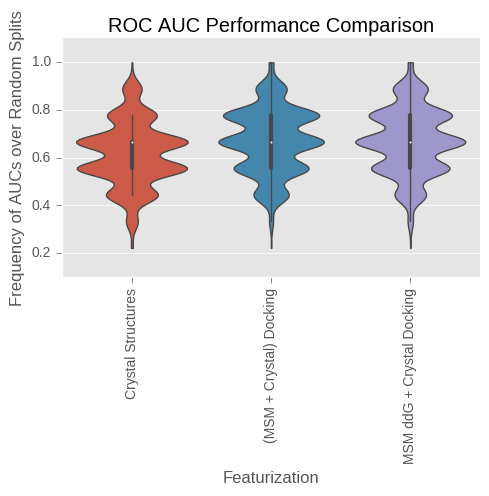

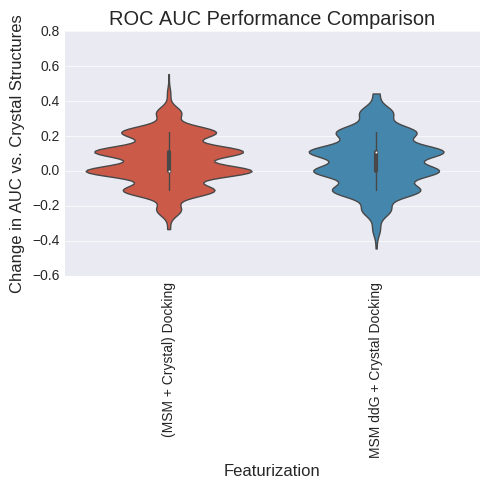

analyzing TPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.582851          0.000000   
(MSM + Crystal) Docking      0.668460          0.085609   
MSM ddG + Crystal Docking    0.676771          0.093920   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.543426465795, 0.623466218501)  
MSM ddG + Crystal Docking  (0.593998753028, 0.672234814778)  


ValueError: list.remove(x): x not in list

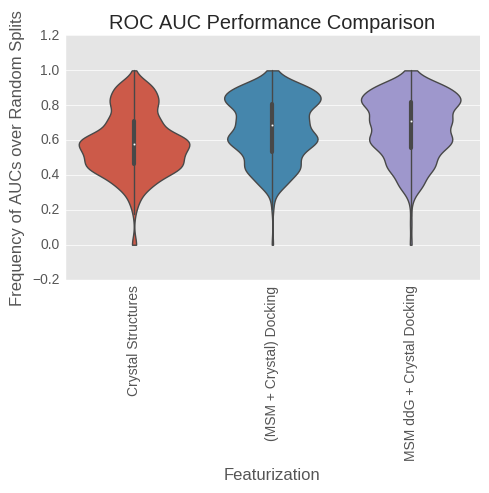

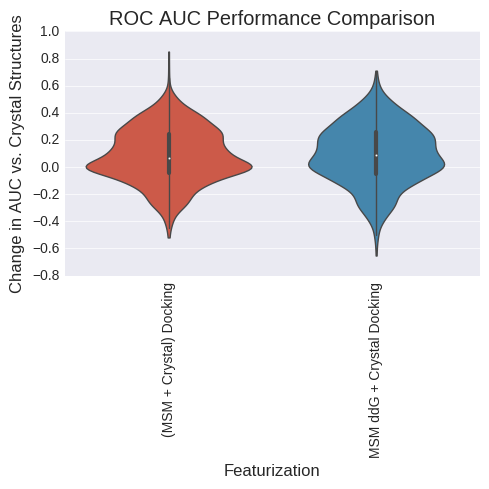

analyzing FPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.417149          0.000000   
(MSM + Crystal) Docking      0.331540         -0.085609   
MSM ddG + Crystal Docking    0.323229         -0.093920   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.255475247233, 0.329279859697)  
MSM ddG + Crystal Docking  (0.257388326059, 0.331340416212)  


ValueError: list.remove(x): x not in list

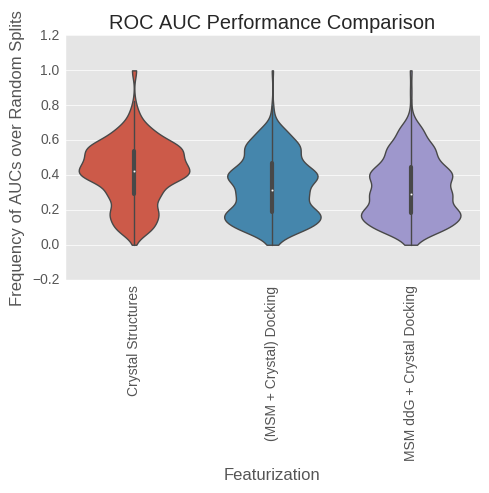

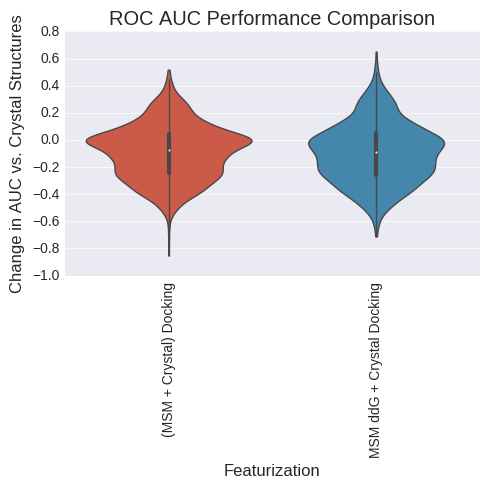

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.777952          0.000000   
(MSM + Crystal) Docking      0.872404          0.094452   
MSM ddG + Crystal Docking    0.886209          0.108257   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.814326869359, 0.873112044528)  
MSM ddG + Crystal Docking  (0.817540256059, 0.875859110838)  


ValueError: list.remove(x): x not in list

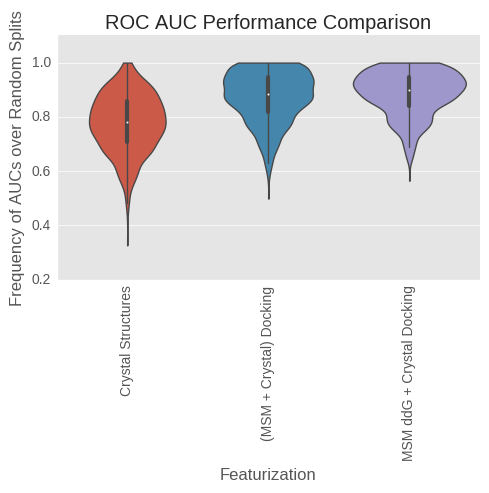

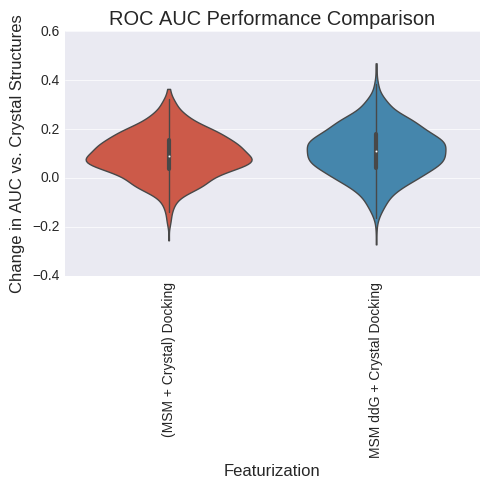

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.787027          0.000000   
(MSM + Crystal) Docking      0.973286          0.186259   
MSM ddG + Crystal Docking    0.950781          0.163754   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.618431541716, 0.695485650175)  
MSM ddG + Crystal Docking   (0.60823829954, 0.685810715649)  


ValueError: list.remove(x): x not in list

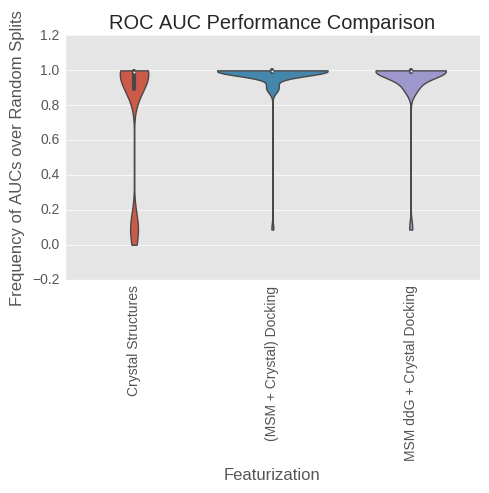

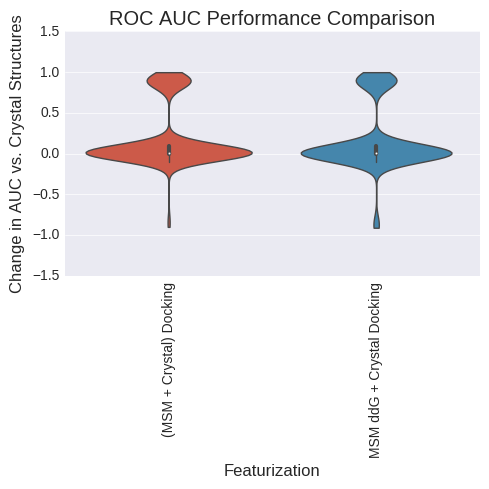

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


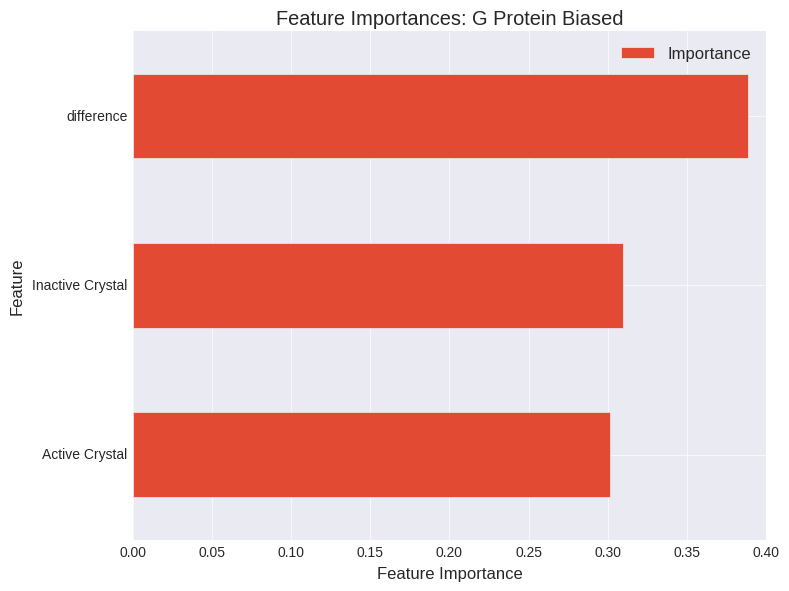

(55,)
(1, 55)


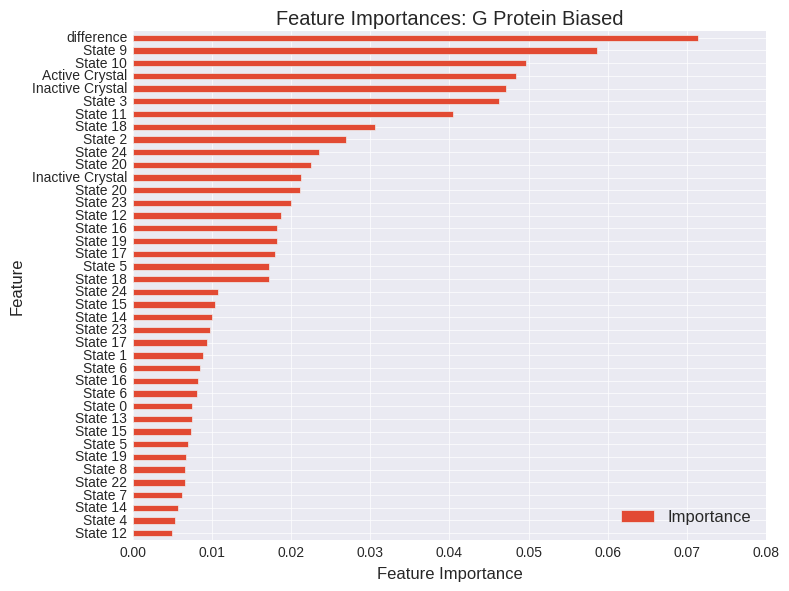

(105,)
(1, 105)


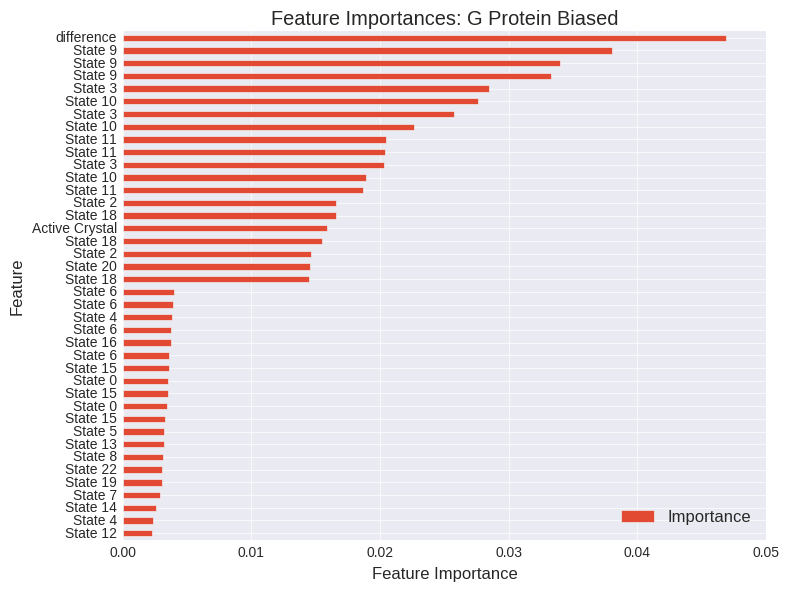

In [164]:
#XP, All ligands, RFR three classes

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)





analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.650444          0.000000   
(MSM + Crystal) Docking      0.682333          0.031889   
MSM ddG + Crystal Docking    0.710111          0.059667   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.312252806432, 0.389724543039)  
MSM ddG + Crystal Docking  (0.446506322643, 0.527665047644)  


ValueError: list.remove(x): x not in list

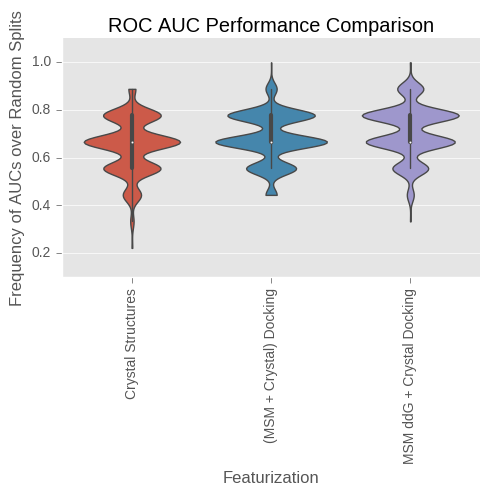

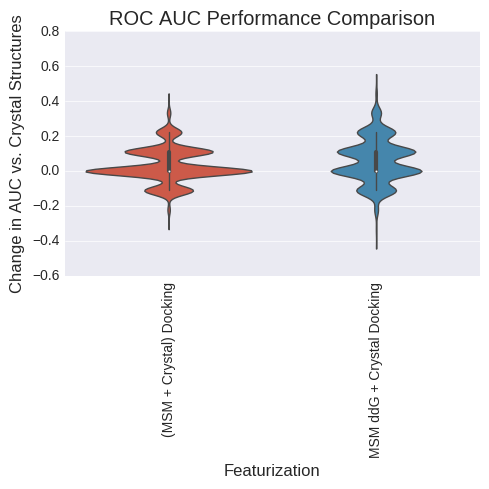

analyzing TPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.594692          0.000000   
(MSM + Crystal) Docking      0.612314          0.017622   
MSM ddG + Crystal Docking    0.645883          0.051191   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.341376424226, 0.42020545535)  
MSM ddG + Crystal Docking  (0.482298095179, 0.563398711236)  


ValueError: list.remove(x): x not in list

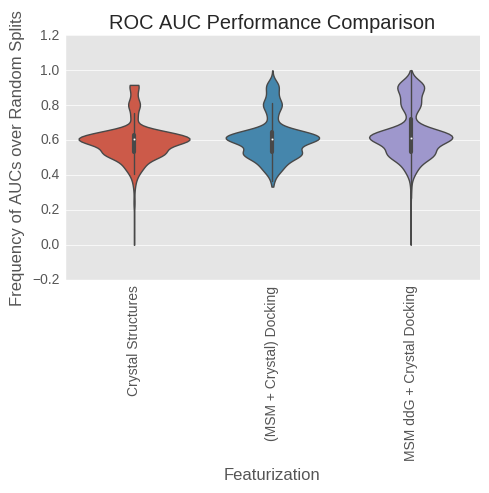

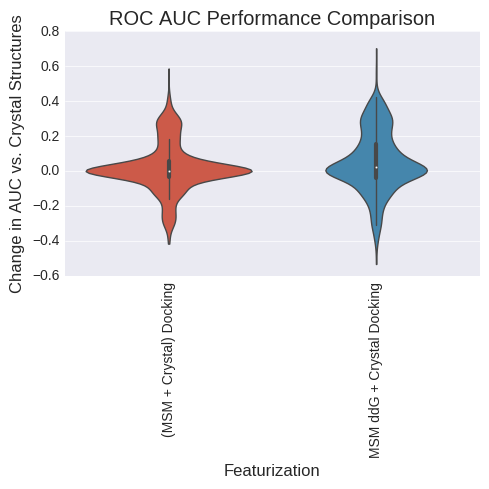

analyzing FPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.405308          0.000000   
(MSM + Crystal) Docking      0.387686         -0.017622   
MSM ddG + Crystal Docking    0.354117         -0.051191   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.27656526821, 0.351899827464)  
MSM ddG + Crystal Docking  (0.292929372415, 0.369311623652)  


ValueError: list.remove(x): x not in list

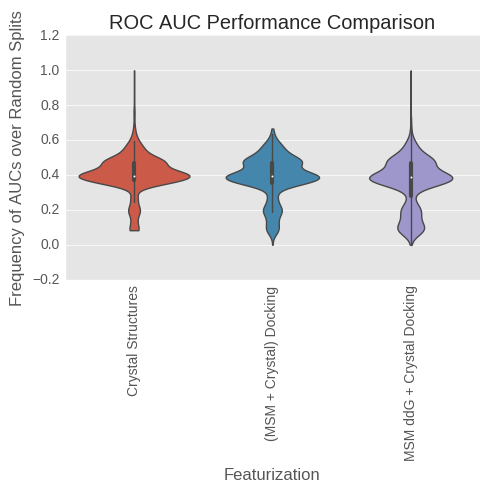

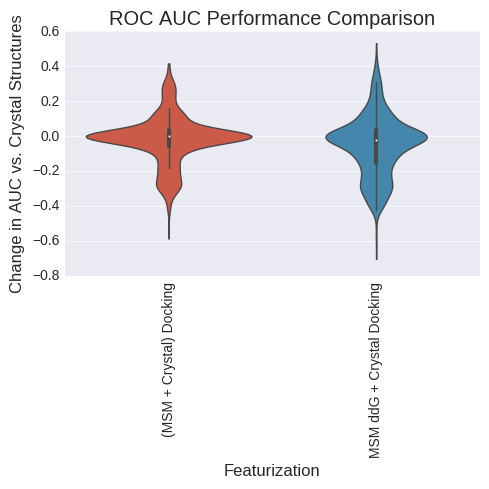

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.822877          0.000000   
(MSM + Crystal) Docking      0.847624          0.024747   
MSM ddG + Crystal Docking    0.859739          0.036862   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.555524464318, 0.63521003202)  
MSM ddG + Crystal Docking  (0.601114054833, 0.679027236664)  


ValueError: list.remove(x): x not in list

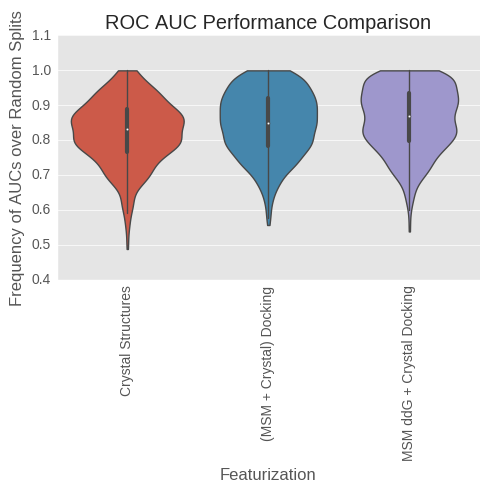

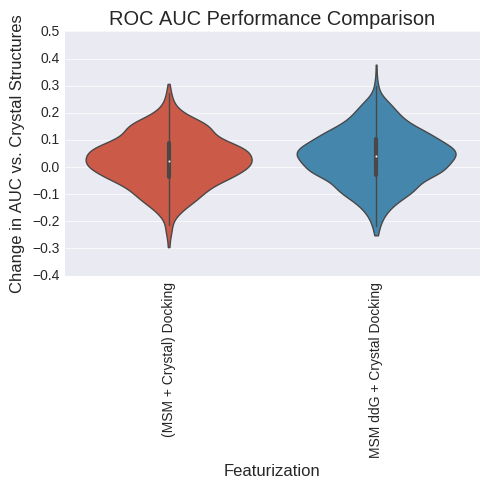

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.829194          0.000000   
(MSM + Crystal) Docking      0.646459         -0.182735   
MSM ddG + Crystal Docking    0.670163         -0.159031   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.388301838824, 0.468647288922)  
MSM ddG + Crystal Docking   (0.396160540998, 0.47668312811)  


ValueError: list.remove(x): x not in list

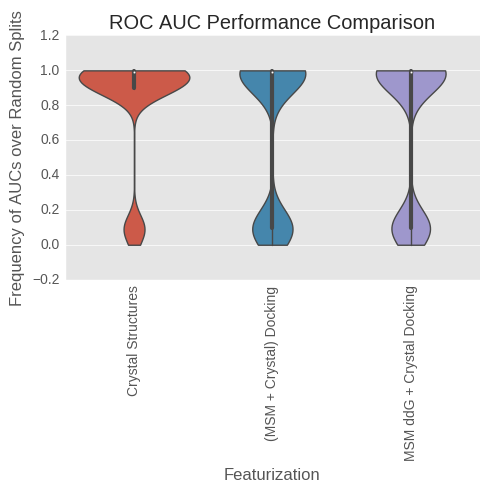

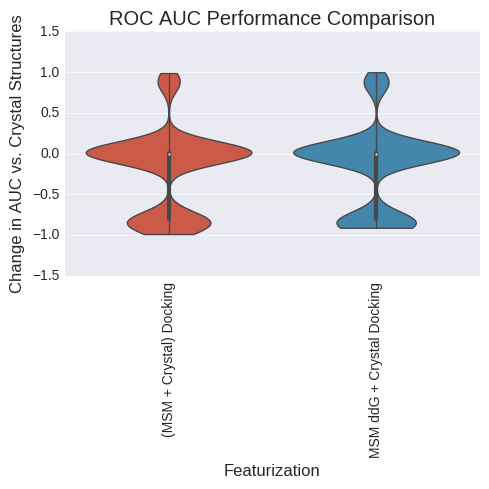

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


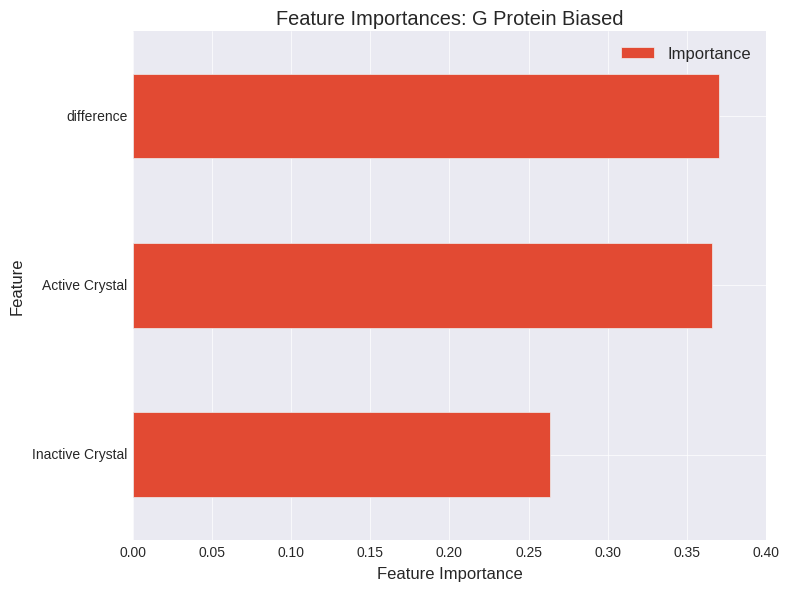

(55,)
(1, 55)


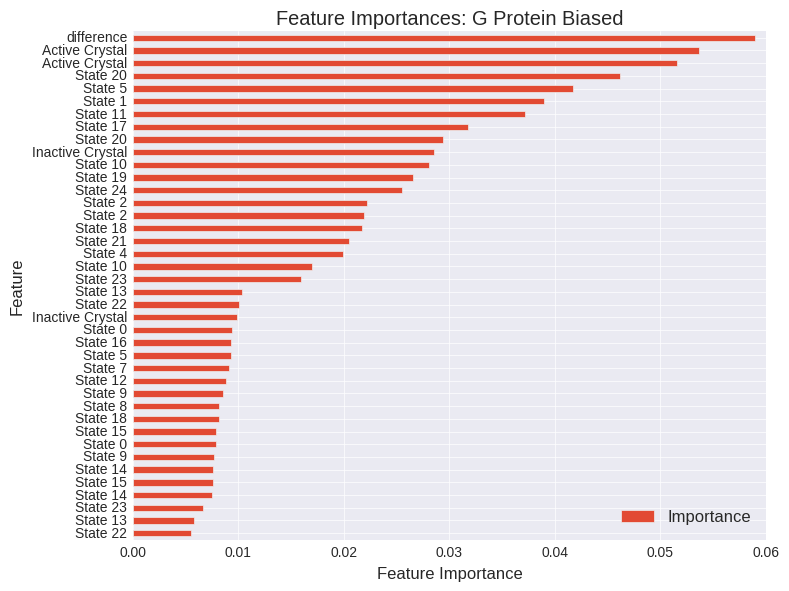

(105,)
(1, 105)


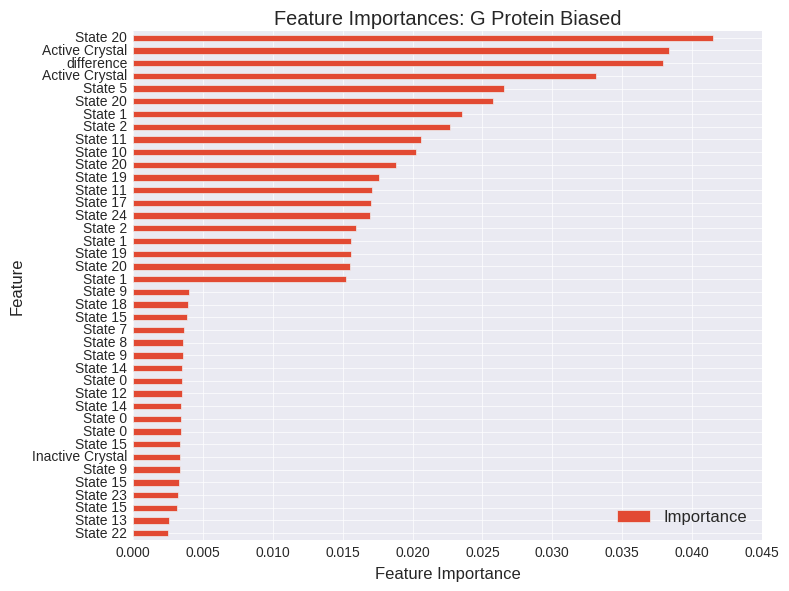

In [181]:
#SP, All ligands, RFR three classes

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.637556          0.000000   
(MSM + Crystal) Docking      0.739444          0.101889   
MSM ddG + Crystal Docking    0.743778          0.106222   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.57675530502, 0.655702362393)  
MSM ddG + Crystal Docking  (0.581821585002, 0.660570170762)  


ValueError: list.remove(x): x not in list

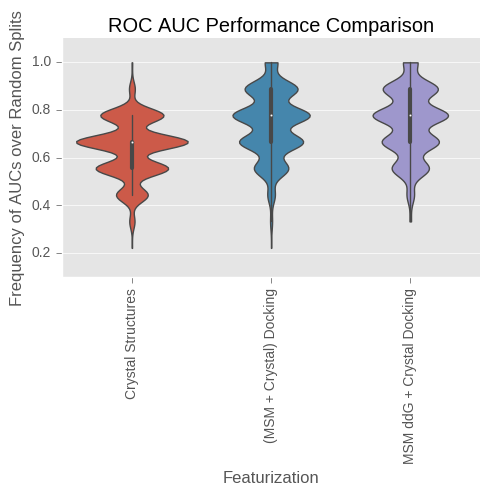

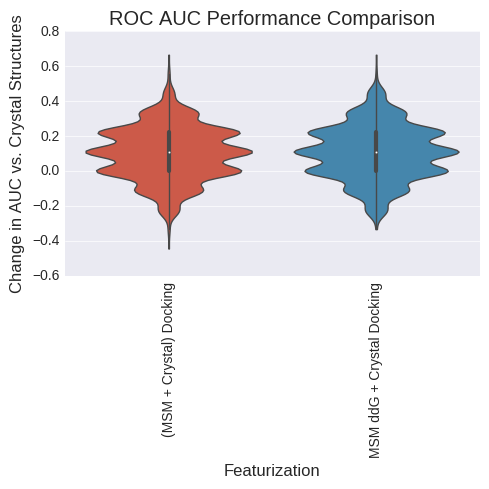

analyzing TPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.560867           0.00000   
(MSM + Crystal) Docking      0.753737           0.19287   
MSM ddG + Crystal Docking    0.759067           0.19820   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.797251326324, 0.85839850484)  
MSM ddG + Crystal Docking  (0.792997988988, 0.854704571495)  


ValueError: list.remove(x): x not in list

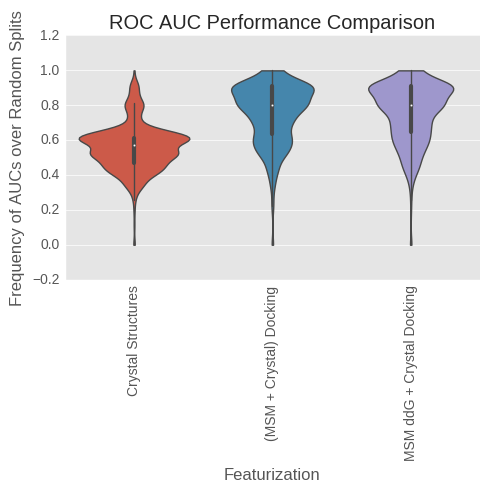

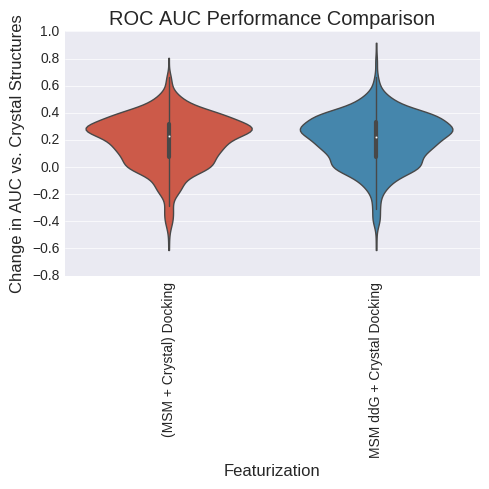

analyzing FPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.439133           0.00000   
(MSM + Crystal) Docking      0.246263          -0.19287   
MSM ddG + Crystal Docking    0.240933          -0.19820   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.105932195746, 0.160932083953)  
MSM ddG + Crystal Docking  (0.105026905837, 0.159850556191)  


ValueError: list.remove(x): x not in list

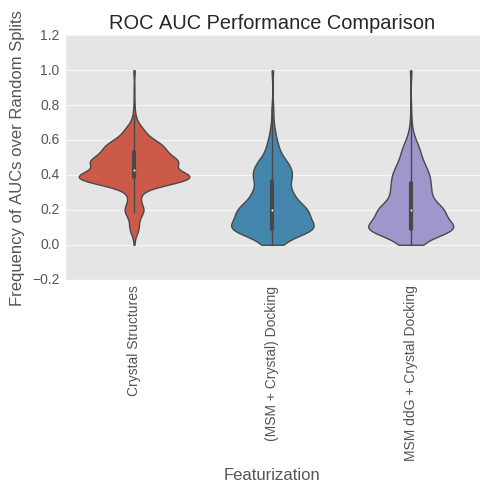

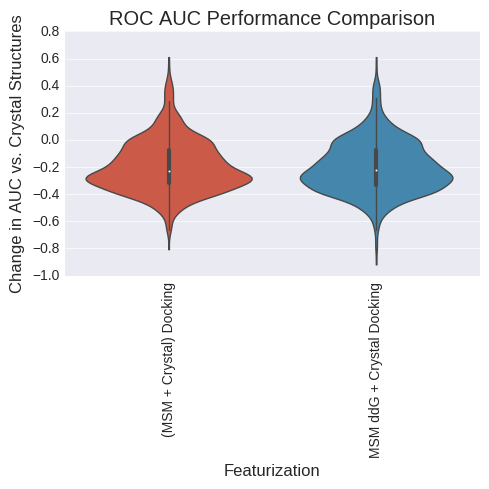

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.720161          0.000000   
(MSM + Crystal) Docking      0.901524          0.181362   
MSM ddG + Crystal Docking    0.903631          0.183470   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.932574596366, 0.967453808232)  
MSM ddG + Crystal Docking  (0.915322916861, 0.954903222684)  


ValueError: list.remove(x): x not in list

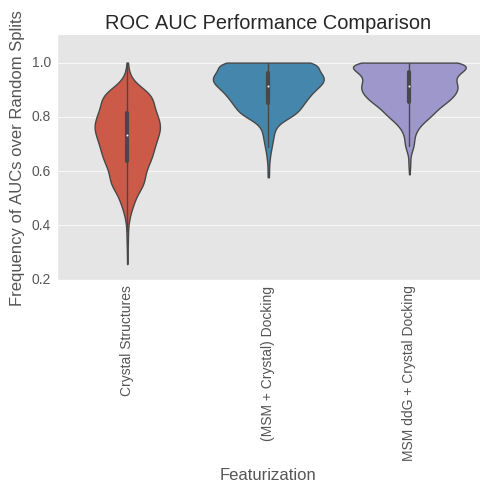

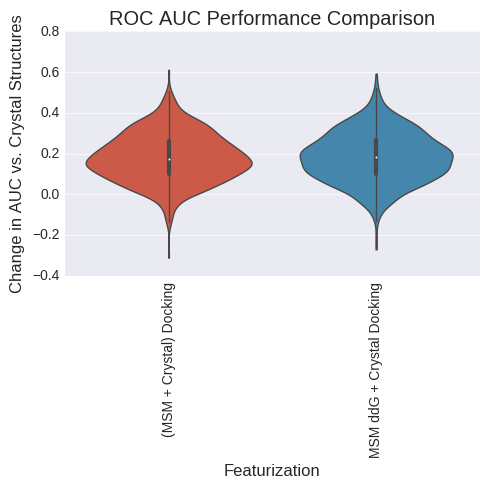

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.326480          0.000000   
(MSM + Crystal) Docking      0.844463          0.517984   
MSM ddG + Crystal Docking    0.831356          0.504876   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking      (0.8057762976, 0.865768074926)  
MSM ddG + Crystal Docking  (0.806843687918, 0.866687502277)  


ValueError: list.remove(x): x not in list

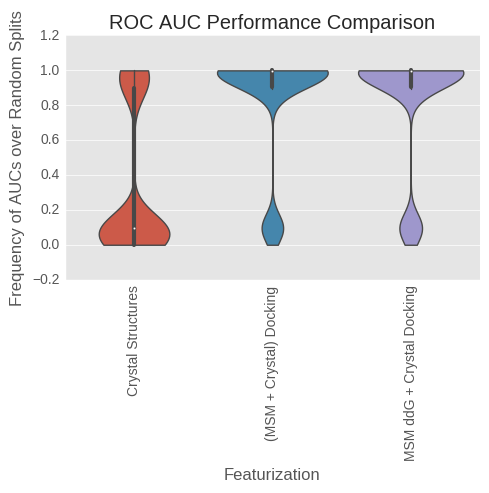

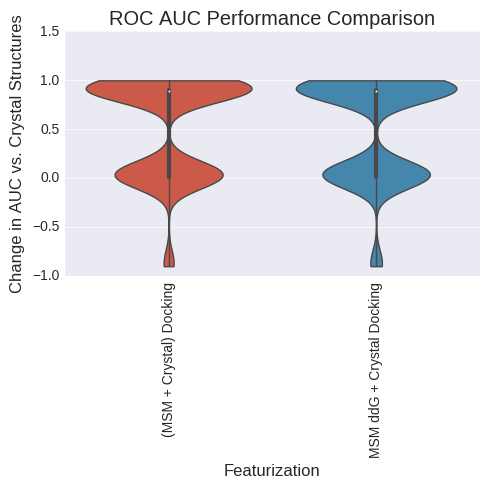

analyzing LogAUC
(1000, 0)
/n
(3, 3)
(3, 3)


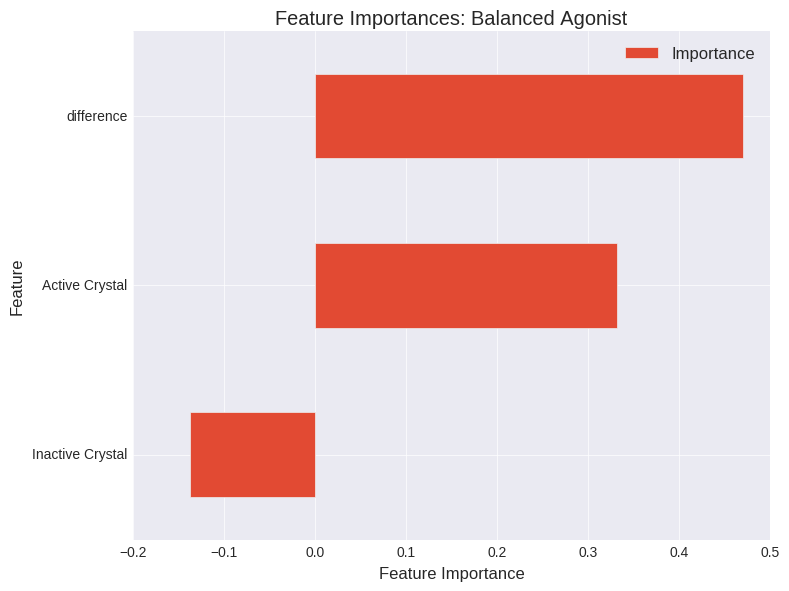

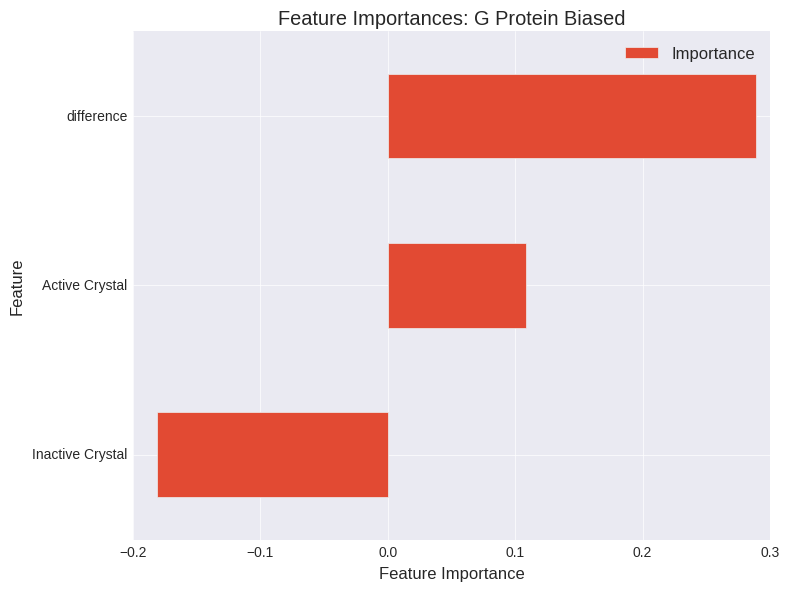

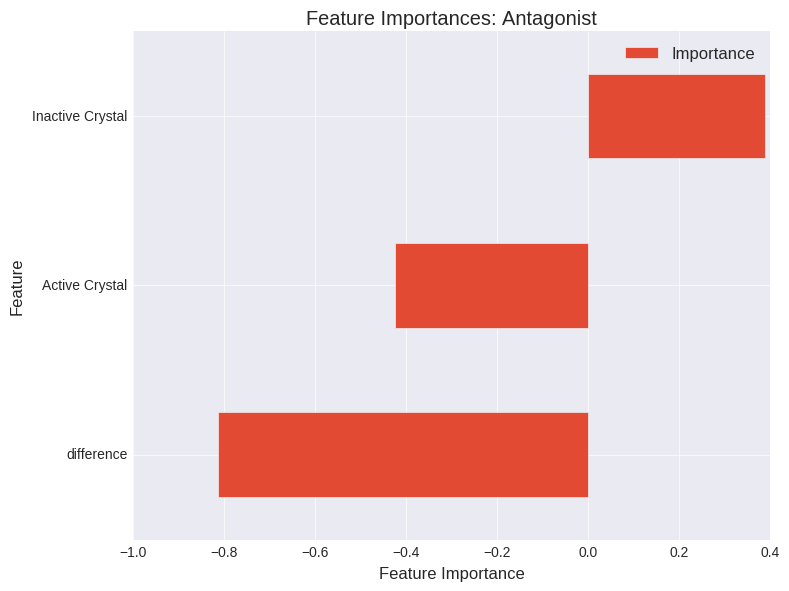

(3, 55)
(3, 55)


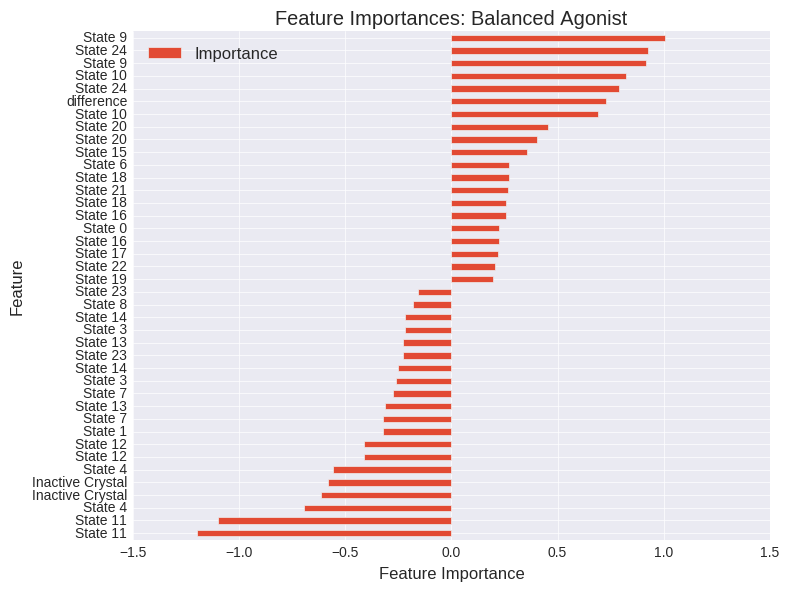

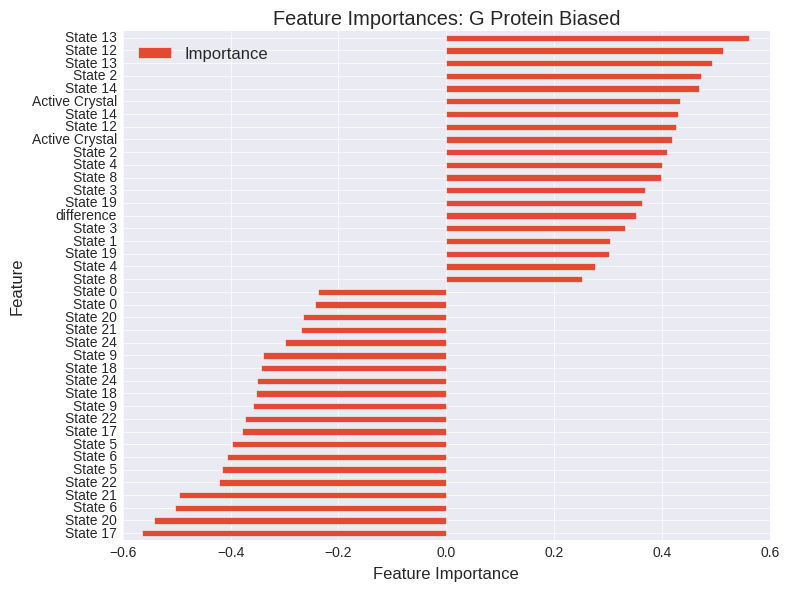

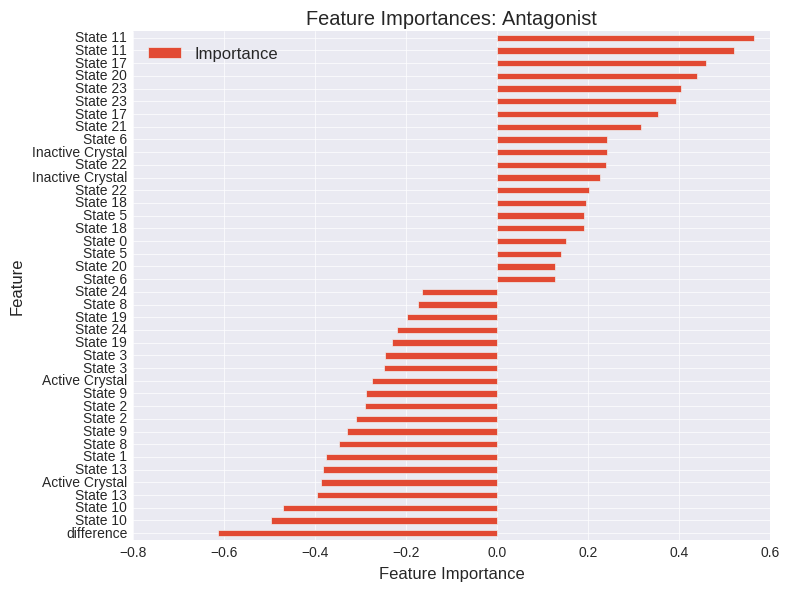

(3, 105)
(3, 105)


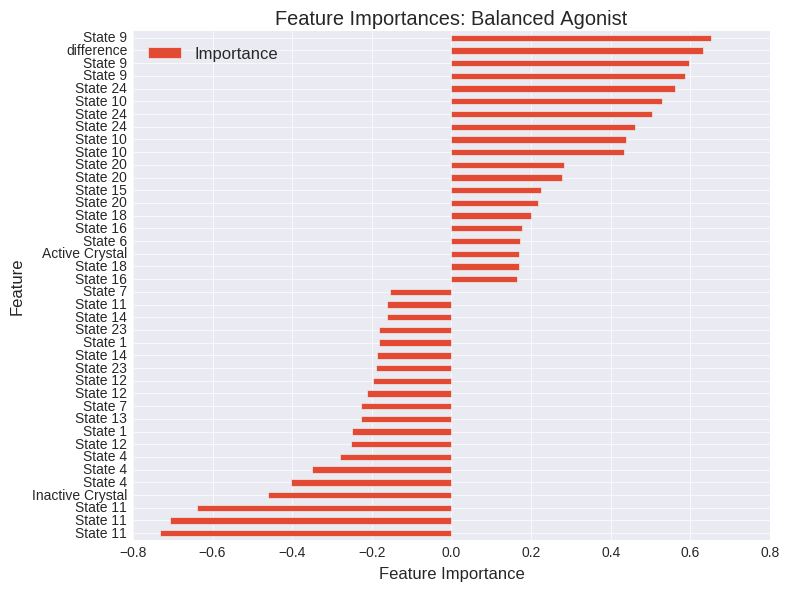

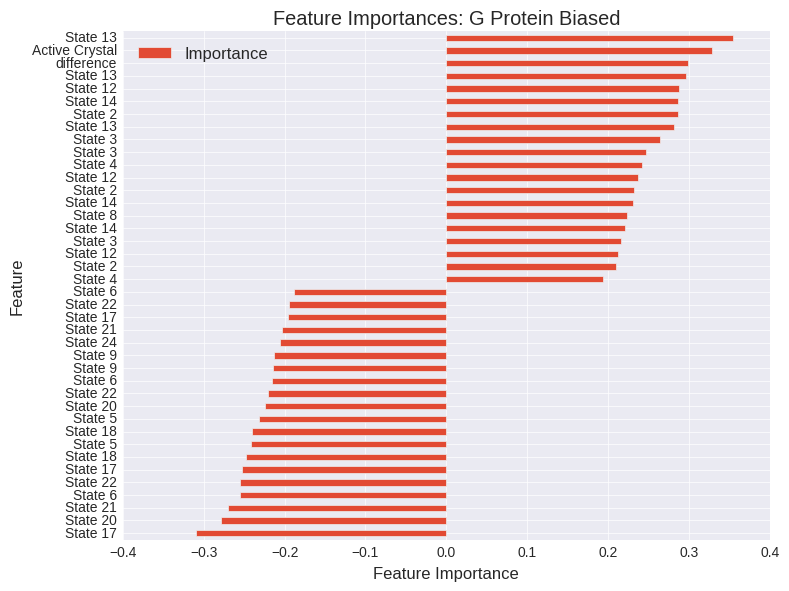

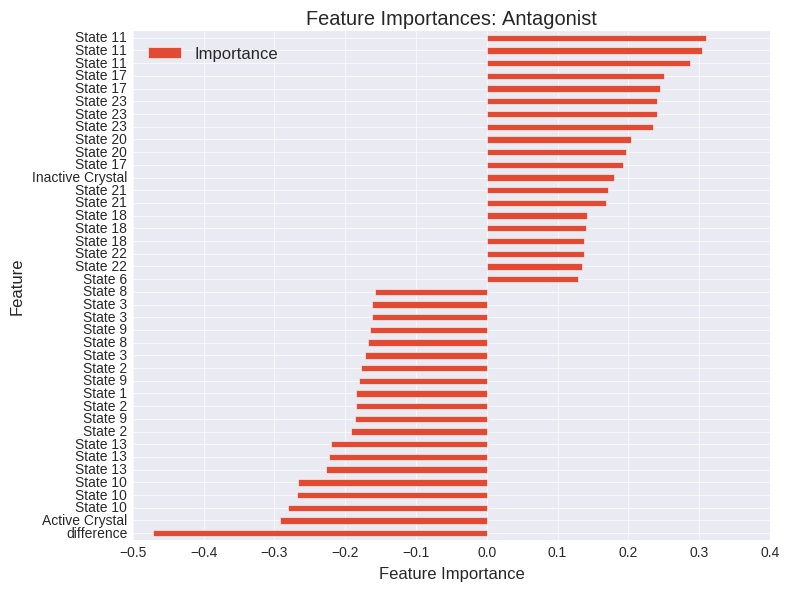

In [194]:
#XP, All ligands, LR three classes

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.677556          0.000000   
(MSM + Crystal) Docking      0.679000          0.001444   
MSM ddG + Crystal Docking    0.691000          0.013444   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.238296834117, 0.31069555475)  
MSM ddG + Crystal Docking  (0.266007673341, 0.340602427961)  


ValueError: list.remove(x): x not in list

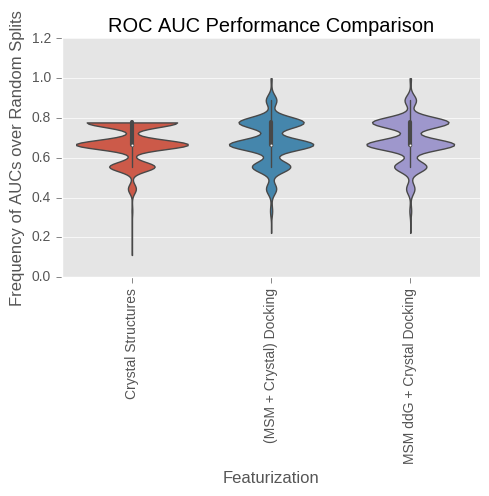

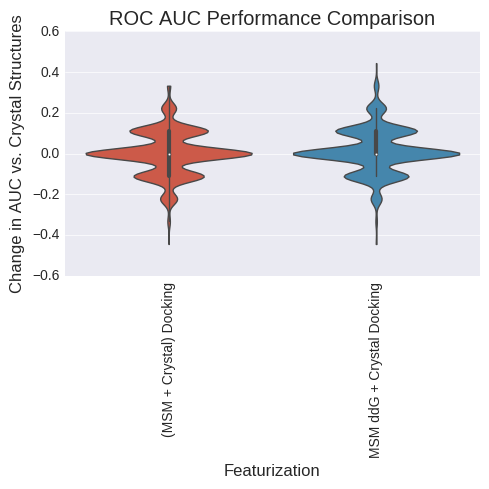

analyzing TPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.566690          0.000000   
(MSM + Crystal) Docking      0.614277          0.047587   
MSM ddG + Crystal Docking    0.617692          0.051002   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.446506322643, 0.527665047644)  
MSM ddG + Crystal Docking  (0.446506322643, 0.527665047644)  


ValueError: list.remove(x): x not in list

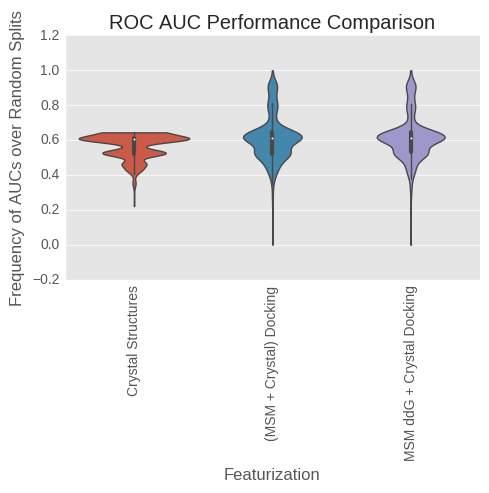

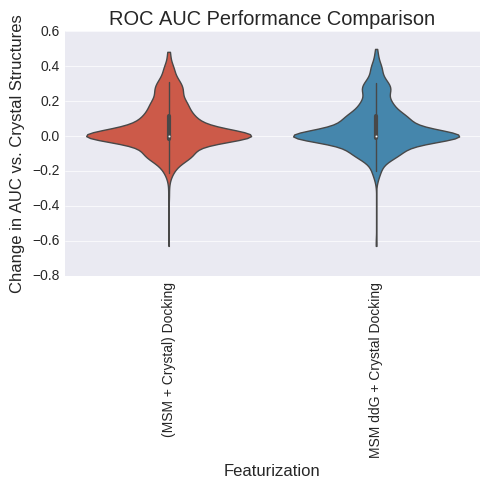

analyzing FPR:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.433310          0.000000   
(MSM + Crystal) Docking      0.385723         -0.047587   
MSM ddG + Crystal Docking    0.382308         -0.051002   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
(MSM + Crystal) Docking    (0.23353794763, 0.305520352885)  
MSM ddG + Crystal Docking   (0.224986602583, 0.2961903389)  


ValueError: list.remove(x): x not in list

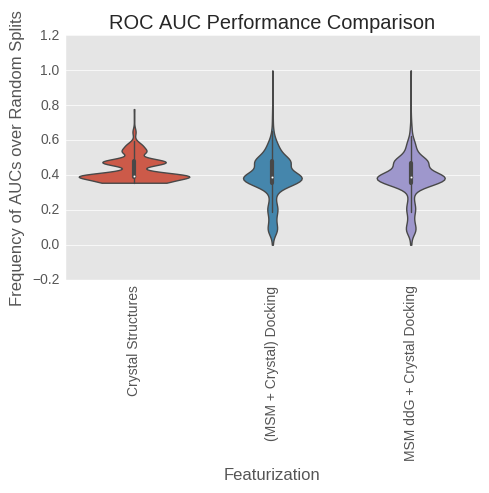

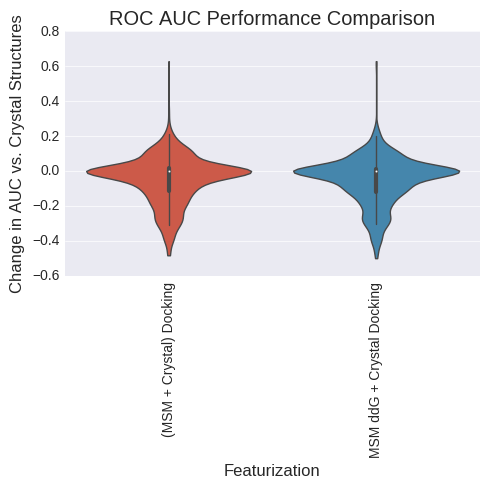

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.754060          0.000000   
(MSM + Crystal) Docking      0.814329          0.060270   
MSM ddG + Crystal Docking    0.832370          0.078311   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.645023333267, 0.720551118048)  
MSM ddG + Crystal Docking   (0.716279930039, 0.78638494052)  


ValueError: list.remove(x): x not in list

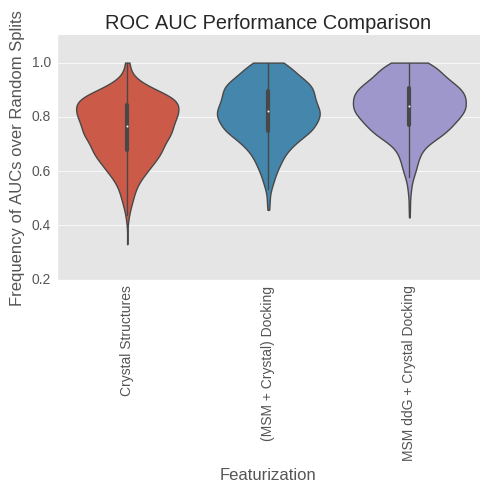

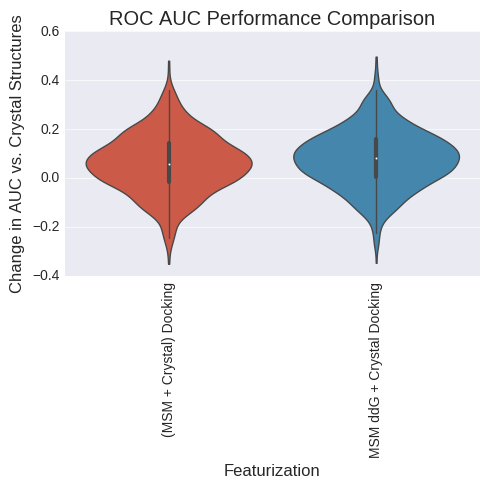

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.693171          0.000000   
(MSM + Crystal) Docking      0.696174          0.003004   
MSM ddG + Crystal Docking    0.705418          0.012248   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.374574787496, 0.454558892867)  
MSM ddG + Crystal Docking  (0.404029824485, 0.484708385984)  


ValueError: list.remove(x): x not in list

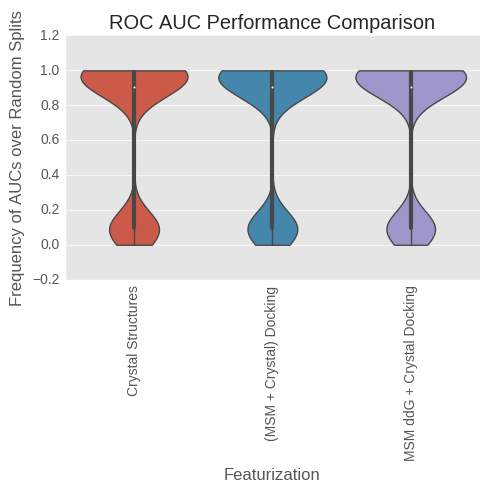

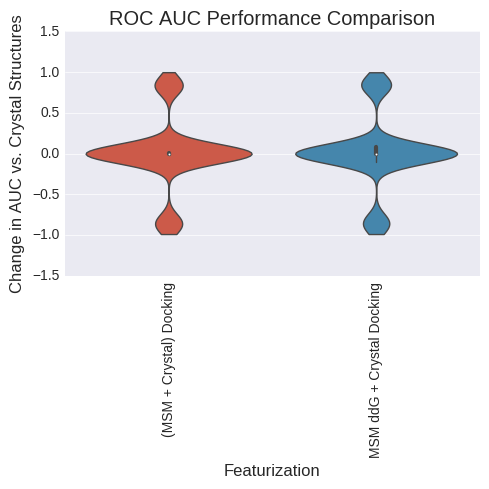

analyzing LogAUC
(1000, 0)
/n
(3, 3)
(3, 3)


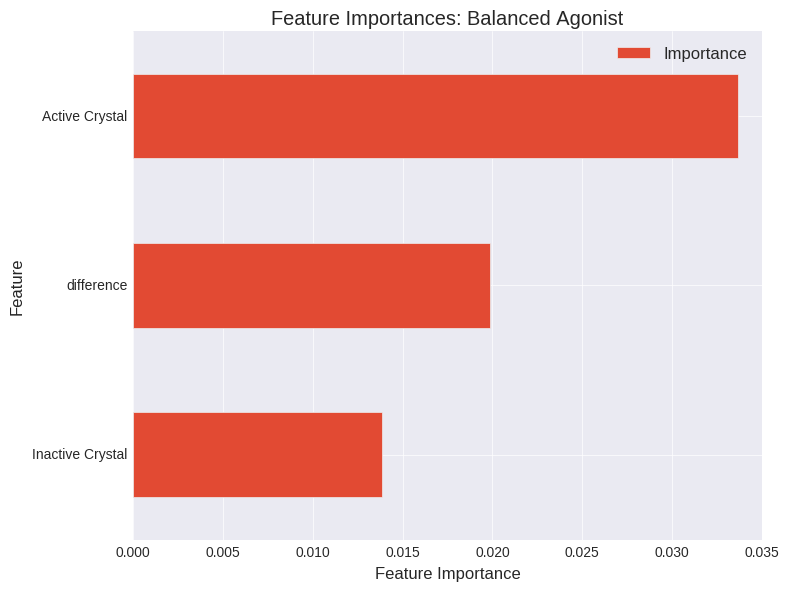

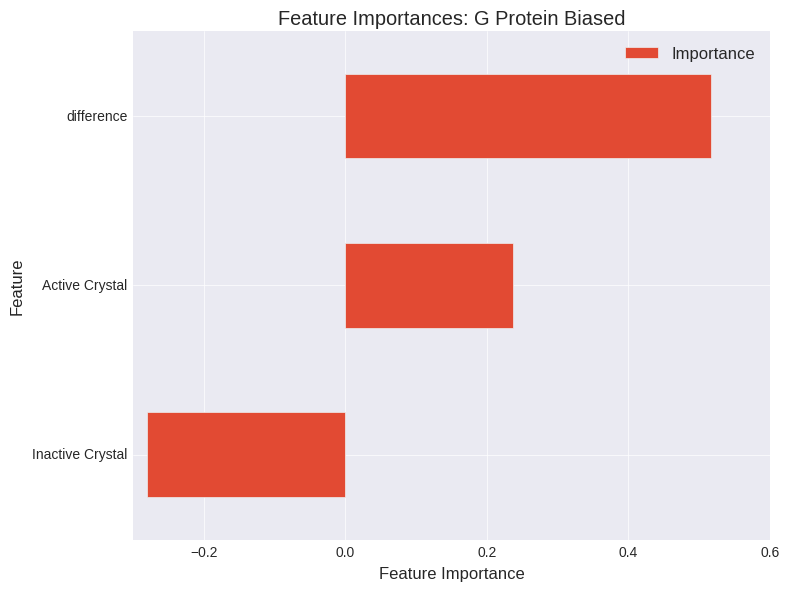

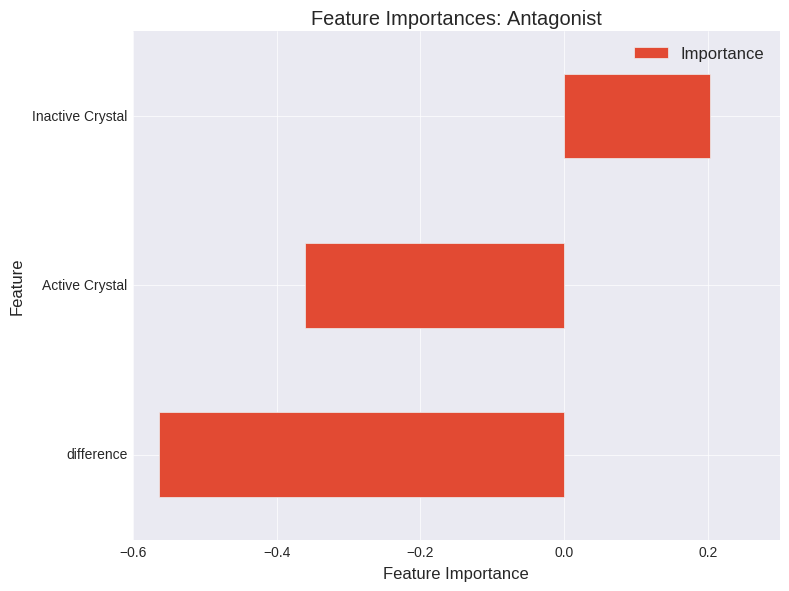

(3, 55)
(3, 55)


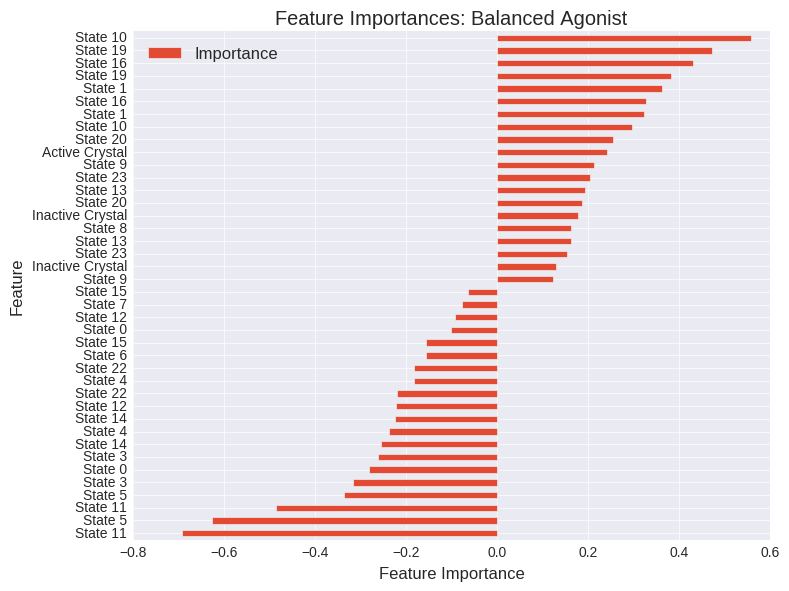

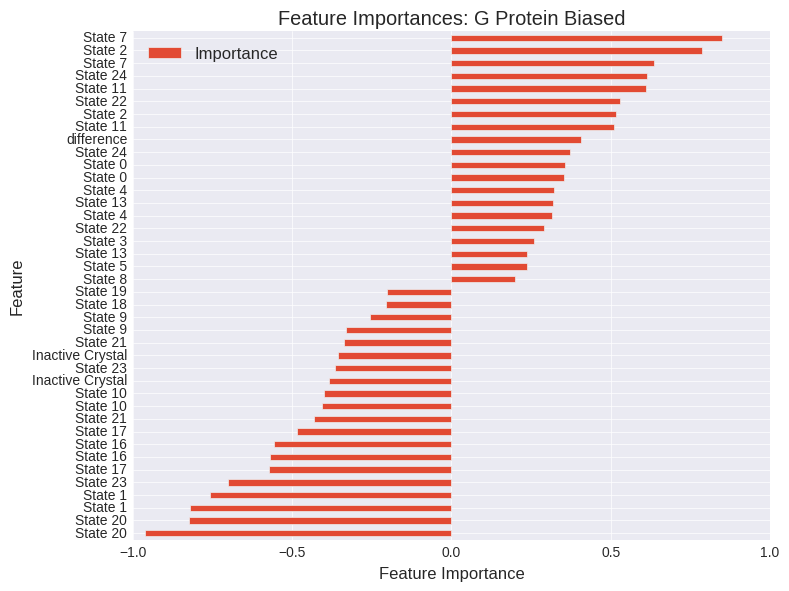

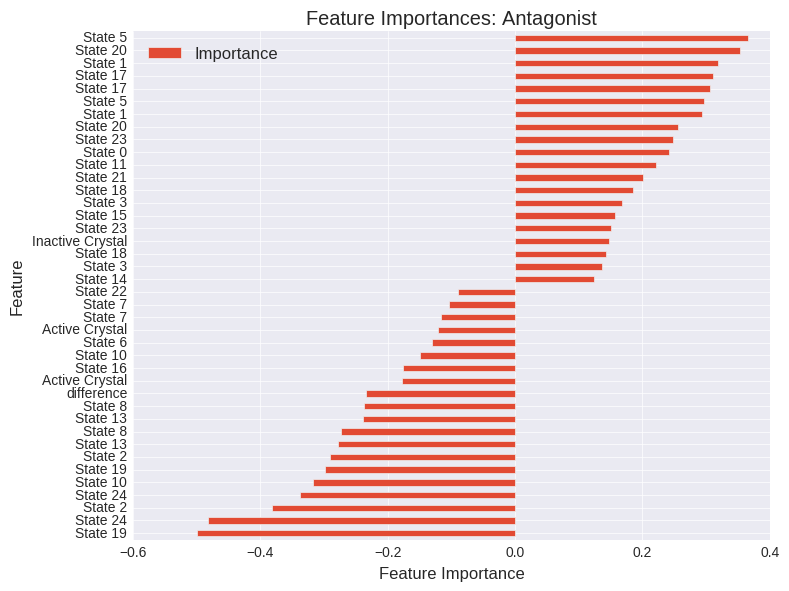

(3, 105)
(3, 105)


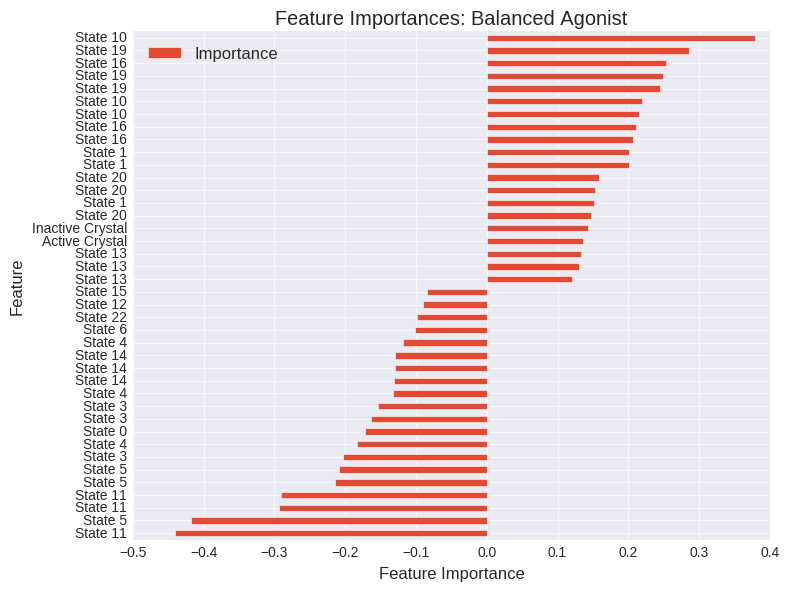

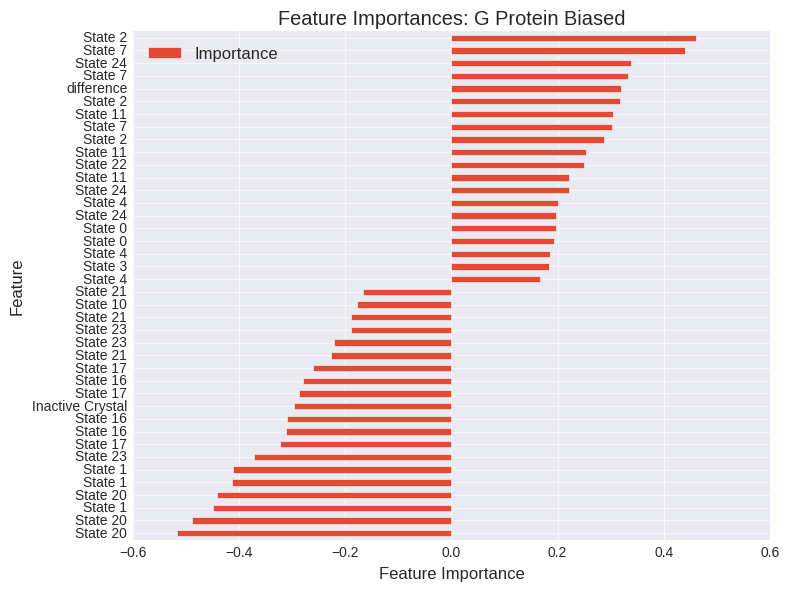

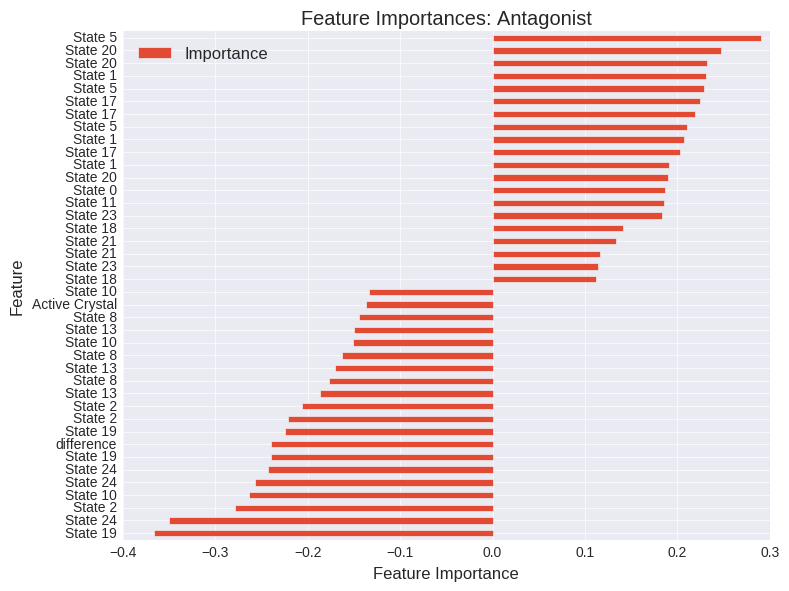

In [179]:
#SP, All ligands, LR three classes

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






analyzing Recall:
                           Median AUC  Median delta AUC  \
Crystal Structures            0.94275           0.00000   
(MSM + Crystal) Docking       0.91875          -0.02400   
MSM ddG + Crystal Docking     0.91600          -0.02675   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking    (0.0519268450259, 0.0937415567911)  
MSM ddG + Crystal Docking  (0.0519268450259, 0.0937415567911)  


ValueError: list.remove(x): x not in list

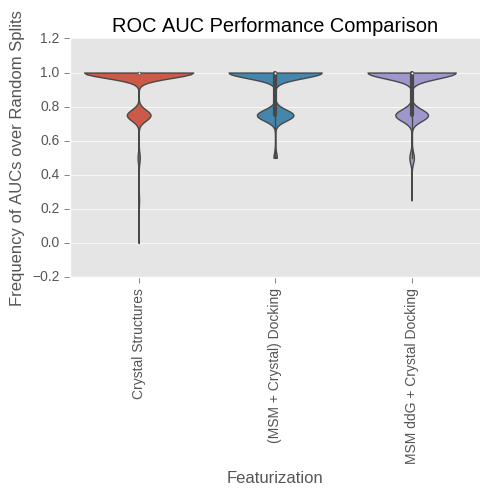

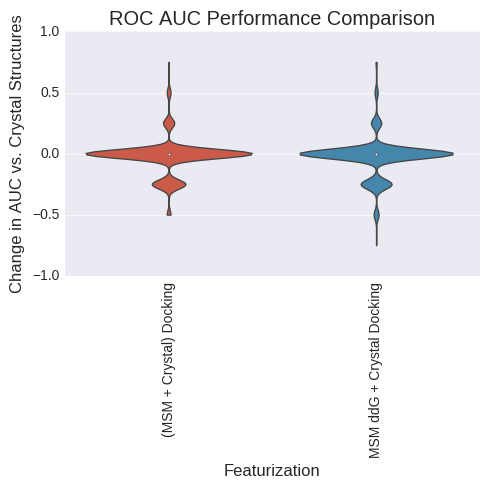

analyzing TPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.665600          0.000000   
(MSM + Crystal) Docking      0.862650          0.197050   
MSM ddG + Crystal Docking    0.864067          0.198467   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.810048287457, 0.869443355749)  
MSM ddG + Crystal Docking  (0.803642713348, 0.863928023837)  


ValueError: list.remove(x): x not in list

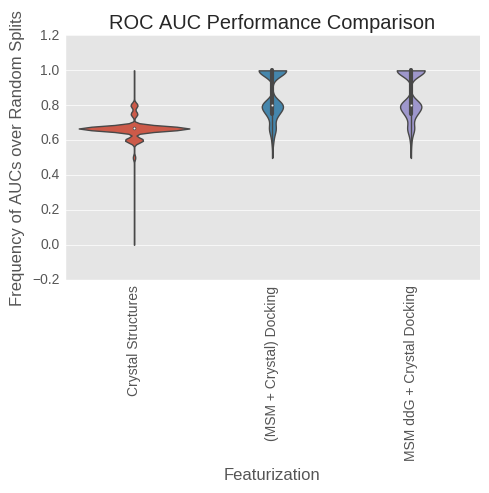

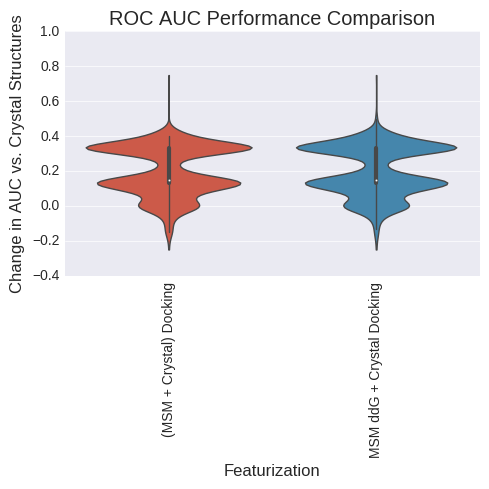

analyzing FPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.334400          0.000000   
(MSM + Crystal) Docking      0.137350         -0.197050   
MSM ddG + Crystal Docking    0.135933         -0.198467   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking    (0.0236280384031, 0.0544885626273)  
MSM ddG + Crystal Docking  (0.0189063163028, 0.0472893787064)  


ValueError: list.remove(x): x not in list

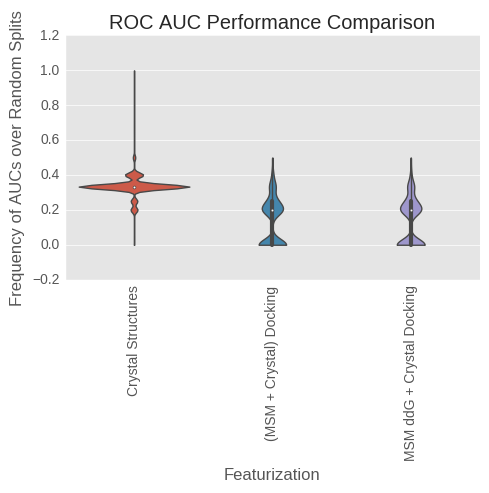

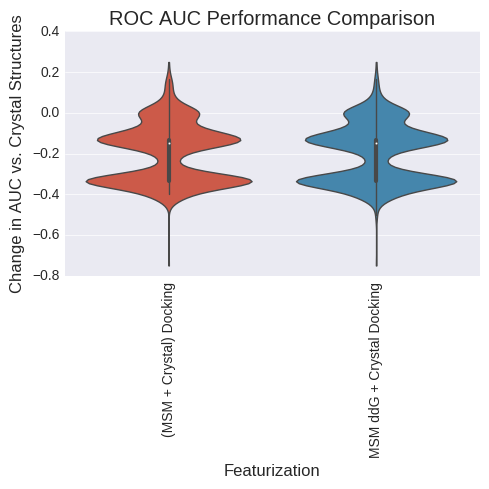

analyzing ROC AUC:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.422000          0.000000   
(MSM + Crystal) Docking      0.872875          0.450875   
MSM ddG + Crystal Docking    0.873375          0.451375   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.871765503209, 0.920974747198)  
MSM ddG + Crystal Docking  (0.861897450201, 0.912961441174)  


ValueError: list.remove(x): x not in list

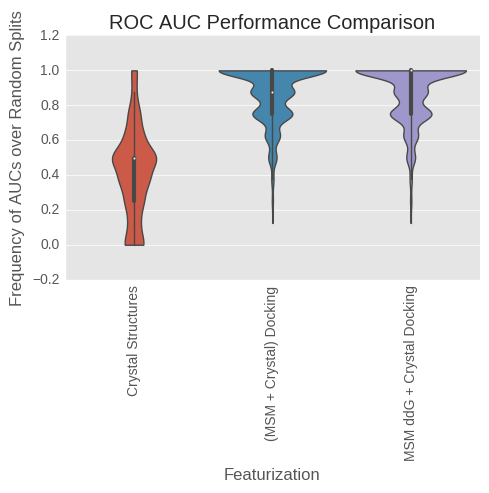

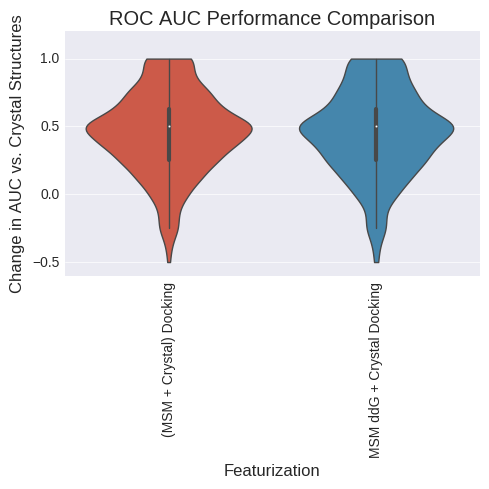

analyzing BedROC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.417202          0.000000   
(MSM + Crystal) Docking      0.983067          0.565865   
MSM ddG + Crystal Docking    0.974483          0.557281   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.879480937472, 0.927167036627)  
MSM ddG + Crystal Docking     (0.869567760067, 0.919198855)  


ValueError: list.remove(x): x not in list

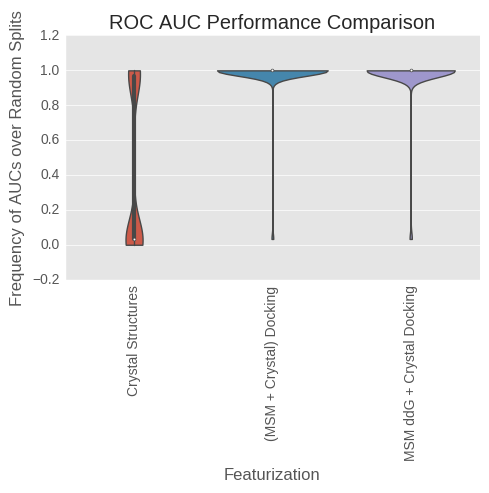

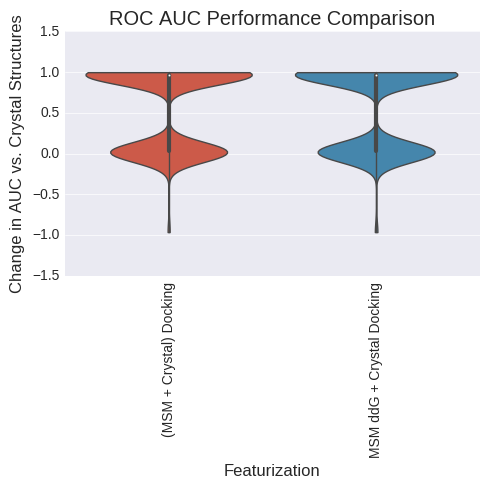

analyzing LogAUC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.059654          0.000000   
(MSM + Crystal) Docking      0.037654         -0.022000   
MSM ddG + Crystal Docking    0.034142         -0.025512   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.194743608861, 0.262855167176)  
MSM ddG + Crystal Docking  (0.164781600108, 0.229239010484)  


ValueError: list.remove(x): x not in list

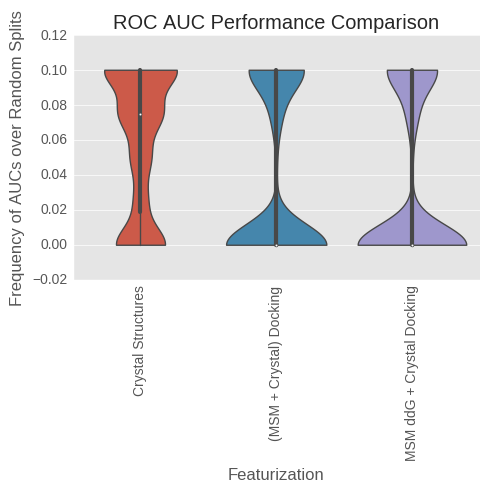

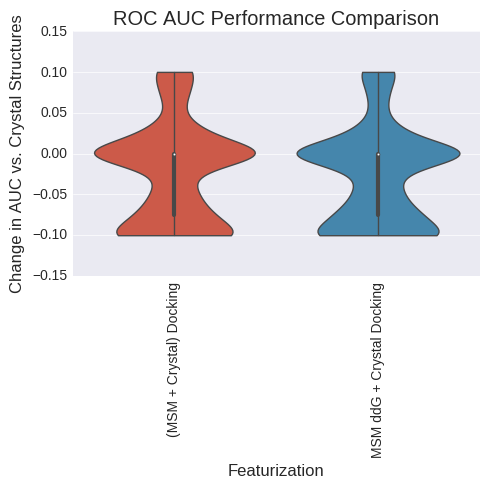

(1, 3)
(1, 3)


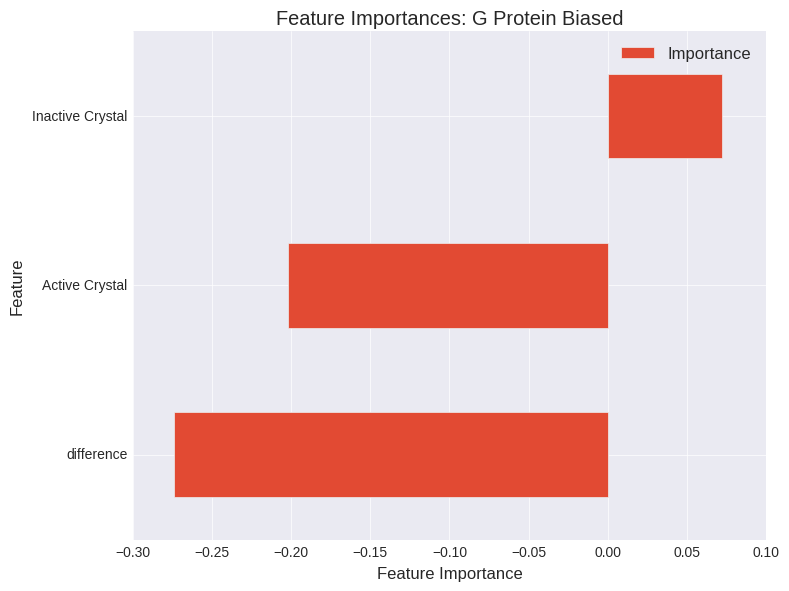

(1, 55)
(1, 55)


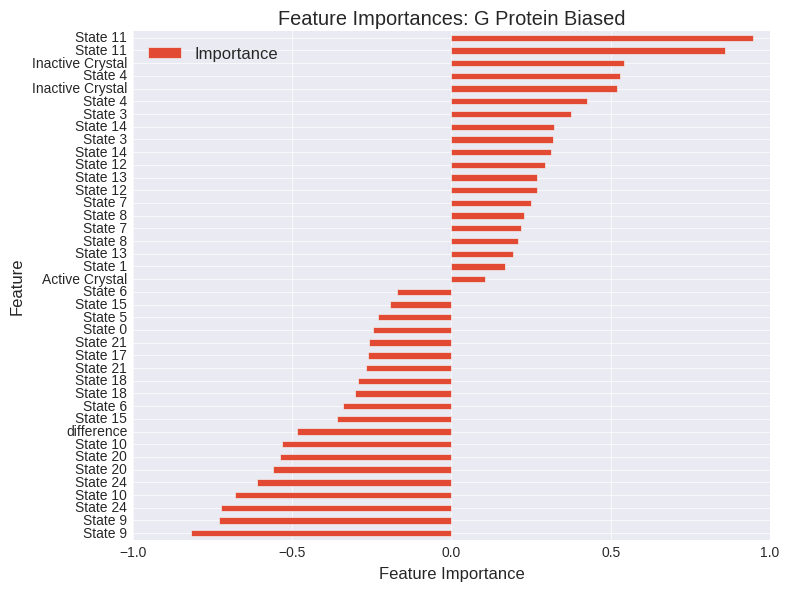

(1, 105)
(1, 105)


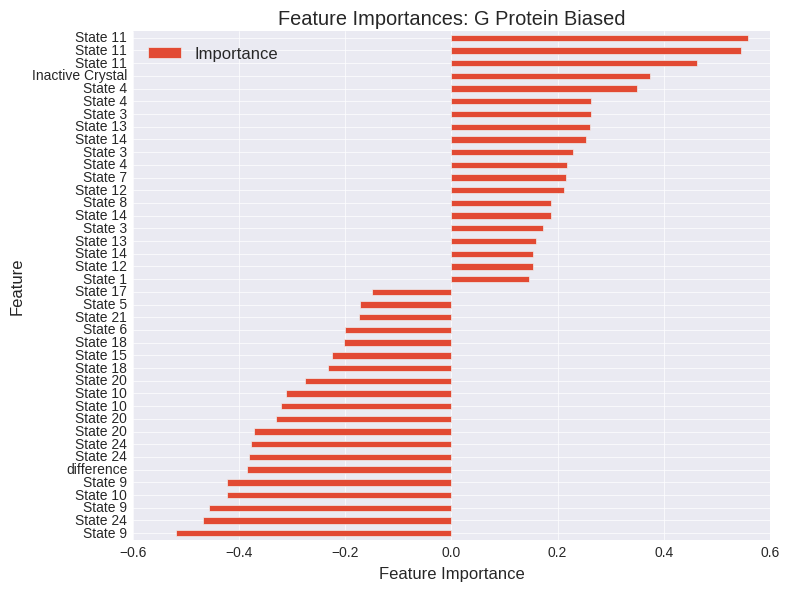

In [56]:
#XP, agonists only, LR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






analyzing Recall:
                           Median AUC  Median delta AUC  \
Crystal Structures            0.86025           0.00000   
(MSM + Crystal) Docking       0.88900           0.02875   
MSM ddG + Crystal Docking     0.89700           0.03675   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.234489265299, 0.306555852887)  
MSM ddG + Crystal Docking   (0.24687709671, 0.319996651187)  


ValueError: list.remove(x): x not in list

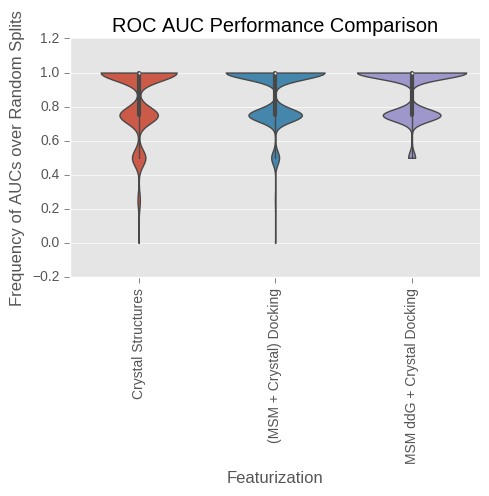

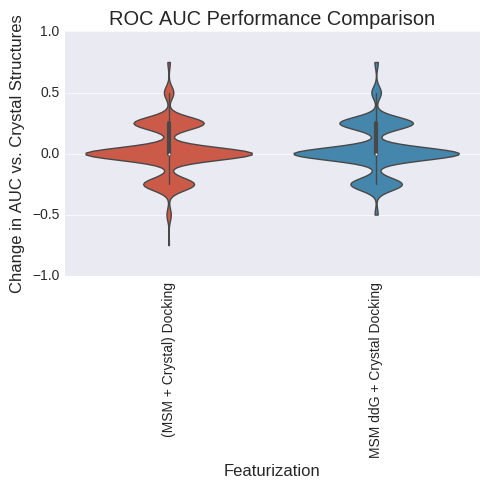

analyzing TPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.705950          0.000000   
(MSM + Crystal) Docking      0.743283          0.037333   
MSM ddG + Crystal Docking    0.764417          0.058467   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.40107760726, 0.481700150199)  
MSM ddG + Crystal Docking  (0.482298095179, 0.563398711236)  


ValueError: list.remove(x): x not in list

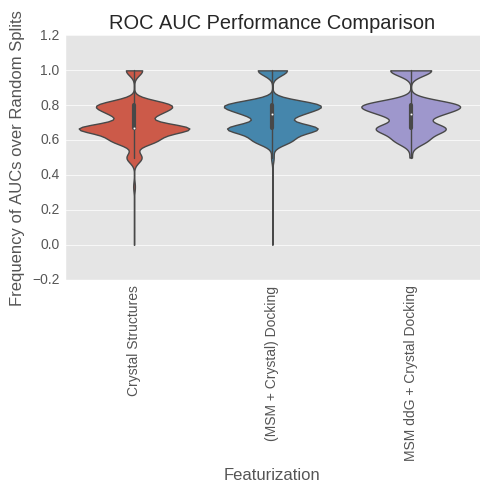

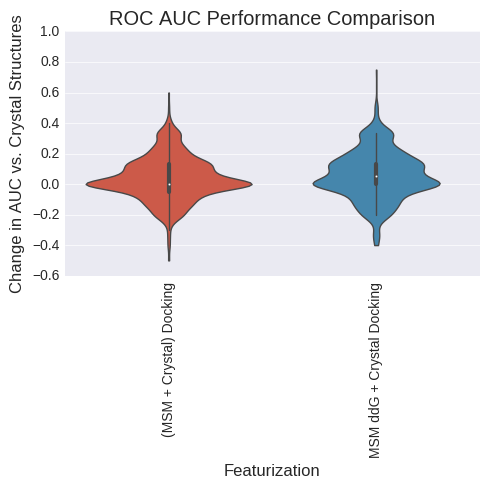

analyzing FPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.294050          0.000000   
(MSM + Crystal) Docking      0.256717         -0.037333   
MSM ddG + Crystal Docking    0.235583         -0.058467   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.221192183808, 0.292037486995)  
MSM ddG + Crystal Docking  (0.204166268195, 0.273300684544)  


ValueError: list.remove(x): x not in list

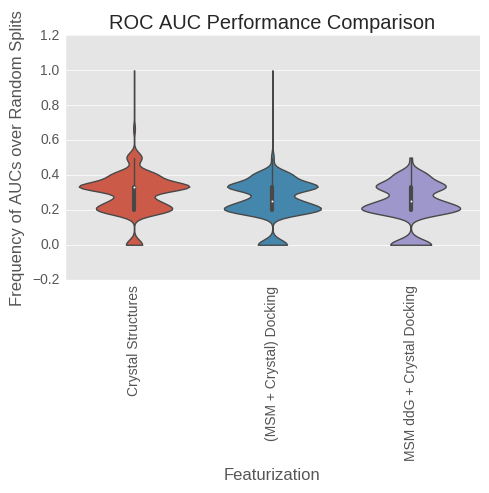

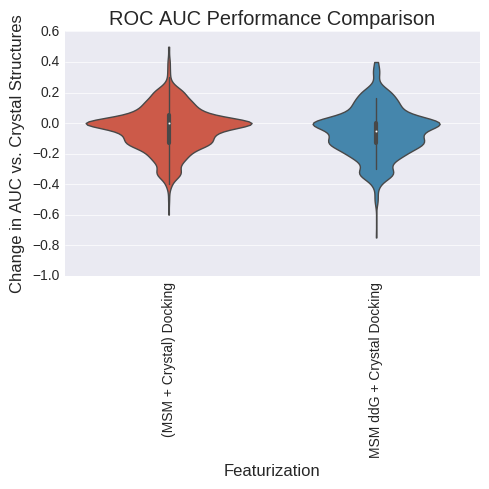

analyzing ROC AUC:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.638375          0.000000   
(MSM + Crystal) Docking      0.829500          0.191125   
MSM ddG + Crystal Docking    0.851375          0.213000   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.671750740289, 0.745480970452)  
MSM ddG + Crystal Docking  (0.674843834986, 0.748348328765)  


ValueError: list.remove(x): x not in list

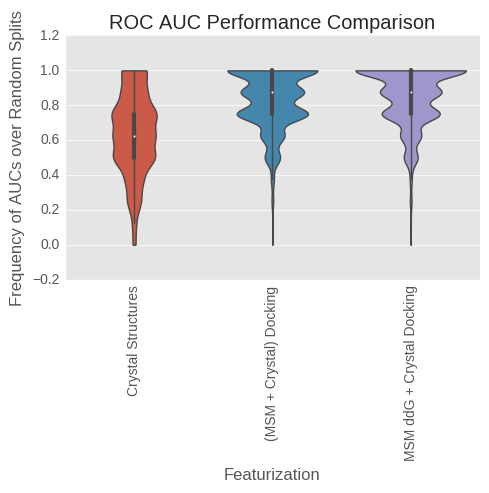

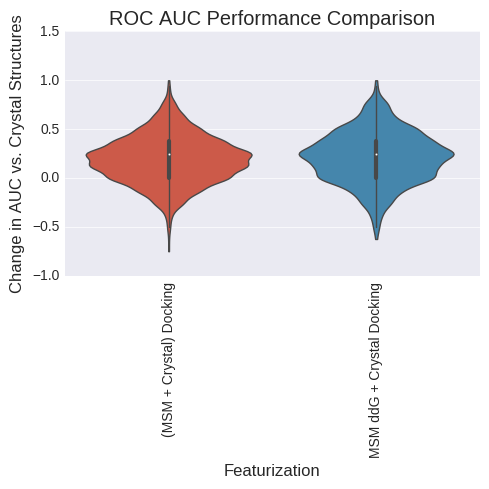

analyzing BedROC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.865478          0.000000   
(MSM + Crystal) Docking      0.989249          0.123771   
MSM ddG + Crystal Docking    0.987499          0.122022   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.700697535919, 0.772165069587)  
MSM ddG + Crystal Docking  (0.705885605243, 0.776911088614)  


ValueError: list.remove(x): x not in list

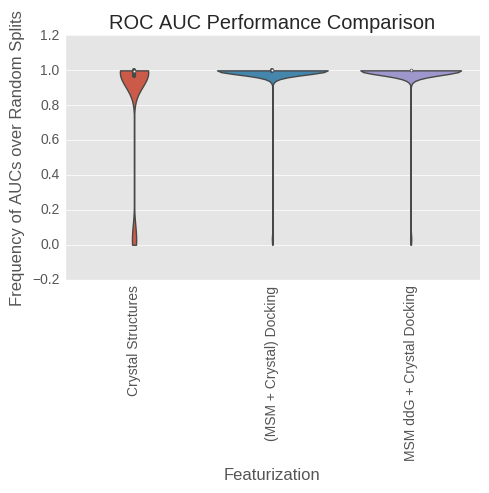

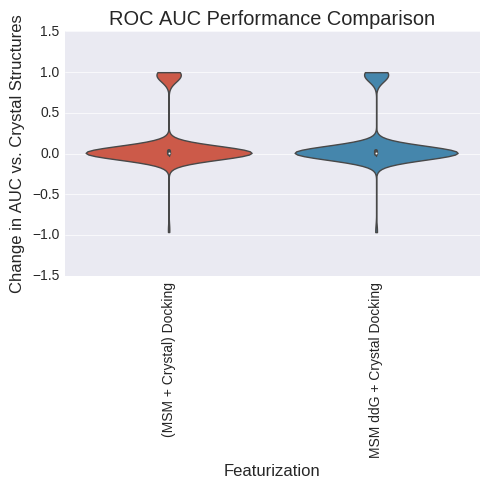

analyzing LogAUC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.059002          0.000000   
(MSM + Crystal) Docking      0.042558         -0.016444   
MSM ddG + Crystal Docking    0.039059         -0.019943   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking      (0.224986602583, 0.2961903389)  
MSM ddG + Crystal Docking  (0.221192183808, 0.292037486995)  


ValueError: list.remove(x): x not in list

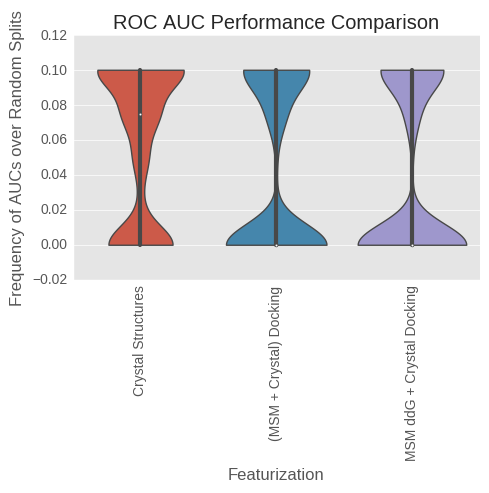

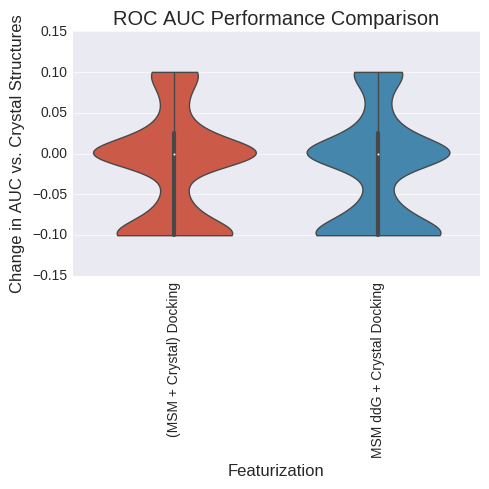

(3,)
(1, 3)


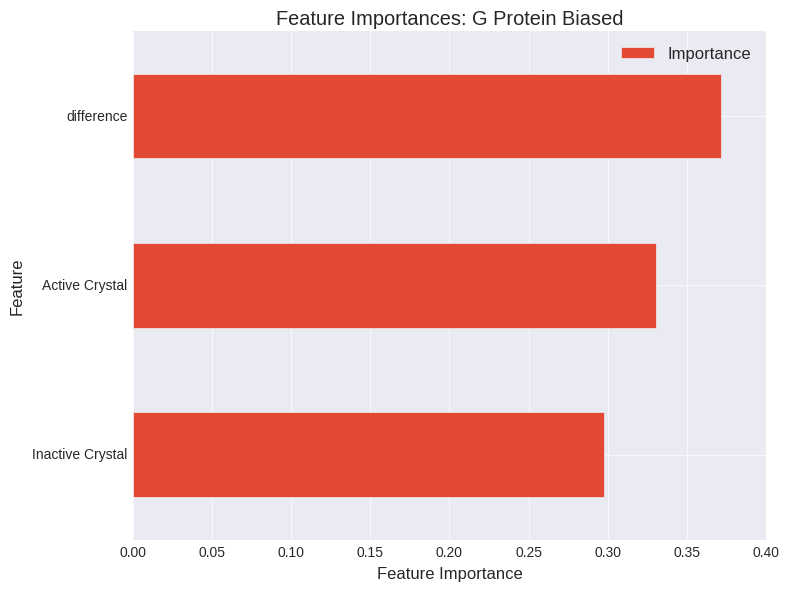

(55,)
(1, 55)


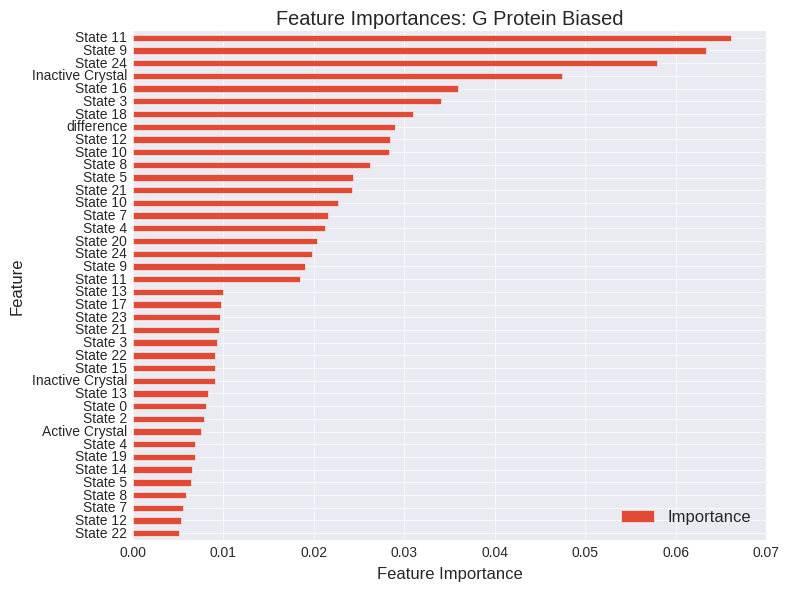

(105,)
(1, 105)


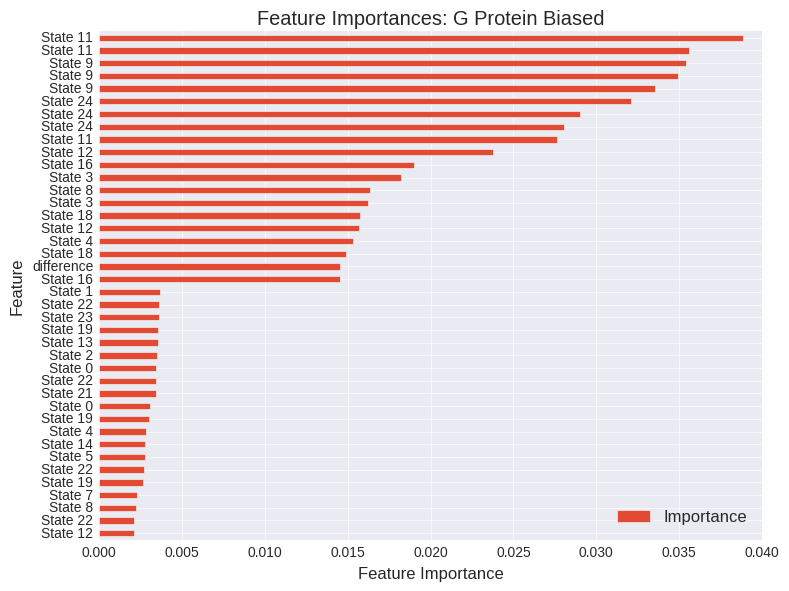

In [54]:
#XP, Agonists only, RFR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)







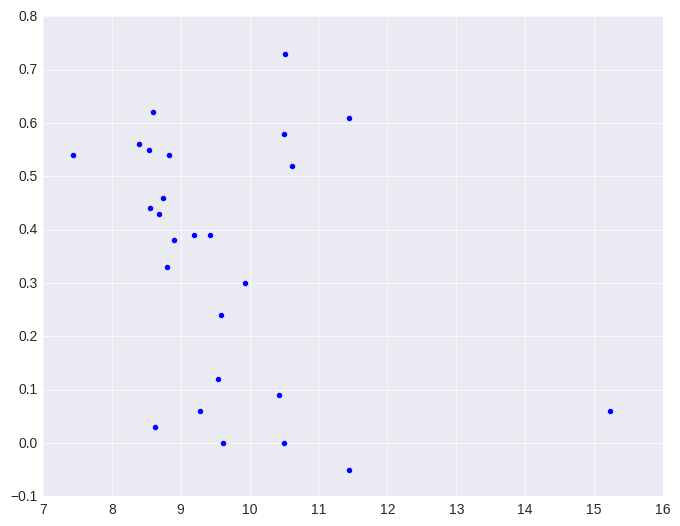

In [65]:
plt.scatter(full_docking_df.loc[model_agonists]["State 9"], bret.loc[model_agonists][gprot_col].subtract(bret.loc[model_agonists][arr_col]))

In [72]:
#XP, All ligands, RFR; three classes

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)




analyzing Recall:


IndexError: too many indices for array

In [ ]:
#XP, All ligands, RFR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)








analyzing Recall:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.358333          0.000000   
(MSM + Crystal) Docking      0.533000          0.174667   
MSM ddG + Crystal Docking    0.642667          0.284333   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.451464896516, 0.532640562123)  
MSM ddG + Crystal Docking  (0.604166200802, 0.681935543705)  


ValueError: list.remove(x): x not in list

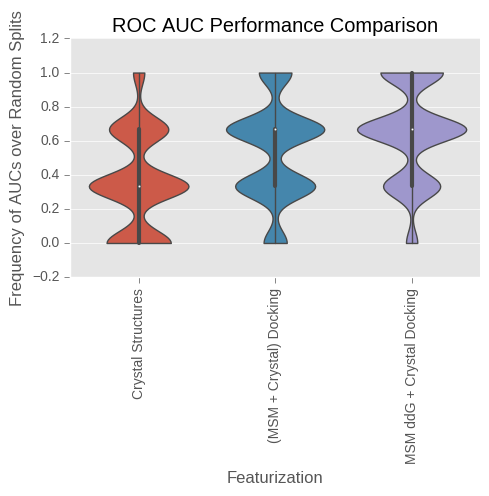

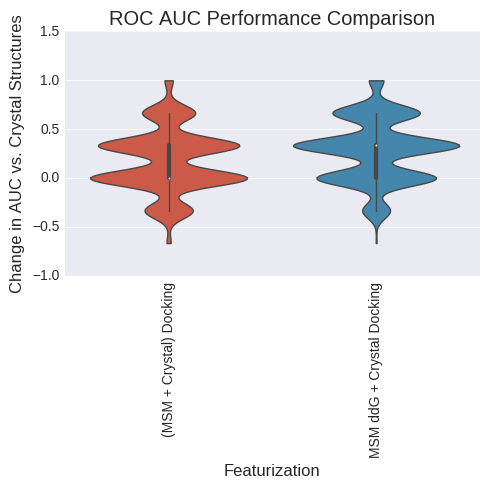

analyzing TPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.438902          0.000000   
(MSM + Crystal) Docking      0.762383          0.323481   
MSM ddG + Crystal Docking    0.791283          0.352381   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.624556518933, 0.701281578979)  
MSM ddG + Crystal Docking   (0.66248301631, 0.736867335399)  


ValueError: list.remove(x): x not in list

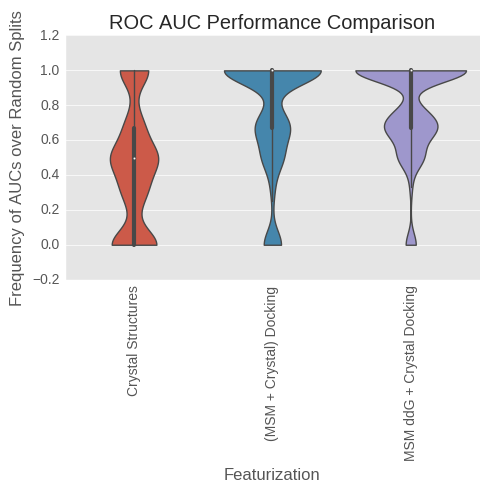

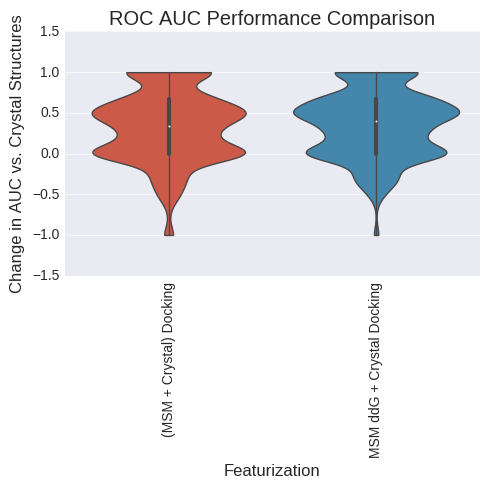

analyzing FPR:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.561098          0.000000   
(MSM + Crystal) Docking      0.237617         -0.323481   
MSM ddG + Crystal Docking    0.208717         -0.352381   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.103217902606, 0.157685924083)  
MSM ddG + Crystal Docking   (0.099606349187, 0.15335020682)  


ValueError: list.remove(x): x not in list

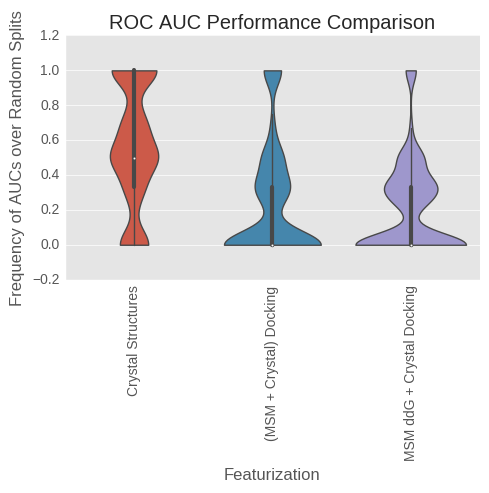

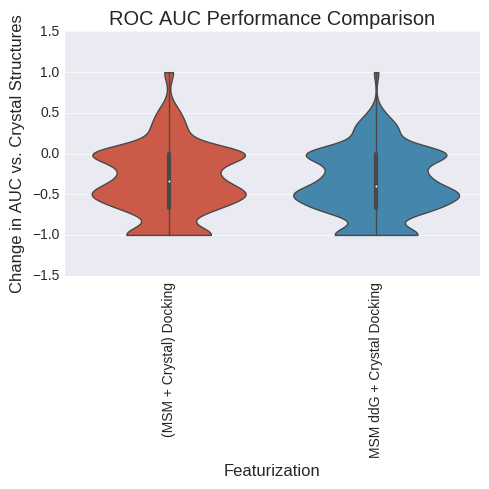

analyzing ROC AUC:
                           Median AUC  Median delta AUC  \
Crystal Structures           0.680972          0.000000   
(MSM + Crystal) Docking      0.893500          0.212528   
MSM ddG + Crystal Docking    0.922306          0.241333   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.858620058681, 0.910278379684)  
MSM ddG + Crystal Docking  (0.867372841312, 0.917420138415)  


ValueError: list.remove(x): x not in list

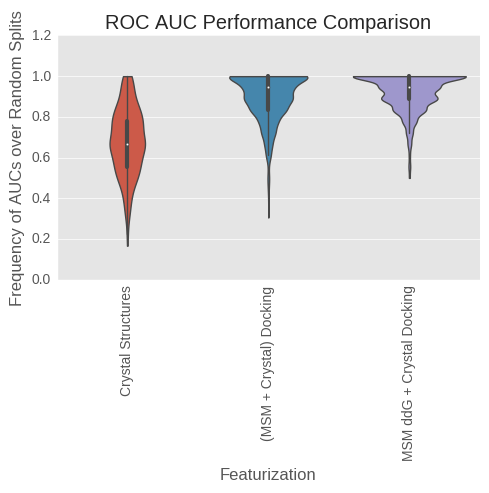

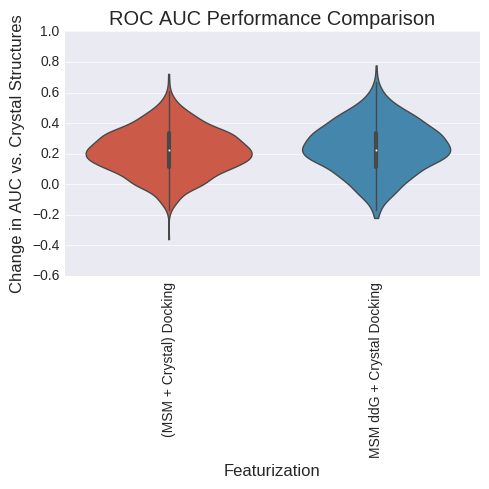

analyzing BedROC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.496093          0.000000   
(MSM + Crystal) Docking      0.895708          0.399615   
MSM ddG + Crystal Docking    0.895470          0.399378   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.843397190592, 0.89768580039)  
MSM ddG + Crystal Docking  (0.839067916047, 0.894067804254)  


ValueError: list.remove(x): x not in list

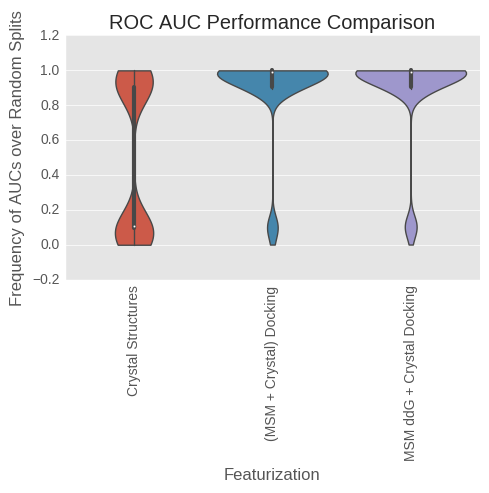

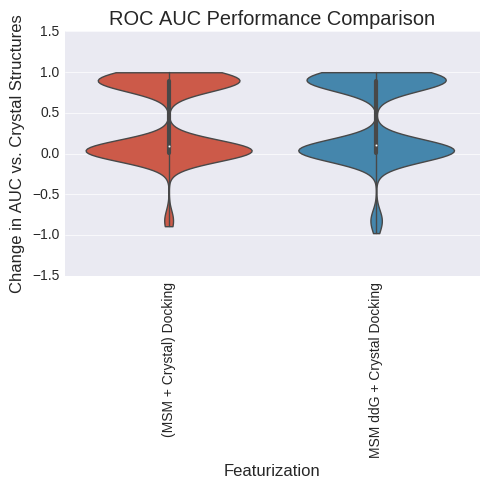

analyzing LogAUC
                           Median AUC  Median delta AUC  \
Crystal Structures           0.146755          0.000000   
(MSM + Crystal) Docking      0.135537         -0.011218   
MSM ddG + Crystal Docking    0.137240         -0.009515   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.452457095452, 0.533635180857)  
MSM ddG + Crystal Docking  (0.445515092172, 0.526669460445)  


ValueError: list.remove(x): x not in list

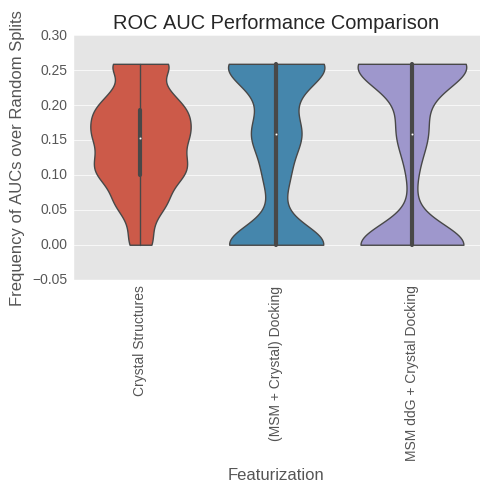

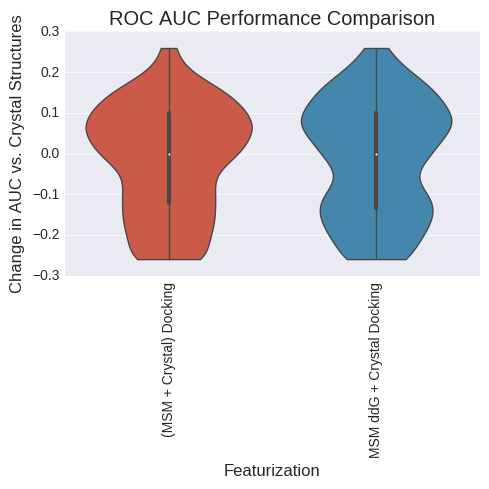

(3,)
(1, 3)


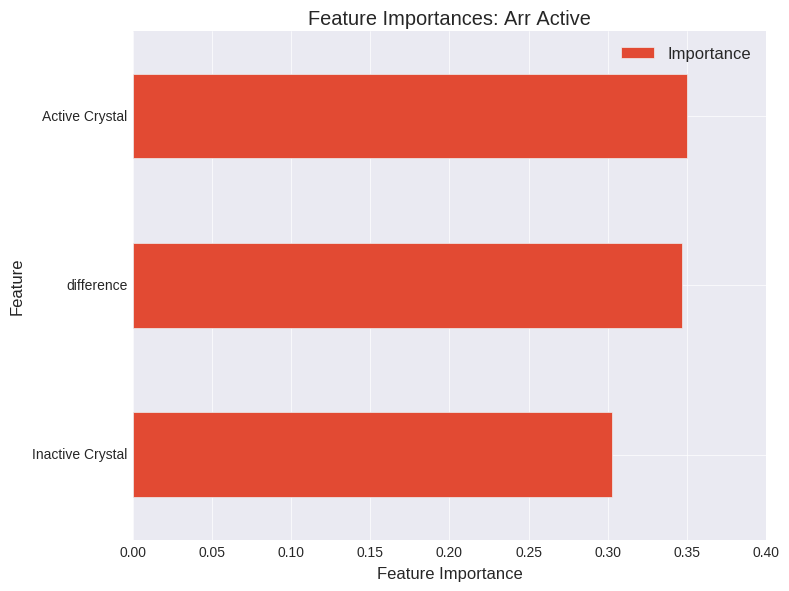

(55,)
(1, 55)


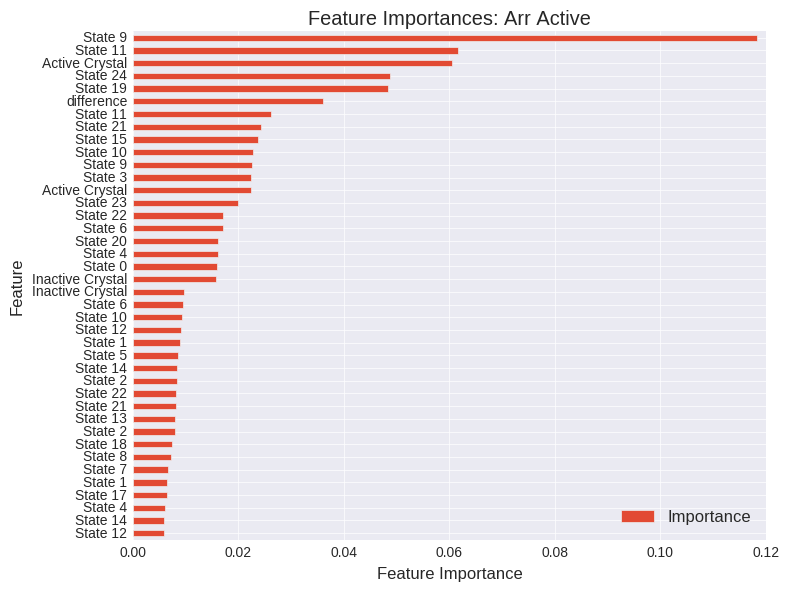

(105,)
(1, 105)


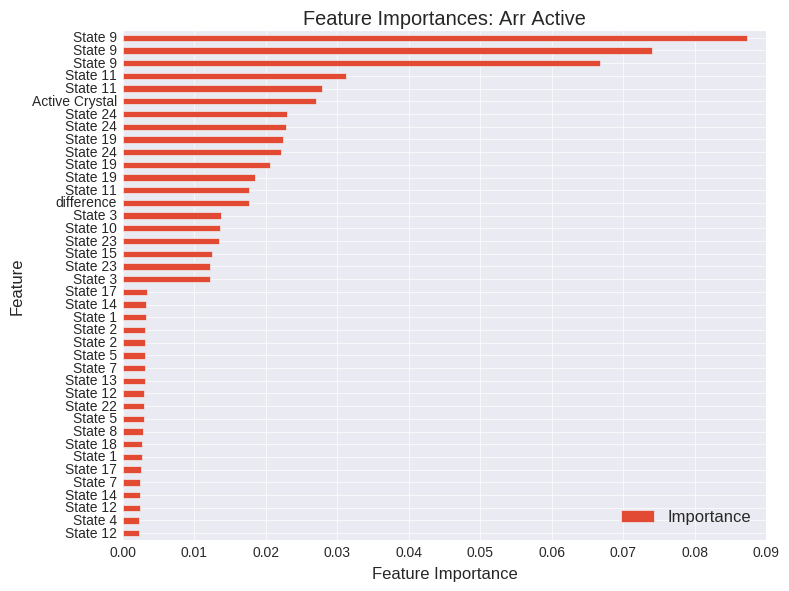

In [52]:
#XP, Arrestin

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                #["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               ["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)








In [ ]:
#SP, GProtein, LR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                #["Not G Protein Biased", "G Protein Biased"], 
                                                                ["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






In [ ]:
#SP, Arrestin, LR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                #["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               ["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)





In [ ]:
X_df.loc[["salbutamol", "salmeterol", "r_isopreterenol", "norepinephrine", "r_epinephrine", "ethylnorepinephrine"]]["State 3"]

In [ ]:
#SP, agonists only, LR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)




In [ ]:
#SP, agonists only, RFR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)



In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)


In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)


In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)











In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)










In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                #["Not G Protein Biased", "G Protein Biased"], 
                                                                ["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)









In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                #["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               ["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)








In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)







In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)






In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)





In [ ]:
all_ligands_dir = "/home/enf/b2ar_analysis/all_ligands"

from importlib import reload
import grids
reload(grids)
from grids import *

grid_center = "64.4, 16.9, 11.99"


#reimaged_dir = samples_dir
#mae_dir = reimaged_dir
#remove_ter(reimaged_dir)
#reorder(reimaged_dir)


#agonist_ligands = [a for a in agonist_ligands if "TA" not in a]

#pprep(mae_dir, ref = active_ref_dir, chosen_receptors = chosen_receptors, worker_pool=None, parallel=True)
#generate_grids(mae_dir, grid_center, grid_dir, remove_lig = "BIA", chosen_receptors = chosen_receptors, worker_pool=None, outer_box=25.)

precision = "SP"
htbc_dir = "/home/enf/htbc/sdfs"
docking_dir = "/home/enf/htbc/b2ar/docking_%s" %precision
grid_dir = "/home/enf/htbc/b2ar/grids"

#df = prepare_ligands(all_ligands_dir, exts = [".sdf"],
#                n_ring_conf=6, n_stereoisomers=32,
#               force_field=16, worker_pool=None,
#               parallel=True, redo=False,
#              smiles_df=None, cid_df=None,
#             binding_db=None,
#             return_df=True)

if not os.path.exists(docking_dir):
    os.makedirs(docking_dir)
if not os.path.exists(grid_dir):
    os.makedirs(grid_dir)

#chosen_ligands = df.index.values.tolist()[:2000]
chosen_ligands = [n for n in get_ligands(all_ligands_dir) if "CID" in n[0:3]]
print(chosen_ligands)
print(len(chosen_ligands))
lig_dir = all_ligands_dir
dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*1200)
#dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*1200)


#dock_ligands_and_receptors(grid_dir, docking_dir,  biased_agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = biased_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)
#dock_ligands_and_receptors(grid_dir, docking_dir, agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = agonist_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)





In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)




In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)





In [ ]:
y

In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *

#import plots
#reload(plots)
#from plots import *

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Not G Protein Biased", "G Protein Biased"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)



In [ ]:
plt.hist(bret[arr_col], bins=50)
plt.show()

In [ ]:
analysis_dir

In [ ]:
save_name

In [ ]:
C_df.sort("Active Crystal", ascending=False, inplace=False).iloc[:10]

In [ ]:
save_name

In [ ]:
diff_results_t100_0pt8 = do_regression_experiment(features, y_gpr-y_arr, feature_names, 100, 0.9, regularize=False, model="rfr")

In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *


analyze_regression_experiment(diff_results_t100_0pt8, feature_names,
                                  ddg_df.columns.values, common_ligands, "Regression GProtein vs. Arrestin", analysis_dir)

In [ ]:
analysis_dir

In [ ]:
list(results_dict[save_name].keys())

In [195]:
#model = results_dict[save_name]['Crystal Structures'][0]
#model = results_dict[save_name]['(MSM + Crystal) Docking'][0]
model = results_dict[save_name]['MSM ddG + Crystal Docking'][0]


y_proba =model.predict_proba(ddg_df.values)
bias_test_df = pd.DataFrame(y_proba, index=ddg_df.index, columns=["class A", "class B", "class C"]).sort("class B", ascending=False, inplace=False)

#y_proba =model.predict_proba(C_df.values)
#bias_test_df = pd.DataFrame(y_proba, index=C_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)

In [ ]:
#model = results_dict[save_name]['Crystal Structures'][0]
#model = results_dict[save_name]['(MSM + Crystal) Docking'][0]
gpr_0pt6_model = results_dict['gprot-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]
arr_0pt6_model = results_dict['arr-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]

gpr_0pt3_model = results_dict['gprot-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]
arr_0pt3_model = results_dict['arr-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]

gpr_0pt6_proba = gpr_0pt6_model.predict_proba(ddg_df.values)
arr_0pt6_proba = arr_0pt6_model.predict_proba(ddg_df.values)

gpr_0pt3_proba = gpr_0pt3_model.predict_proba(ddg_df.values)
arr_0pt3_proba = arr_0pt3_model.predict_proba(ddg_df.values)

mm = preprocessing.MinMaxScaler()

balanced_prob = gpr_0pt6_proba[:,1] * arr_0pt6_proba[:,1]
gprot_biased_prob = gpr_0pt6_proba[:,1] * arr_0pt3_proba[:,0]
arr_biased_prob = gpr_0pt3_proba[:,0] * arr_0pt6_proba[:,1]

balanced_df = pd.DataFrame(balanced_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)
arr_biased_df = pd.DataFrame(arr_biased_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)
gprot_biased_df = pd.DataFrame(gprot_biased_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)

In [ ]:
list(results_dict.keys())

In [196]:
#p_bias_df = pd.DataFrame(gprot_test_df["class B"].multiply(arr_test_df.loc[gprot_test_df.index]["class A"]), index=gprot_test_df.index, columns=["p_gprot_biased"]).sort("p_gprot_biased", inplace=False, ascending=False)
p_bias_df = bias_test_df
p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" != n[0]]]

,class A,class B,class C
ta-2005,5.186026e-07,0.975515,0.024485
procaterol,1.368493e-02,0.962388,0.023927
olodaterol,1.276162e-07,0.940738,0.059262
isopropylnorsynephrine,3.674486e-05,0.927088,0.072876
CID_10087493,5.087285e-04,0.919079,0.080412
CID_10353067,2.120717e-02,0.917409,0.061384
skf56301,6.807293e-03,0.907548,0.085644
TERBSN,2.891347e-06,0.905688,0.094309
3p0g_lig,1.455661e-02,0.905474,0.079970
CID_10443654,1.270143e-03,0.890659,0.108071


In [197]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
smiles_list, compound_names, pc_smiles, pc_names = convert_sdfs_to_compounds(["/home/enf/htbc/sdfs/%s.sdf" %f for f in p_bias_df.index.values], parallel=True, worker_pool=dview)
smiles_list = [s.strip() for s in smiles_list]
pc_smiles = [s.strip() for s in pc_smiles]
compound_names_df = pd.DataFrame(list(zip(smiles_list, compound_names, pc_smiles, pc_names)), index=p_bias_df.index, columns=["smiles", "pubchem_name", "pubchem_smiles", "alternate_name"])
#for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:100]:
#    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
#        a = str(mol)
#        break
#    c = get_compounds(a, namespace='smiles')
    #print(c[0].synonyms)

Getting SMILES from SDFs...
Done. Now getting compound names from SMILES...
Done. returning compound names.


In [ ]:
import pybel as pb
save_file = "%s/top_gprot_biased_scl.sdf" %analysis_dir
save_dir = "%s/top_gprot_biased_scl" %analysis_dir
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
filewriter = pb.Outputfile("sdf", save_file, overwrite=True)
for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:20]:
    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
        print(mol)
        filewriter.write(mol)
        subprocess.call("cp /home/enf/htbc/sdfs/%s.sdf %s/%s.sdf" %(lig, save_dir, lig), shell=True)
filewriter.close()

In [ ]:
for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/_120748.sdf"):
    print(mol)
    print(mol.write("can"))

In [ ]:
"CC(NC([C@@H](c1ccc(cc1)O)O)C)COc1ccccc1\n\t".strip()

In [ ]:
save_file

In [199]:
p_bias_df[["pubchem_name", "smiles", "alternate_smiles", "alternate_name"]] = compound_names_df.loc[p_bias_df.index][["pubchem_name", "smiles", "pubchem_smiles", "alternate_name"]]
bret_pred_df = p_bias_df.loc[[n for n in p_bias_df.index.values if n in common_ligands]]
bret_pred_df["label"] = 0.
bret_pred_df["label"].loc[common_ligands] = y
from rdkit.ML.Scoring.Scoring import CalcAUC
CalcAUC(bret_pred_df.values[:,(0,1)], col=1)#, alpha=10)

0.0

In [200]:
bret_pred_df

,class A,class B,class C,pubchem_name,smiles,alternate_smiles,alternate_name,label
CID_10087493,5.087285e-04,0.919079,0.080412,,,,,1.0
CID_10353067,2.120717e-02,0.917409,0.061384,,,,,1.0
CID_10443654,1.270143e-03,0.890659,0.108071,,,,,1.0
CID_2083,1.519601e-03,0.885806,0.112674,,,,,1.0
CID_23844,4.507448e-05,0.877411,0.122543,,,,,1.0
CID_170373,2.217884e-06,0.869963,0.130034,,,,,1.0
CID_5403,1.579518e-02,0.822520,0.161685,,,,,1.0
CID_23843,1.127674e-02,0.794457,0.194267,,,,,1.0
CID_217246,4.356005e-05,0.791976,0.207980,,,,,1.0
CID_2783,1.529731e-04,0.785723,0.214124,,,,,1.0


In [205]:
bret.loc["CID_2083"]

Number                                                         4
PaperName                                 Albuterol (Salbutamol)
Abbreviation                                                 ALB
B2AR-Gprotein, Mean                                         0.81
B2AR-Gprotein, IA(from CR curves) Mean                      0.64
B2AR-Gprotein, Log(EC50), Mean                             -7.17
B2AR-Arrestin, Mean                                         0.29
B2AR-Arrestin, IA(from CR curves) Mean                      0.31
B2AR-Arrestin, Log(EC50), Mean                             -6.69
B1AR-Gprotein, Mean                                         0.35
B1AR-Gprotein, IA(from CR curves) Mean                       0.4
B1AR-Gprotein, Log(EC50), Mean                             -5.47
B1AR-Arrestin, Mean                                         0.37
B1AR-Arrestin, IA(from CR curves) Mean                      0.36
B1AR-Arrestin Log(EC50), Mean                              -5.86
CID                      

In [ ]:
test_df= p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False)

In [ ]:
print(calc_expected_positives(0.69, 0.11, 0.02, 10))
print(calc_expected_positives(0.67, 0.1, 0.02, 10))

In [ ]:
def calc_expected_positives(recall, fpr, rho, n_test):
    return(n_test*(recall * rho) / (recall * rho + fpr * (1.-rho)))
exp_pos = []
rhos = np.linspace(0.001,0.1,1000)
for rho in rhos:
    exp_pos.append(calc_expected_positives(0.71, 0.13, rho, 10))
plt.scatter(rhos, exp_pos)
plt.xlabel("Proportion of compounds in SCL that are G Protein biased at B2AR")
plt.ylabel("Expected # Biased Ligands Out of 10 Test Ligands")
plt.savefig("%s/exp_pos.pdf" %analysis_dir)
print("enf@vsp-compute.stanford.edu:%s" %("%s/exp_pos.pdf" %analysis_dir))

In [ ]:
import pubchempy as pcp
c = pcp.get_compounds("CC(NC([C@@H](c1ccc(cc1)O)O)C)COc1ccccc1", "smiles")[0]

In [ ]:
c.canonical_smiles

In [206]:
p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False).iloc[:100]

,class A,class B,class C,pubchem_name,smiles,alternate_smiles,alternate_name
_113986,9.609738e-03,0.958933,0.031457,PROCATEROL,CC[C@@H]([C@@H](c1ccc(c2c1ccc(=O)[nH]2)O)O)NC(C)C,CCC(C(C1=C2C=CC(=O)NC2=C(C=C1)O)O)NC(C)C,PROCATEROL
_70638,6.944027e-03,0.928957,0.064099,BAS 04995465,C=CCn1c(=N)c(cc2c1nc1ccc(cn1c2=O)C)C(=O)NCc1ccco1,CC1=CN2C(=NC3=C(C2=O)C=C(C(=N)N3CC=C)C(=O)NCC4=CC=CO4)C=C1,BAS 04995465
_122949,4.185620e-07,0.921452,0.078548,Quinterenol,CC(NCC(c1ccc(c2c1cccn2)O)O)C,CC(C)NCC(C1=C2C=CC=NC2=C(C=C1)O)O,Quinterenol
_114015,1.235202e-02,0.907195,0.080453,RACTOPAMINE,CC(NCC(c1ccc(cc1)O)O)CCc1ccc(cc1)O,CC(CCC1=CC=C(C=C1)O)NCC(C2=CC=C(C=C2)O)O,RACTOPAMINE
_120259,1.476675e-02,0.897871,0.087362,SCHEMBL2489838,OCc1cc(ccc1O)C(CNC(C)(C)C)O.OCc1cc(ccc1O)C(CNC(C)(C)C)O,CC(C)(C)NCC(C1=CC(=C(C=C1)O)CO)O.CC(C)(C)NCC(C1=CC(=C(C=C1)O)CO)O,SCHEMBL2489838
_120889,6.524410e-04,0.892360,0.106988,"4-(2-{[3-(3-hydroxyphenyl)-2-methylpropyl]amino}ethyl)benzene-1,2-diol",CC(Cc1cccc(c1)O)CNCCc1ccc(c(c1)O)O,CC(CC1=CC(=CC=C1)O)CNCCC2=CC(=C(C=C2)O)O,"4-(2-{[3-(3-hydroxyphenyl)-2-methylpropyl]amino}ethyl)benzene-1,2-diol"
_21903,5.668312e-06,0.888411,0.111583,ZINC00629522,Cc1cccc(c1)S(=O)(=O)Nc1cccc(c1)c1nc2n(c1)ccc(c2)C,CC1=CC(=CC=C1)S(=O)(=O)NC2=CC=CC(=C2)C3=CN4C=CC(=CC4=N3)C,ZINC00629522
_120748,4.378969e-04,0.887725,0.111838,AC1NWAO0,CC(NC([C@@H](c1ccc(cc1)O)O)C)COc1ccccc1,CC(COC1=CC=CC=C1)NC(C)C(C2=CC=C(C=C2)O)O,isoxsuprine
_34068,2.330055e-12,0.884683,0.115317,3-[(4-benzylpiperidin-1-yl)methyl]-2-methyl-1H-indole,Cc1[nH]c2c(c1CN1CCC(CC1)Cc1ccccc1)cccc2,CC1=C(C2=CC=CC=C2N1)CN3CCC(CC3)CC4=CC=CC=C4,3-[(4-benzylpiperidin-1-yl)methyl]-2-methyl-1H-indole
_120116,2.828444e-02,0.857989,0.113727,nylidrin,CC(NC(C(c1ccc(cc1)O)O)C)CCc1ccccc1,CC(CCC1=CC=CC=C1)NC(C)C(C2=CC=C(C=C2)O)O,nylidrin


In [ ]:
from importlib import reload
import grids
reload(grids)
from grids import *

grid_center = "64.4, 16.9, 11.99"


#reimaged_dir = samples_dir
#mae_dir = reimaged_dir
#remove_ter(reimaged_dir)
#reorder(reimaged_dir)


#agonist_ligands = [a for a in agonist_ligands if "TA" not in a]

#pprep(mae_dir, ref = active_ref_dir, chosen_receptors = chosen_receptors, worker_pool=None, parallel=True)
#generate_grids(mae_dir, grid_center, grid_dir, remove_lig = "BIA", chosen_receptors = chosen_receptors, worker_pool=None, outer_box=25.)

precision = "XP"
htbc_dir = "/home/enf/htbc/sdfs/32_stereoisomers"
docking_dir = "/home/enf/htbc/b2ar/docking_xp/32-stereoisomers_6-ring-conf"
grid_dir = "/home/enf/htbc/b2ar/grids"

df = prepare_ligands(htbc_dir, exts = [".sdf"],
                n_ring_conf=6, n_stereoisomers=32,
               force_field=16, worker_pool=dview,
               parallel=None, redo=False,
              smiles_df=None, cid_df=None,
             binding_db=None,
             return_df=True)

if not os.path.exists(docking_dir):
    os.makedirs(docking_dir)
if not os.path.exists(grid_dir):
    os.makedirs(grid_dir)

chosen_ligands = p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False).index.values[:100]

lig_dir = htbc_dir
dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*60*24)

#dock_ligands_and_receptors(grid_dir, docking_dir,  biased_agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = biased_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)
#dock_ligands_and_receptors(grid_dir, docking_dir, agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = agonist_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)






Examining 134867 ligands
['/home/enf/htbc/sdfs/32_stereoisomers/_104458.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_32136.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_120037.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_86960.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_65402.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_53723.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_77939.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_85490.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_32209.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_35038.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_119369.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_132575.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_80730.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_95145.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_20522.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_92026.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_105719.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_103591.sdf', '/home/enf/htbc/sdfs/32_stereoisomers/_23464.sdf',

In [ ]:
len(dview)

p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False)

In [ ]:
from pubchempy import get_compounds
c = get_compounds(a, namespace='smiles')

In [ ]:
c[0].synonyms

In [ ]:
bias_test_df#.loc["3p0g_lig"]#.loc[bias_test_df.index.str.contains("pentyl")]

In [ ]:
[n for n in gprot_test_df.loc[[n for n in gprot_test_df.index.values if n[0] == n[0]]].index.values[:100] if n in arr_test_df.loc[[n for n in arr_test_df.index.values if n[0] == n[0]]].index.values[:100]]  



In [ ]:
sorted([n.lower() for n in common_ligands])



In [ ]:
top_clusters

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

print(np.median(a_vs_g_results_t100_single0pt2_split0pt8_logistic_cv["test_roc_aucs"], axis=0))

all_feature_names = [null_features.columns.values.tolist(), ddg_scaled.index.values.tolist() + null_features.columns.values.tolist(), all_features_df.columns.values.tolist()]
analyze_multiclass_experiment(a_vs_g_results_t100_single0pt2_split0pt8_logistic_cv, 
                              ["Crystal Structures", "MSM Docking", "MSM Docking and DEER"],
                              all_feature_names, common_agonists, analysis_dir,
                              ["Balanced vs. G Protein Biased Agonists", "Balanced vs. G Protein Biased Agonists"], X_scaled, 
                              exp_title="Arrestin vs. G Protein Two Class", coef_name="Logistic Coefficient")



In [ ]:
y.shape

In [ ]:
plt.hist(lig_continuous_features["3p0g_lig"]['Asn148_Arg333_closest_dist'], bins=100)

In [ ]:
analysis_dir = "%s_%dsamples" %(analysis_dir, n_samples)
print(analysis_dir)

In [ ]:
if not os.path.exists(analysis_dir):
    os.makedirs(analysis_dir)

In [ ]:
n_trials = 1000

y = multi_binarizer(y_gpr, [0.33, 0.66])
gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.33, 0.66])
arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
    
    
y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))   

y = multi_binarizer(y_gpr, [0.5])
gprot_results_t1000_single0pt5_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt5_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt5_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.5])
arr_results_t1000_single0pt5_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt5_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt5_split0pt6_logistic_2f, f)
    
print(np.median(np.array(gprot_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))

    
y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt2_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt2_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))

        
gprot_results_t1000_0pt8_ridge = do_regression_experiment(features, y_gpr, feature_names, n_trials, .8, regularize=False, model="RidgeCV")
with open("%s/gprot_results_t1000_0pt8_ridge.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_0pt8_ridge, f)

arr_results_t1000_0pt8_ridge = do_regression_experiment(features, y_arr, feature_names, n_trials, .8, regularize=False, model="RidgeCV")
with open("%s/arr_results_t1000_0pt8_ridge.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_0pt8_ridge, f)

print(np.median(np.array(gprot_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print(np.median(np.array(arr_results_t1000_0pt8_ridge["test_r2s"]), axis=0))





In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 1000

y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)


y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)



In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 100
y = multi_binarizer(y_arr, [0.2, 0.8])
arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False, model="logistic_cv")

arr_splits_0pt2_0pt8_model_logistic_cv_regularized = arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict[feature_names[1]][1]
save_file = "%s/arr_splits_0pt2_0pt8_model_logistic_cv_regularized.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_splits_0pt2_0pt8_model_logistic_cv_regularized, f, protocol=2)


In [ ]:
np.median(arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict["test_roc_aucs"], axis=0)

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

n_trials = 1000
y = multi_binarizer(y_arr, [0.2, 0.8])
save_file = "%s/arr_splits_0pt2_0pt8_model_logistic_cv_deer_trials%d.pkl" %(analysis_dir, n_trials)


arr_splits_0pt2_0pt8_model_logistic_cv_deer = generate_or_load_model(features, y, feature_names, n_trials, 0.8, False, "logistic_cv", save_file, redo=True)

In [ ]:
n_trials = 1000
y = multi_binarizer(y_gpr, [0.2, 0.8])
save_file = "%s/gpr_splits_0pt2_0pt8_model_logistic_cv_deer_trials%d.pkl" %(analysis_dir, n_trials)


gpr_splits_0pt2_0pt8_model_logistic_cv_deer = generate_or_load_model(features, y, feature_names, n_trials, 0.8, False, "logistic_cv", save_file, redo=True)

In [ ]:
print("hi")

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
all_feature_names = [null_features.columns.values.tolist(), ddg_scaled.index.values.tolist() + null_features.columns.values.tolist(), all_features_df.columns.values.tolist()]
analyze_multiclass_experiment(gpr_splits_0pt2_0pt8_model_logistic_cv_deer, ["Crystal Structures", "MSM Docking", "MSM Docking with DEER"], all_feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Partial Agonists", "G Protein Full Agonists"], X_scaled, exp_title="G Protein Three Class", coef_name="Logistic Coefficient")



In [ ]:
analyze_multiclass_experiment(arr_splits_0pt2_0pt8_model_logistic_cv_deer, ["Crystal Structures", "MSM Docking", "MSM Docking with DEER"], all_feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Partial Agonists", "Arrestin Full Agonists"], X_scaled, exp_title="Arrestin Three Class", coef_name="Logistic Coefficient")



In [ ]:
np.median(gpr_splits_0pt2_0pt8_model_logistic_cv_deer["test_roc_aucs"], axis=0)

In [ ]:
np.median(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"], axis=0)

In [ ]:
arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,0]

In [ ]:
from scipy.stats import rankdata
plt.scatter(rankdata(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,1]), y)

In [ ]:
plt.scatter(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,2], y)
plt.show()

In [ ]:
np.median(np.array(a_vs_g_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"]), axis=0)


In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0]

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt9_logistic_cv_2f_obs, 
                              ["Crystal Structures", "MSM Docking"],
                              top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, analysis_dir,
                              ["GProtein Antagonists", "GProtein Agonists"], X_scaled, 
                              exp_title="GProtein Class", coef_name="Logistic Coefficient")


In [ ]:
all_features_df.columns.shape

In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0][2].shape

In [ ]:
all_features_df.columns.values.tolist()

In [ ]:
print(np.median(np.array(gprot_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print(np.median(np.array(arr_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))





In [ ]:
import plots
reload(plots)
from plots import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


feature_names = top_clusters.tolist() +  ["Inactive Crystal", "Active Crystal", "Crystal Difference"] 
feature_names = [s.replace("cluster", "MSM State ") for s in feature_names]
print(feature_names)

#with open("%s/gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
#    gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = pickle.load(f)
#analyze_multiclass_experiment(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Partial Agonists", "G Protein Full Agonists"], X_scaled, exp_title="GProtein Three Clas 1000 Trials", coef_name="Logistic Coefficient")


#with open("%s/arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
#    arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = pickle.load(f)
#analyze_multiclass_experiment(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Partial Agonists", "Arrestin Full Agonists"], X_scaled, exp_title="Arrestin Three Class 1000 Trials", coef_name="Logistic Coefficient")

#plt.clf()
#analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Agonists"], X_scaled, exp_title="Two Class", coef_name="Logistic Coefficient")
with open("%s/arr_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
    arr_results_t1000_single0pt2_split0pt6_logistic_2f = pickle.load(f)
analyze_multiclass_experiment(arr_results_t1000_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"],feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Agonists"], X_scaled, exp_title="Arrestin Two Class", coef_name="Logistic Coefficient")

with open("%s/gprot_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
    gprot_results_t1000_single0pt2_split0pt6_logistic_2f = pickle.load(f)
analyze_multiclass_experiment(gprot_results_t1000_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"],feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Agonists"], X_scaled, exp_title="G Protein Two Class", coef_name="Logistic Coefficient")



In [ ]:
analysis_dir

In [ ]:
X_scaled[:,25]

In [ ]:
ddg_scaled["salbutamol"].sort(inplace=False
                             )

In [ ]:
arr_results_t100_multi_0pt6_logistic = arr_results_t100_multi_0pt_6_rfr 

= arr_results_t1000_multi_0pt_6_rfr 

In [ ]:
save_file = "%s/arr_results_t1000_multi_0pt6_logistic.pkl" %(analysis_dir)
with open(save_file, "wb") as f:
    pickle.dump(arr_results_t1000_multi_0pt6_logistic, f)
    

In [ ]:
save_file = "%s/gprot_results_t1000_multi_0pt6_logistic.pkl" %(analysis_dir)
with open(save_file, "wb") as f:
    pickle.dump(gprot_results_t1000_multi_0pt6_logistic, f)
    

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["test_r2s"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["kendall_pvalues"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["kendall_pvalues"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_multi_0pt6_logistic["test_roc_aucs"]), axis=0)


In [ ]:
plt.hist(y_gpr, bins=50)
plt.show()

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

#common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
#y_ori = y_arr - y_gpr
#y_ori = y_arr
y = multi_binarizer(y_arr, [0.33, 0.66])
#y = binarize(y_gpr, threshold=0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled, X_diff]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_results_t100_0pt9_md3 = do_regression_experiment(features, y, feature_names, n_trials, 0.9, regularize=False)

In [ ]:
save_file = "%s/arr_results_t1000_0pt9_md3.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_results_t1000_0pt9_md3, f)

In [ ]:
print(np.median(np.array(arr_results_t1000_0pt9_md3["test_r2s"]), axis=0))

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
#common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
y_ori = y_arr - y_gpr
#y_ori = y_arr
#y = y_arr
y = binarize(y_ori, threshold=-0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
#arr_classification_results_t1000_0pt6 = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False)
arr_vs_gprot_classification_results_t1000_0pt8 = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_results_1000 = do_regression_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)

In [ ]:
with open("%s/arr_vs_gprot_classification_results_t100_0pt8.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_vs_gprot_classification_results_t100_0pt8, f)

In [ ]:
print(np.median(np.array(arr_vs_gprot_classification_results_t100_0pt8["test_aucs"]), axis=0))

In [ ]:
plt.hist(y_ori,bins=50)
plt.show()

In [ ]:

save_file = "%s/arr_classification_results_t1000_0pt6.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_classification_results_t1000_0pt6, f)

In [ ]:
np.median(np.array(arr_classification_results_t1000_0pt6["test_log_aucs"]),axis=0)

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

#common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
#y_ori = y_arr - y_gpr
y_ori = y_arr
#y = y_arr
y = binarize(y_arr, threshold=0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_auc_results = do_regression_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)

In [ ]:
np.median(np.array(test_log_aucs),axis=0)

In [ ]:
np.median(np.array(gprot_results["test_r2s"]),axis=0)

In [ ]:
gprot_results["test_r2s"]

In [ ]:
features_y = copy.deepcopy(features)
features_y.append(y)
train_test_arrays = train_test_split(*features_y, train_size=0.8)
print([a.shape for a in train_test_arrays])

In [ ]:
train_test_arrays = train_test_split(*features_y, train_size=0.8)
print([a.shape for a in train_test_arrays])

In [ ]:
gprot_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
#import pickle
gprot_file = "%s/gprot_results_0pt2_XP_no-regularization.pkl"
with open("%s/gprot_results_0pt2_XP_no-regularization.pkl", "wb") as f:
    pickle.dump(gprot_results, f)
with open(gprot_file) as f:
    test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = pickle.load(f)

In [ ]:
#arrestin_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
#import pickle
arrestin_file = "%s/arrestin_results_0pt2_XP_no-regularization.pkl"
#with open("%s/arrestin_results_0pt2_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(arrestin_results, f)
with open(arrestin_file) as f:
    test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = pickle.load(f)

In [ ]:
#arrestin_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
arrestin_rfr_file = "%s/arrestin_results_rfr_XP_no-regularization.pkl"
#with open("%s/arrestin_results_rfr_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(arrestin_rfr_results, f)
with open(arrestin_rfr_file) as f:
    test_r2s, rfr_feature_importances = pickle.load(f)

In [ ]:
#gprot_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
gprot_rfr_file = "%s/gprot_results_rfr_XP_no-regularization.pkl"
#with open("%s/gprot_results_rfr_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(gprot_rfr_results, f)
with open(gprot_rfr_file) as f:
    test_r2s, rfr_feature_importances = pickle.load(f)

In [ ]:
test_aucs = np.array(test_aucs)
plt.clf()
plt.boxplot(test_aucs[:,2]-test_aucs[:,0])
plt.show()

In [ ]:
test_log_aucs = np.array(test_log_aucs)
np.percentile(test_aucs[:,2]-test_aucs[:,0], 50)

In [ ]:
import sklearn
null_preds = binarize(C[:,2])
sklearn.metrics.roc_auc_score(binarize(y, 0.2).ravel(), null_preds.ravel())

In [ ]:
test_aucs = np.array(test_aucs)
print(np.median(test_aucs, axis=0))
print(np.median(test_aucs[:,2] - test_aucs[:,0]))

In [ ]:
n_successes = len(np.where(test_aucs[:,2]-test_aucs[:,0] > 0.)[0])
nobs = test_aucs.shape[0]
statsmodels.stats.proportion.proportion_confint(count=n_successes, nobs=nobs, alpha=0.01, method='wilson')


In [ ]:
np.median(np.array(test_r2s),axis=0)

In [ ]:
arrestin_vs_gprot_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
import pickle
with open("%s/arrestin_vs_gprot_results_-0pt2_XP.pkl", "wb") as f:
    pickle.dump(arrestin_vs_gprot_results, f)

In [ ]:
arrestin_vs_gprot_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
import pickle
with open("%s/arrestin_vs_gprot_rfr_results_XP.pkl", "wb") as f:
    pickle.dump(arrestin_vs_gprot_rfr_results, f)

In [ ]:
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = arrestin_vs_gprot_results

In [ ]:
#gprotein_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])

In [ ]:
results_dict = gprot_results_t1000_multi_0pt6_logistic
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
importances_df, results_df = analyze_classification_experiment(results_dict["test_roc_aucs"],
                                               results_dict["feature_importances"],
                                               feature_names,
                                               X_scaled, y, pd.concat([ddg_scaled, null_features.transpose()], axis=0),
                                               top_clusters.tolist() + null_features.columns.values.tolist(), 
                                               common_agonists, 
                                                "Predicting G Protein Three Class, 1000 trials, 60:40 Split, XP", analysis_dir)

In [ ]:
feature_names

In [ ]:
importances_df, results_df = analyze_experiment(test_aucs, test_log_aucs, feature_importances, feature_names,
                        X_scaled, y, pd.concat([ddg_scaled, null_features.transpose()], axis=0) , top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, "Predicting Arrestin, w Crystal Features, 0.2, SP", analysis_dir)

In [ ]:
importances_df, results_df = analyze_regression_experiment(test_r2s, rfr_feature_importances, feature_names,
                        X, y, pd.concat([delta_delta_g, null_features.transpose()], axis=0) , top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, "Predicting Arrestin, RFR, w Crystal Features, SP", analysis_dir)

In [ ]:
def get_top_measurable_features(samples_normalized_features_avg_df, cluster_name):
    import re
    top_features_cluster = []
    #top_features_cluster = samples_normalized_features_avg_df.loc["cluster_name"].loc[samples_normalized_features_avg_df.loc["cluster_name"].abs() > .75].index.values
    #print(top_features_cluster)
    #print(len(top_features_cluster))
    [top_features_cluster.append(pair) for pair in samples_normalized_features_avg_df.loc[cluster_name].abs().sort(inplace=False, ascending=False).index.values[:10]]
    all_features = []
    features = []
    for f in top_features_cluster:
        fs = f.split(",")
        for i in range(0, len(fs)):
            res = int(re.findall(r'\d+', fs[i])[0])
            all_features.append(res)
            if "TRP" in fs[i] or "CYS" in fs[i] or "TYR" in fs[i] or "LYS" in fs[i]:
                features.append(res)
            
    top_features_cluster = sorted(list(set(features)))
    #print(sorted(list(set([int(re.findall(r'\d+', r)[0]) for r in all_features]))))
    #print(top_features_cluster)
    return top_features_cluster, all_features
a, b = get_top_measurable_features(samples_normalized_features_averages_df, 6)

In [ ]:
print(b)

In [ ]:
ddg_scaled[["norepinephrine", "r_epinephrine", "ethylnorepinephrine", "nebivolol", "s-carvedilol", "s-carazolol"]]

In [ ]:
print(np.mean(test_aucs, axis=0))
print(np.median(test_aucs, axis=0))
print(np.mean(test_log_aucs, axis=0))
print(np.median(test_log_aucs, axis=0))



In [ ]:
plt.scatter(ddg_scaled.loc["cluster2"][common_agonists], y)

In [ ]:
y_ori = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
y = binarize(y_ori, threshold=0.05)

X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
C = null_features.loc[common_agonists].values
D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T

X_train = D_scaled
y_train = y
f = np.zeros(X_train.shape[1])

rfr = RandomForestClassifier(n_estimators=1000, max_features='sqrt', n_jobs=-1, oob_score=True)
rfr.fit(X_train, y_train)

#top_indices = np.argsort(rfr.feature_importances_*-1.)[:min(20, X_train.shape[1])]
#rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', n_jobs=-1, oob_score=True)
#X_train = X_train[:, top_indices]
#rfr.fit(X_train, y_train)
#f[top_indices] = rfr.feature_importances_
#y_pred = rfr.predict(X_train)
#y_score = rfr.predict_proba(X_train)
top_indices=range(0,100)

In [ ]:
top_indices

In [ ]:
X_scaled.shape

In [ ]:
#G Protein, Agonist Results
test_drugs = secret_compounds + ["nebivolol", "s-carvedilol", "xamoterol", "3p0g_lig", "isoetharine", "ethylnorepinephrine", "N-Cyclopentylbutanephrine", "ta-2005", "procaterol"]
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
print(X_test)
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#G Protein, Full Agonist Results
test_drugs = secret_compounds + ["nebivolol", "s-carvedilol", "xamoterol", "3p0g_lig", "isoetharine", "ethylnorepinephrine", "N-Cyclopentylbutanephrine"]
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
common_agonists = total_activity.loc[total_activity > 0.2].index.values
plt.scatter(docking_normalized.loc["cluster21"][common_agonists], bret["B2AR-Gprotein, Mean"].subtract(bret["B2AR-Arrestin, Mean"])[common_agonists])

In [ ]:
len(common_ligands)

In [ ]:
#ARRESTIN, Partial Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Full Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
top_indices

In [ ]:
ddg_scaled.transpose().loc[secret_compounds]

In [ ]:
plot_clustermap(docking_normalized[secret_compounds].iloc[top_indices].transpose(), save_file="%s/mehrdad_clustermap.pdf" %(save_dir), method='average', z_score=None)



In [ ]:
np.median(test_aucs, axis=0)

In [ ]:
plt.scatter(ddg_scaled.loc["cluster11"][common_agonists], y)



In [ ]:
arrestin_top = [16, 80, 43, 21, 84, 38, 44, 6, 13, 99]
gprot_top = [44, 6, 83, 4, 76, 99, 62, 92, 39, 80]

arrestin_only = sorted(list(set(arrestin_top).difference(set(gprot_top))))
print(arrestin_only)
gprot_only = sorted(list(set(gprot_top).difference(set(arrestin_top))))
print(gprot_only)
both = sorted(list(set(arrestin_top).intersection(set(gprot_top))))
print(both)


In [ ]:
samples_pnas_tica.loc[importances_df.index.values.tolist()[:5]]

In [ ]:
importances_df

In [ ]:
importances_df = make_importances_df(normalized_docking_importances, top_clusters)
importances_df


In [ ]:
from sklearn.preprocessing import binarize
X = ddg_scaled[common_ligands].values.T
y = bret["B2AR-Gprotein, Mean"].loc[common_ligands].values.reshape((-1,1))
y = binarize(y, threshold=0.5)
print(np.shape(y))
from sklearn.svm import l1_min_c
from sklearn import linear_model

#cs = l1_min_c(X, y, loss='log') * np.logspace(0, 3)
cs = np.logspace(-3., 20.)
print("Computing regularization path ...")
clf = linear_model.LogisticRegression(C=1.0, penalty='l2', tol=1e-6)
coefs_ = []
for c in cs:
    clf.set_params(C=c)
    clf.fit(X, y)
    coefs_.append(clf.coef_.ravel().copy())

coefs_ = pd.DataFrame(np.array(coefs_), columns=ddg_scaled.index.values, index=np.log10(cs))
#coefs_[list(set(inactive_clusters.tolist()).intersection(set(importances_df.iloc[10:20].index.values.tolist())))].plot()
coefs_[importances_df.index.values[:5]].plot()
#plt.plot(np.log10(cs), coefs_)
#ymin, ymax = plt.ylim()
###plt.xlabel('log(C)')
#plt.ylabel('Coefficients')
##plt.title('Logistic Regression Path')
#plt.axis('tight')
#plt.show()

In [ ]:
samples_pnas_tica.loc[importances_df.index.values[:10]]

In [ ]:
plt.scatter(deltas_tica.loc[importances_df.index.values[:10]]["tIC.6"], coefs_[importances_df.index.values[:10]].values[49])

In [ ]:
plot_clustermap(ddg_scaled[common_agonists.tolist()].loc[importances_df.index.values.tolist()[:5]].transpose(), save_file="%s/msm_n-clusters%d_lag-time%d_tICs%d.pdf" %(tica_dir, n_clusters, msm_lag_time, n_components), method='average')



In [ ]:
samples_pnas_tica.loc[samples_pnas_tica["tm6_tm3_dist"] < 18.0].loc[importances_df.iloc[0:5].index].dropna()

In [ ]:
ddg_scaled["nebivolol"].subtract(ddg_scaled["s-carazolol"]).sort(inplace=False).iloc[:10]

In [ ]:
ddg_scaled["s-carvedilol"].subtract(ddg_scaled["s-carazolol"]).sort(inplace=False).iloc[:10]

In [ ]:
samples_pnas_tica.loc[["cluster74", "cluster69", "cluster13", "cluster12", "cluster66"]]

In [ ]:
import plots
reload(plots)
from plots import *
#plot_importances_barh(importances_df.values, importances_df.index.values, "MSM State Importance in Arrestin Prediction", "Feature Importance", "MSM State", "%s/arrestin_0pt5_classification_rfr.pdf" %(tica_dir), n_features=50)
importances_df.iloc[0:25].plot(kind='barh')
plt.xlabel("Feature Importance")
plt.ylabel("MSM State")
plt.title("Importance of MSM States in Predicting Arrestin Activity")
plt.savefig("%s/msm_%dstates_arrestin_0pt2_agonists_only_classification_rfr.pdf" %(tica_dir, n_clusters))
#plt.clf()


In [ ]:
X = docking_normalized[common_agonists].values.T
y = bret["B2AR-Arrestin, Mean"].subtract(bret["B2AR-Gprotein, Mean"]).loc[common_agonists].values.reshape((-1,1))
y = binarize(y, threshold=-0.2)
print(y)
from sklearn import linear_model

cs = np.logspace(-3., 200.)
clf = linear_model.LogisticRegression(C=1.0, penalty='l2', tol=1e-6)
coefs_ = []
for c in cs:
    clf.set_params(C=c)
    clf.fit(X, y)
    coefs_.append(clf.coef_.ravel().copy())

coefs_ = pd.DataFrame(np.array(coefs_), columns=ddg_scaled.index.values, index=np.log10(cs))
coefs_[importances_df.iloc[0:10].loc[samples_pnas_tica["tm6_tm3_dist"] < 9.].index].plot()
plt.xlabel("Log Regularization Parameter")
plt.ylabel("Coefficient for Arrestin Activity")
plt.title("Logistic Regression Coefficient in Predicting Arrestin Activity")
plt.savefig("%s/msm_%dstates_arrestin_0pt2_agonists_only_classification_logistic.pdf" %(tica_dir, n_clusters))
#plt.clf()

In [ ]:
np.shape(coefs_)

In [ ]:
print(np.median(np.nan_to_num(test_aucs)))
print(np.median(np.nan_to_num(C_test_aucs)))
print(np.median(np.nan_to_num(test_log_aucs)))
print(np.median(np.nan_to_num(C_test_log_aucs)))

In [ ]:
lr = LinearRegression()
states = importances_df.index.values.tolist()
model = lr.fit(X, y_ori)
pd.DataFrame(model.coef_.T, index=delta_delta_g.index, columns=["importance"]).loc[states]#.sort("importance", inplace=False)

In [ ]:
model.coef_.shape

In [ ]:
import seaborn
reload(seaborn)
import seaborn as sns
plt.style.use('ggplot')
plt.figure(figsize=(5, 5))
sns.set_style("darkgrid")
g = (auc_df
    .pipe((sns.boxplot, 'data'), orient='v', showfliers=True))
g.set_xticklabels(auc_df.columns.values, rotation=90)
sns.despine()
plt.title("AUC for Arrestin Prediction")
plt.ylabel("Frequency AUCs over Random Splits")
plt.xlabel("Featurization")
plt.show()
plt.savefig("%s/auc_arrestin_prediction_all_ligands_0pt2_cutoff.pdf" %tica_dir)

In [ ]:
corr_matrix = compute_pearson_matrix(delta_delta_g[common_agonists].values.T, y)
corr_df = pd.DataFrame(model.coef_.T, index=delta_delta_g.index.values, columns=["Correlation"]).sort("Correlation",inplace=False)
#corr_df.loc[["cluster80", "cluster16", "cluster43", "cluster44"]].plot(kind='barh')
corr_df.loc[importances_df.index.values[:20]].sort("Correlation", inplace=False).plot(kind='barh')#, figsize=(5,20))
plt.xlabel("Pearsson Correlation with Arrestin Activity")
plt.ylabel("MSM State")
plt.title("Correlation of MSM States with Arrestin Activity")


In [ ]:
samples_pnas_tica.loc[corr_df.loc[importances_df.index.values[:20]].sort("Correlation", inplace=False).index.values]

In [ ]:
df = copy.deepcopy(aggregate_docking_msm)
df[df.columns.values] = scale(df.values)
plt.scatter(df[common_ligands].loc["cluster13"].values, bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.T)

In [ ]:
bret

In [ ]:
import sklearn
reload(sklearn)
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import binarize
from sklearn import cross_validation

test_accuracies = []
test_aucs = []
test_log_aucs = []
C_test_aucs = []
C_test_log_aucs = []
n_trials = 100
feature_importances = []

for j in range(0,n_trials):
    print(j)

    X = delta_delta_g[common_ligands].values.T
    C = null_features.loc[common_ligands].values
    y = bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.reshape((-1,1))
    y = binarize(y, threshold=0.5)

    X_train, X_test, y_train, y_test, C_train, C_test = sklearn.cross_validation.train_test_split(X, y, C, train_size=0.8, stratify=y)
    
    sc = StandardScaler()
    sc.fit(X_train)
    X_train = sc.transform(X_train)
    X_test = sc.transform(X_test)

    sc = StandardScaler()
    sc.fit(C_train)
    C_train = sc.transform(C_train)
    C_test = sc.transform(C_test)
 
    rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=2, n_jobs=-1, oob_score=True)
    rfr.fit(X_train, y_train)
    feature_importances.append(rfr.feature_importances_)
    y_pred = rfr.predict(X_test)
    test_accuracies.append(np.sqrt(np.mean(np.square(y_test-y_pred.reshape((-1,1))))))
    y_score = rfr.predict_proba(X_test)
    auc, logauc = compute_auc(y_test, y_score)
    test_aucs.append(auc)
    test_log_aucs.append(logauc)
    
    rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=2, n_jobs=-1, oob_score=True)
    rfr.fit(C_train, y_train)
    C_y_pred = rfr.predict(C_test)
    y_score = rfr.predict_proba(C_test)
    auc, logauc = compute_auc(y_test, y_score)
    C_test_aucs.append(auc)
    C_test_log_aucs.append(logauc)

    
    

    

In [ ]:
import seaborn
reload(seaborn)
import seaborn as sns
auc_df = pd.DataFrame(np.vstack([test_aucs, C_test_aucs]).T, columns=["MSM States", "Crystal Structures"])

plt.style.use('ggplot')
plt.figure(figsize=(5, 5))
sns.set_style("darkgrid")
g = (auc_df
    .pipe((sns.boxplot, 'data'), orient='v', showfliers=True))
#g.set_xticklabels(experiments.columns.values, rotation=90)
sns.despine()
plt.title("AUC for G Protein Prediction")
plt.ylabel("Frequency AUCs over Random Splits")
plt.xlabel("Featurization")
plt.show()
plt.savefig("%s/msm_n-states%d_auc_gprot_prediction_cutoff0pt5.pdf" %(tica_dir, n_clusters))

In [ ]:
importances_df = make_importances_df(feature_importances, delta_delta_g.index.values.tolist())
importances_df



In [ ]:
import sklearn
from sklearn.linear_model import LinearRegression, Lasso
model = Lasso(alpha=0.0001)                                
model.fit(ddg_scaled[common_agonists].values.T, bret.loc[common_agonists]["B2AR-Arrestin, Mean"].subtract(bret.loc[common_agonists]["B2AR-Gprotein, Mean"].values))
pd.DataFrame(model.coef_, index=ddg_scaled.index, columns=["importance"]).sort("importance", inplace=False)

In [ ]:
print(np.median(np.nan_to_num(test_aucs)))
print(np.median(np.nan_to_num(C_test_aucs)))
print(np.median(np.nan_to_num(test_log_aucs)))
print(np.median(np.nan_to_num(C_test_log_aucs)))

In [ ]:
import plots
reload(plots)
from plots import *
#plot_importances_barh(importances_df.values, importances_df.index.values, "MSM State Importance in Arrestin Prediction", "Feature Importance", "MSM State", "%s/arrestin_0pt5_classification_rfr.pdf" %(tica_dir), n_features=50)
importances_df.iloc[0:25].plot(kind='barh')
plt.xlabel("Feature Importance")
plt.ylabel("MSM State")
plt.title("Importance of MSM States in Predicting G Protein Activity")
#plt.savefig("%s/msm_%dstates_gprot_0pt5_classification_rfr.pdf" %(tica_dir, n_clusters))
#plt.clf()



In [ ]:
corr_matrix = compute_pearson_matrix(ddg_scaled[common_ligands].values.T, y)
corr_df = pd.DataFrame(model.coef_, index=ddg_scaled.index.values, columns=["Correlation"])
corr_df.loc[importances_df.index.values[:10]].sort("Correlation", inplace=False).plot(kind='barh')
plt.xlabel("Pearsson Correlation with G Protein Activity")
plt.ylabel("MSM State")
plt.title("Correlation of MSM States with G Protein Activity")
#plt.savefig("%s/msm_%dstates_gprot_0pt5_classification_correlations.pdf" %(tica_dir, n_clusters))
#plt.clf()




In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)